In [1]:
from __future__ import print_function
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy

print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  1.13.1
Torchvision Version:  0.14.1


In [2]:
data_dir = "/media/abdul/8266fdc5-61f6-47d6-9e82-aa0e56f4b319/Ilyas/classification/cifar/cifar10"


num_classes = 10
batch_size = 32
num_epochs = 10

model = models.mobilenet_v2(pretrained=True)
model.classifier = nn.Linear(1280, num_classes)
model

/home/abdul/miniconda3/envs/detr/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/abdul/miniconda3/envs/detr/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [3]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25):
    
    since = time.time()

    val_acc_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
       # print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    if phase == 'train':

                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                        
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_acc_history.append(epoch_acc)

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history

def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [4]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((32,32)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((32,32)),
        transforms.ToTensor(),
        #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

print("Initializing Datasets and Dataloaders...")

# Create training and validation datasets
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
# Create training and validation dataloaders
dataloaders_dict = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4) for x in ['train', 'val']}

# Detect if we have a GPU available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Initializing Datasets and Dataloaders...


In [5]:
train_dataset_size = len(image_datasets['train'])
val_dataset_size = len(image_datasets['val'])

print("Number of training samples: ", train_dataset_size)
print("Number of validation samples: ", val_dataset_size)

Number of training samples:  50000
Number of validation samples:  10000


In [6]:
model_ft = model.to(device)

params_to_update = []

for name, param in model_ft.named_parameters():
    param.requires_grad == False
    

for name,param in model_ft.named_parameters():

    if 'features.17' in name:
        param.requires_grad == True
        params_to_update.append(param)        

    if 'features.18' in name:
        param.requires_grad == True
        params_to_update.append(param)
        
    if 'classifier' in name:
        param.requires_grad == True
        params_to_update.append(param)
        

In [6]:
optimizer_ft = optim.SGD(params_to_update, lr=0.0005, momentum=0.9)

criterion = nn.CrossEntropyLoss()

model_ft, hist = train_model(model_ft, 
                             dataloaders_dict, 
                             criterion, 
                             optimizer_ft, 
                             num_epochs=25)

----------
train Loss: 1.6019 Acc: 0.4283
val Loss: 1.4109 Acc: 0.5051

----------
train Loss: 1.4650 Acc: 0.4784
val Loss: 1.3593 Acc: 0.5217

----------
train Loss: 1.4209 Acc: 0.4954
val Loss: 1.3731 Acc: 0.5214

----------
train Loss: 1.3889 Acc: 0.5061
val Loss: 1.3202 Acc: 0.5406

----------
train Loss: 1.3696 Acc: 0.5133
val Loss: 1.3115 Acc: 0.5446

----------
train Loss: 1.3500 Acc: 0.5201
val Loss: 1.3061 Acc: 0.5434

----------
train Loss: 1.3318 Acc: 0.5267
val Loss: 1.2633 Acc: 0.5597

----------
train Loss: 1.3174 Acc: 0.5322
val Loss: 1.3197 Acc: 0.5476

----------
train Loss: 1.3058 Acc: 0.5380
val Loss: 1.2580 Acc: 0.5621

----------
train Loss: 1.2952 Acc: 0.5405
val Loss: 1.2671 Acc: 0.5630

----------
train Loss: 1.2834 Acc: 0.5447
val Loss: 1.2971 Acc: 0.5563

----------
train Loss: 1.2756 Acc: 0.5463
val Loss: 1.2873 Acc: 0.5626

----------
train Loss: 1.2723 Acc: 0.5483
val Loss: 1.3106 Acc: 0.5556

----------
train Loss: 1.2543 Acc: 0.5551
val Loss: 1.2363 Acc: 

In [7]:
img_test_transforms = transforms.Compose([
    transforms.Resize((32,32)),
        #transforms.CenterCrop(224),
        transforms.ToTensor(),
        #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

test_data = torchvision.datasets.ImageFolder(data_dir + '/val',transform=img_test_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, 
                                          shuffle=False, num_workers=4)

In [11]:
model_ft.eval()  # it-disables-dropout
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in test_loader:
       
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_ft(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        print("input",labels)
        print("output",predicted)
        
        correct += (predicted == labels).sum().item()
          
    print('Test Accuracy of the model: {} %'.format(100 * correct / total))
    print('correct: {:d}  total: {:d}'.format(correct, total))

input tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
output tensor([1, 7, 1, 3, 1, 8, 1, 1, 7, 0, 1, 7, 8, 1, 1, 1, 3, 1, 1, 7, 1, 0, 1, 1,
        8, 1, 7, 1, 1, 7, 1, 3], device='cuda:0')
input tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
output tensor([1, 1, 1, 8, 1, 6, 1, 1, 1, 8, 1, 7, 4, 1, 7, 5, 6, 6, 7, 1, 1, 1, 7, 6,
        1, 1, 1, 3, 1, 3, 1, 3], device='cuda:0')
input tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
output tensor([1, 1, 7, 1, 3, 1, 1, 3, 1, 4, 7, 1, 1, 7, 6, 3, 1, 1, 1, 1, 7, 7, 1, 1,
        1, 1, 7, 6, 6, 1, 0, 7], device='cuda:0')
input tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
output tensor([1, 1, 6, 4, 1, 6, 7, 1, 1, 7, 

input tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
output tensor([8, 3, 1, 1, 0, 1, 7, 1, 8, 6, 1, 1, 1, 4, 1, 3, 0, 1, 7, 3, 1, 1, 3, 6,
        1, 1, 1, 4, 1, 1, 5, 7], device='cuda:0')
input tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
output tensor([1, 6, 6, 1, 7, 0, 4, 7, 6, 1, 4, 1, 1, 1, 1, 5, 1, 1, 7, 7, 1, 1, 1, 5,
        6, 1, 7, 0, 6, 1, 6, 0], device='cuda:0')
input tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
output tensor([1, 5, 1, 8, 0, 0, 0, 1, 1, 4, 0, 1, 0, 6, 5, 0, 7, 3, 3, 9, 1, 1, 8, 8,
        1, 6, 4, 3, 8, 3, 1, 1], device='cuda:0')
input tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
output tensor([6, 1, 6, 3, 1, 6, 1, 1, 1, 1, 

input tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2], device='cuda:0')
output tensor([8, 6, 1, 1, 1, 0, 7, 5, 0, 1, 1, 1, 0, 6, 1, 5, 3, 6, 1, 1, 1, 7, 7, 6,
        7, 1, 8, 7, 7, 1, 3, 6], device='cuda:0')
input tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2], device='cuda:0')
output tensor([0, 7, 0, 1, 1, 5, 1, 1, 1, 1, 1, 8, 1, 8, 6, 1, 0, 1, 8, 1, 1, 1, 0, 7,
        3, 6, 1, 1, 5, 1, 1, 7], device='cuda:0')
input tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2], device='cuda:0')
output tensor([6, 3, 1, 1, 1, 1, 1, 1, 1, 5, 1, 6, 3, 1, 1, 1, 1, 0, 1, 0, 0, 1, 5, 0,
        1, 1, 7, 7, 1, 1, 1, 6], device='cuda:0')
input tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2], device='cuda:0')
output tensor([1, 1, 1, 7, 3, 1, 7, 1, 1, 1, 

input tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')
output tensor([1, 1, 1, 6, 1, 3, 6, 1, 3, 1, 1, 1, 7, 6, 1, 7, 0, 6, 0, 1, 6, 1, 1, 1,
        6, 7, 8, 1, 3, 0, 1, 1], device='cuda:0')
input tensor([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')
output tensor([7, 1, 6, 1, 6, 1, 7, 7, 4, 1, 1, 0, 6, 8, 8, 6, 1, 7, 7, 1, 0, 7, 7, 1,
        1, 1, 7, 7, 6, 3, 1, 6], device='cuda:0')
input tensor([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')
output tensor([1, 1, 8, 7, 6, 1, 6, 3, 6, 5, 6, 8, 3, 1, 1, 1, 6, 1, 1, 1, 7, 1, 7, 0,
        6, 6, 6, 7, 1, 1, 1, 0], device='cuda:0')
input tensor([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')
output tensor([6, 6, 8, 1, 7, 6, 6, 1, 1, 7, 

input tensor([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4], device='cuda:0')
output tensor([1, 6, 1, 1, 1, 1, 3, 1, 1, 7, 1, 1, 1, 1, 0, 7, 7, 7, 7, 1, 1, 1, 3, 1,
        6, 1, 1, 6, 1, 1, 1, 1], device='cuda:0')
input tensor([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4], device='cuda:0')
output tensor([6, 1, 3, 1, 1, 1, 7, 1, 1, 1, 1, 1, 7, 1, 1, 1, 1, 1, 1, 1, 1, 1, 7, 1,
        7, 1, 1, 7, 1, 1, 1, 1], device='cuda:0')
input tensor([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4], device='cuda:0')
output tensor([1, 7, 7, 7, 1, 4, 0, 8, 1, 1, 7, 6, 7, 1, 1, 1, 7, 1, 1, 5, 1, 1, 1, 1,
        1, 6, 7, 1, 6, 1, 0, 1], device='cuda:0')
input tensor([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4], device='cuda:0')
output tensor([1, 1, 1, 1, 1, 1, 7, 5, 4, 6, 

input tensor([4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5], device='cuda:0')
output tensor([7, 1, 1, 3, 6, 7, 1, 1, 0, 6, 1, 1, 6, 7, 7, 1, 6, 7, 0, 0, 1, 7, 3, 1,
        0, 1, 7, 1, 7, 8, 6, 3], device='cuda:0')
input tensor([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5], device='cuda:0')
output tensor([0, 6, 1, 6, 6, 6, 6, 7, 1, 1, 0, 6, 6, 6, 1, 7, 1, 6, 3, 0, 6, 1, 6, 1,
        6, 6, 1, 7, 0, 7, 6, 0], device='cuda:0')
input tensor([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5], device='cuda:0')
output tensor([8, 7, 1, 7, 5, 6, 0, 6, 1, 9, 1, 1, 3, 6, 1, 6, 0, 6, 4, 7, 6, 7, 7, 6,
        5, 1, 1, 7, 3, 0, 0, 1], device='cuda:0')
input tensor([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5], device='cuda:0')
output tensor([1, 6, 4, 6, 3, 1, 4, 7, 0, 7, 

input tensor([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6], device='cuda:0')
output tensor([5, 1, 0, 1, 3, 6, 0, 0, 6, 0, 7, 0, 1, 6, 1, 7, 1, 7, 1, 6, 1, 1, 6, 6,
        3, 6, 1, 1, 7, 4, 3, 1], device='cuda:0')
input tensor([6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6], device='cuda:0')
output tensor([7, 1, 7, 1, 6, 1, 1, 6, 5, 1, 6, 1, 6, 6, 6, 1, 6, 1, 1, 6, 1, 7, 7, 1,
        1, 1, 6, 3, 5, 1, 6, 1], device='cuda:0')
input tensor([6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6], device='cuda:0')
output tensor([1, 3, 1, 1, 1, 1, 1, 1, 6, 1, 1, 1, 5, 0, 1, 1, 6, 1, 3, 1, 6, 1, 6, 5,
        1, 3, 5, 1, 6, 3, 1, 7], device='cuda:0')
input tensor([6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6], device='cuda:0')
output tensor([3, 3, 6, 6, 1, 1, 6, 1, 7, 1, 

output tensor([3, 6, 7, 1, 7, 6, 1, 1, 6, 3, 1, 7, 1, 8, 1, 1, 5, 3, 7, 3, 0, 1, 1, 7,
        3, 1, 7, 8, 1, 6, 6, 7], device='cuda:0')
input tensor([7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
        7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')
output tensor([1, 3, 1, 8, 8, 1, 1, 7, 8, 1, 8, 7, 1, 6, 1, 7, 1, 1, 3, 7, 1, 1, 1, 7,
        1, 3, 1, 6, 6, 7, 1, 1], device='cuda:0')
input tensor([7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
        7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')
output tensor([7, 0, 3, 5, 3, 0, 1, 5, 1, 7, 1, 6, 1, 1, 1, 7, 3, 1, 7, 1, 3, 3, 1, 3,
        3, 1, 6, 3, 1, 1, 3, 7], device='cuda:0')
input tensor([8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
        8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')
output tensor([7, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 7, 8, 1, 1, 1, 1, 1, 7, 4, 1, 1, 1, 1,
        1, 4, 1, 7, 1, 3, 1, 1], device='cuda:0')
input tensor([8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 

input tensor([8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
        8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')
output tensor([7, 1, 3, 1, 3, 0, 1, 1, 1, 6, 1, 0, 1, 1, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 7], device='cuda:0')
input tensor([8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
        8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')
output tensor([7, 1, 9, 1, 5, 1, 7, 1, 3, 1, 1, 7, 4, 1, 6, 6, 4, 1, 1, 7, 1, 1, 1, 1,
        1, 6, 1, 6, 1, 3, 8, 0], device='cuda:0')
input tensor([8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
        8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')
output tensor([1, 7, 0, 1, 1, 7, 1, 1, 1, 6, 8, 1, 1, 1, 1, 7, 5, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 8, 8, 1, 1, 1, 6], device='cuda:0')
input tensor([8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
        9, 9, 9, 9, 9, 9, 9, 9], device='cuda:0')
output tensor([3, 8, 1, 1, 1, 7, 4, 8, 1, 1, 

In [14]:
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

classes = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

loader = transforms.Compose([transforms.Resize((32,32)),
                             transforms.ToTensor(), 
                              #normalize
                            ])

def image_loader(image_name):

    image = Image.open(image_name)
    image = image.convert('RGB')
    image = loader(image)
    image = image.unsqueeze(0)  
    image = image.cuda()
    return image  #assumes that you're using GPU

model = model_ft
model.eval()
image = image_loader('/media/abdul/8266fdc5-61f6-47d6-9e82-aa0e56f4b319/Ilyas/classification/cifar/cifar10/train/cat/0004.png')
pred = (model(image)).data.cpu().numpy().argmax()

print('Prediction: ', pred)
print('Class: ', classes[pred])

Prediction:  7
Class:  horse


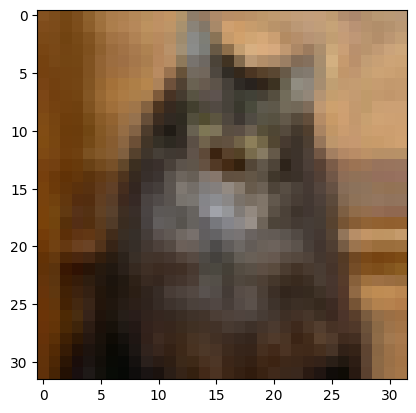

In [15]:
def imshow(img):
    img = Image.open(img)
    plt.imshow(img)  
    
imshow('/media/abdul/8266fdc5-61f6-47d6-9e82-aa0e56f4b319/Ilyas/classification/cifar/cifar10/train/cat/0004.png')

In [11]:


import glob

images = []
for f in glob.iglob("/media/abdul/8266fdc5-61f6-47d6-9e82-aa0e56f4b319/Ilyas/Gender/cifar/cifar10/val/*/*"):
    images.append(f)

Prediction:  3    Class:  cat


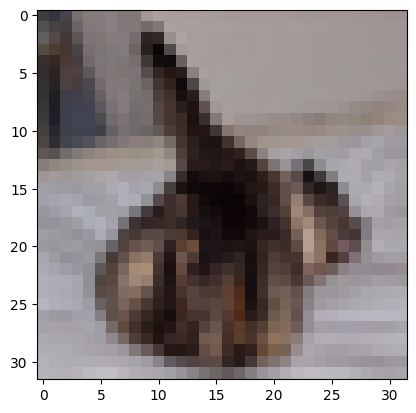

Prediction:  3    Class:  cat


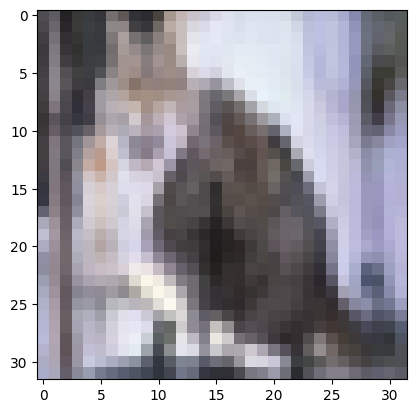

Prediction:  7    Class:  horse


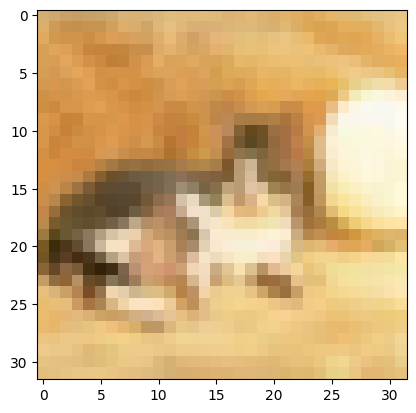

Prediction:  0    Class:  airplane


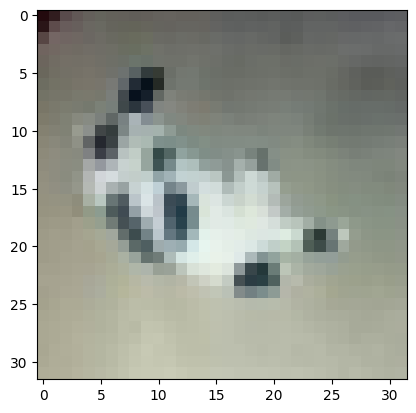

Prediction:  3    Class:  cat


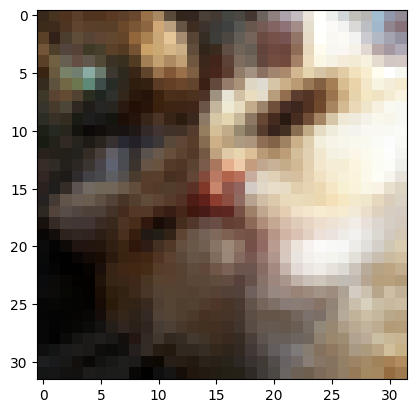

Prediction:  2    Class:  bird


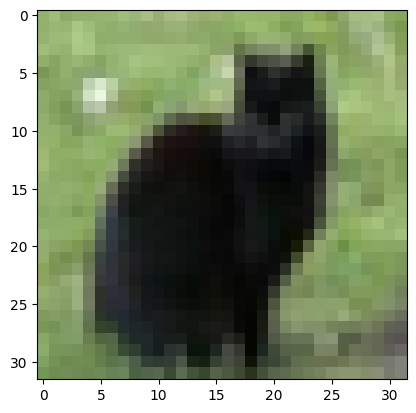

Prediction:  2    Class:  bird


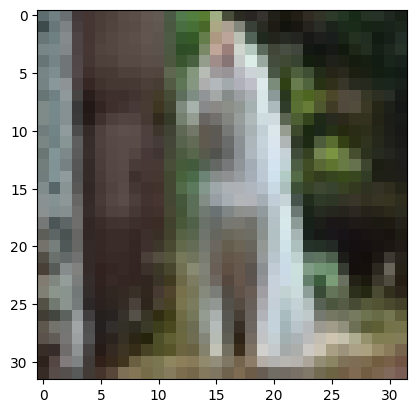

Prediction:  3    Class:  cat


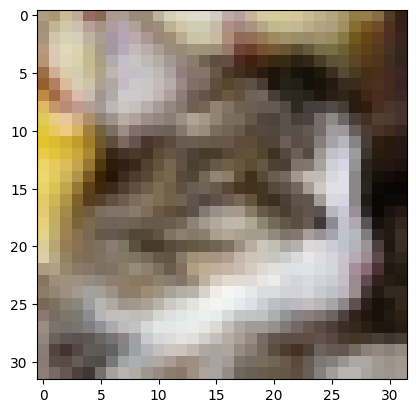

Prediction:  3    Class:  cat


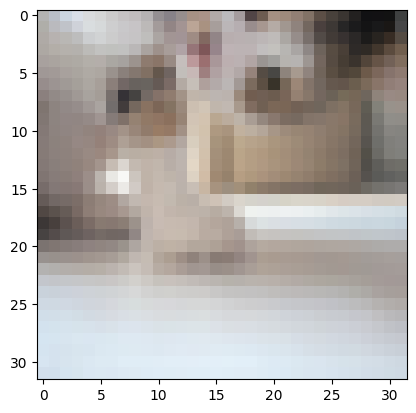

Prediction:  3    Class:  cat


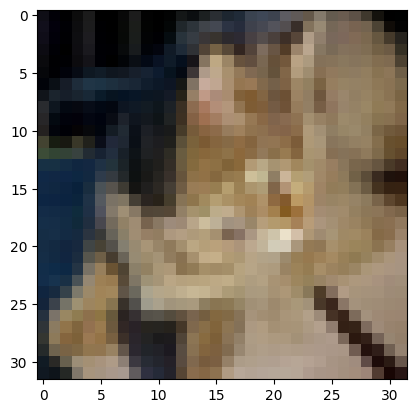

Prediction:  3    Class:  cat


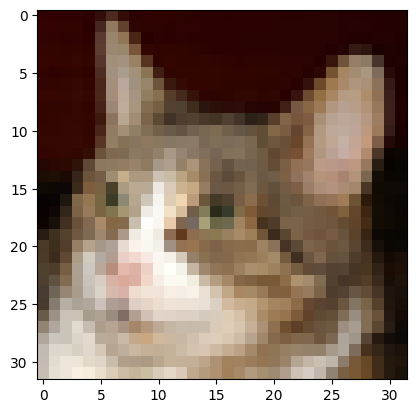

Prediction:  9    Class:  truck


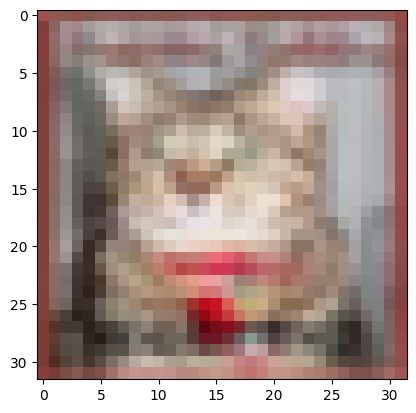

Prediction:  3    Class:  cat


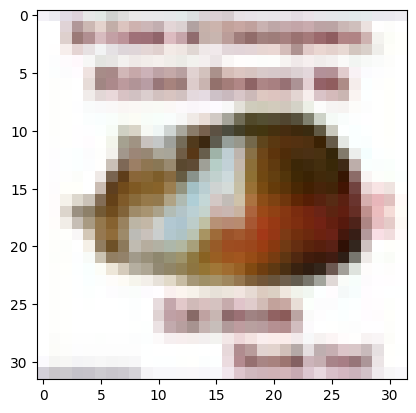

Prediction:  3    Class:  cat


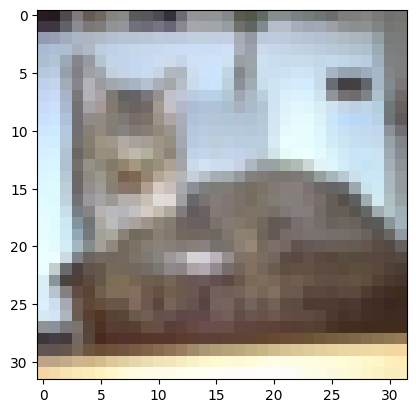

Prediction:  3    Class:  cat


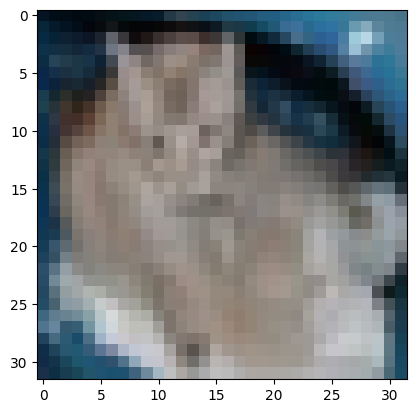

Prediction:  5    Class:  dog


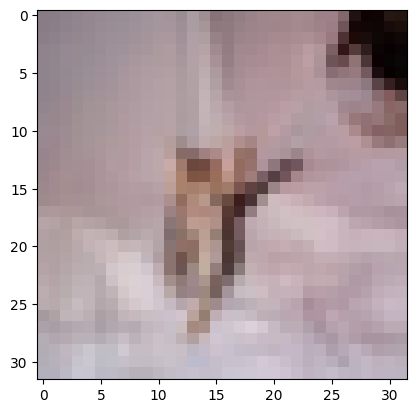

Prediction:  6    Class:  frog


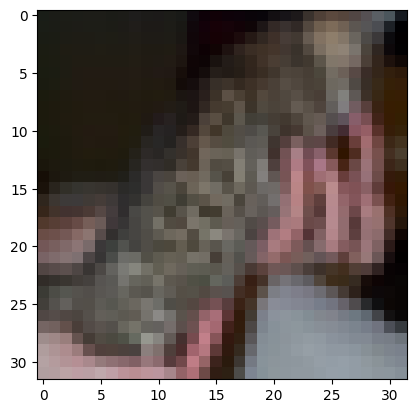

Prediction:  3    Class:  cat


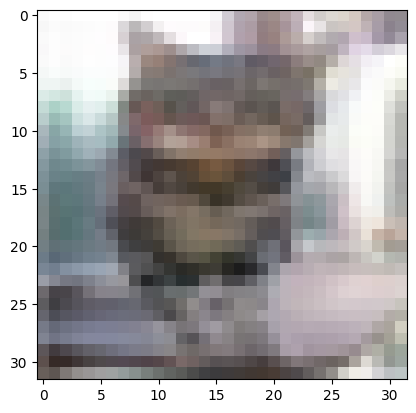

Prediction:  8    Class:  ship


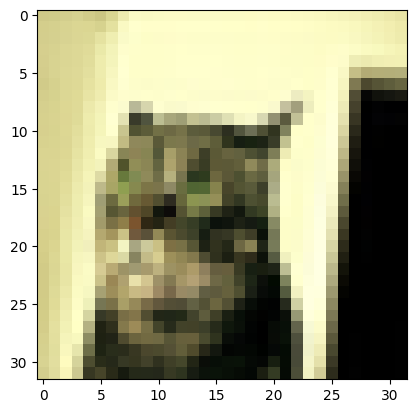

Prediction:  3    Class:  cat


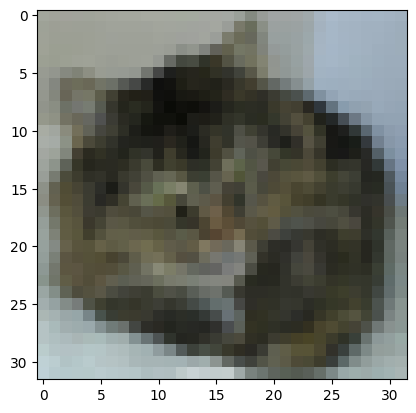

Prediction:  3    Class:  cat


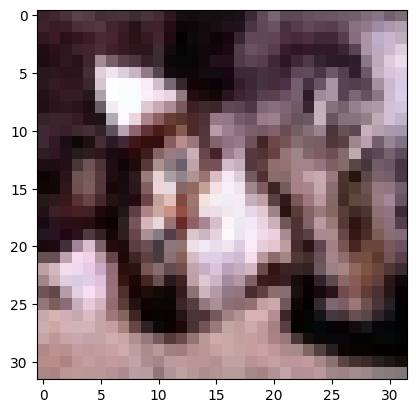

Prediction:  6    Class:  frog


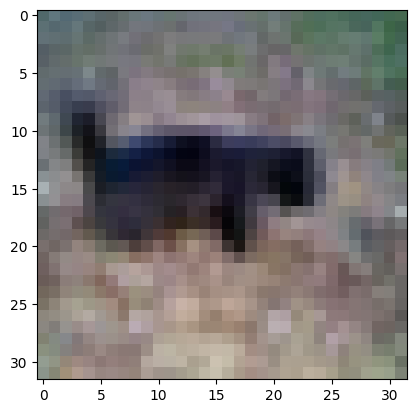

Prediction:  2    Class:  bird


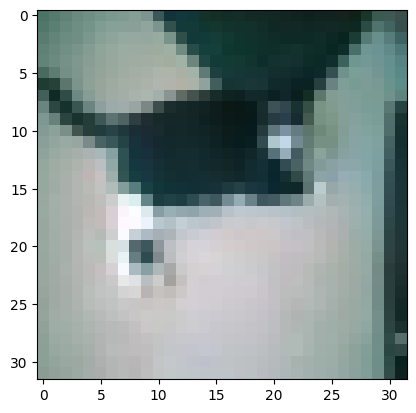

Prediction:  5    Class:  dog


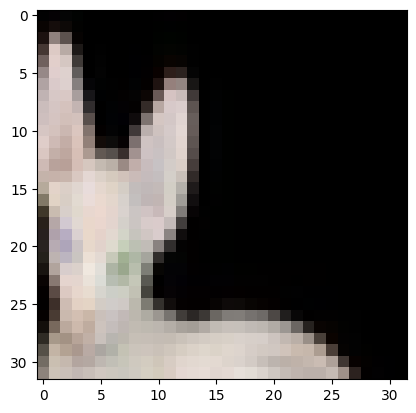

Prediction:  7    Class:  horse


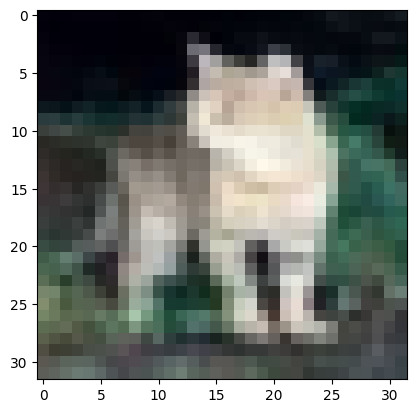

Prediction:  3    Class:  cat


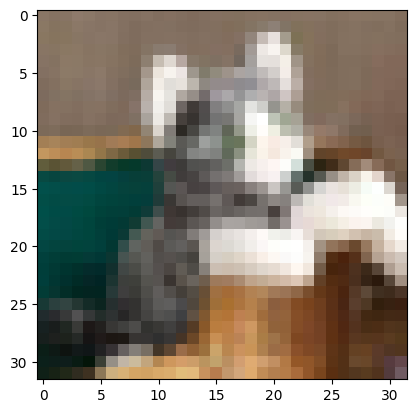

Prediction:  7    Class:  horse


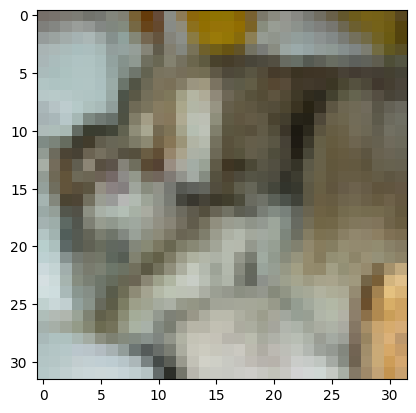

Prediction:  3    Class:  cat


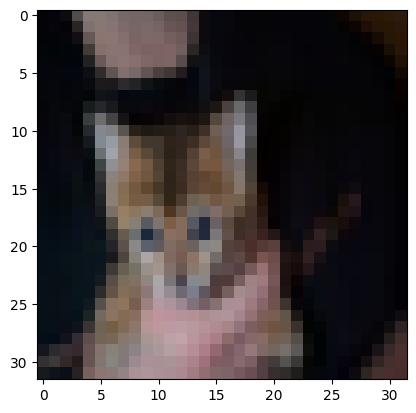

Prediction:  3    Class:  cat


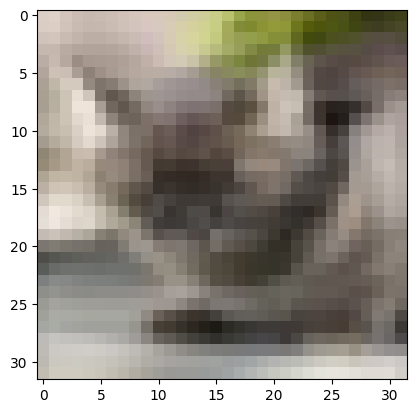

Prediction:  5    Class:  dog


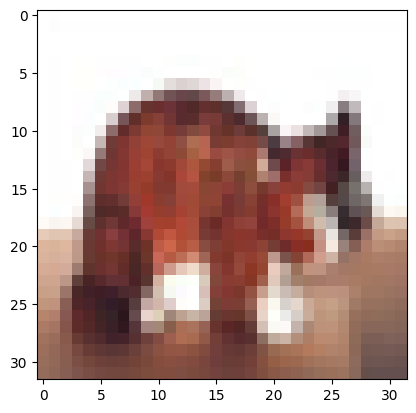

Prediction:  6    Class:  frog


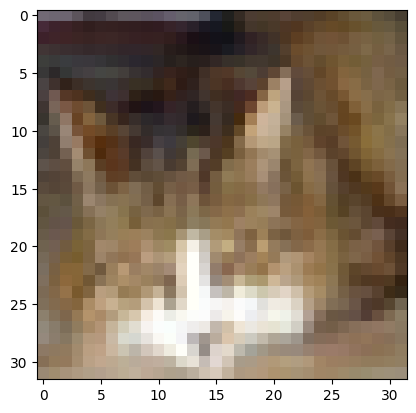

Prediction:  3    Class:  cat


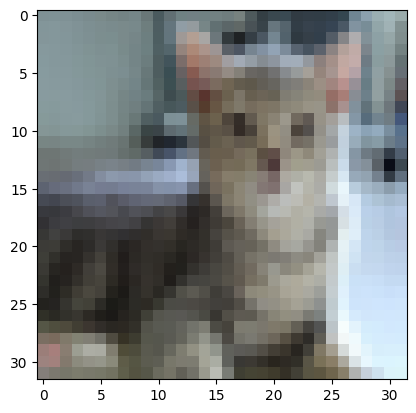

Prediction:  7    Class:  horse


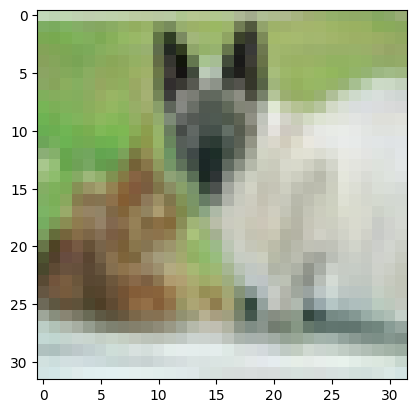

Prediction:  4    Class:  deer


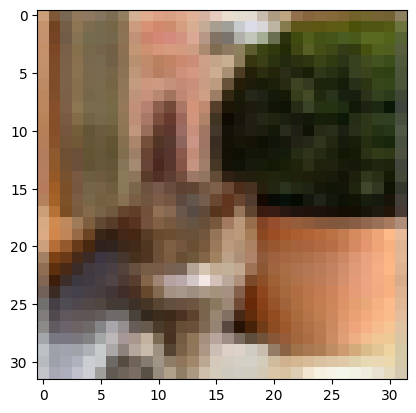

Prediction:  3    Class:  cat


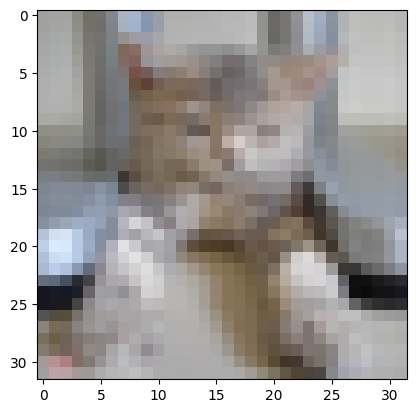

Prediction:  3    Class:  cat


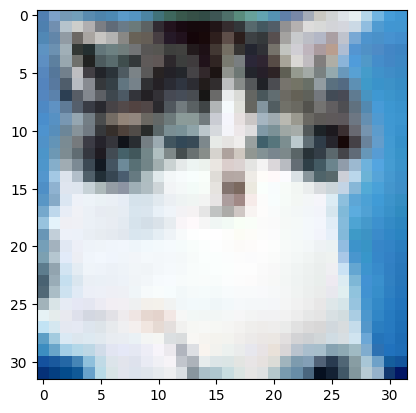

Prediction:  3    Class:  cat


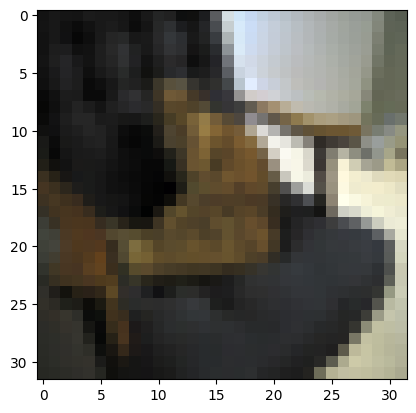

Prediction:  7    Class:  horse


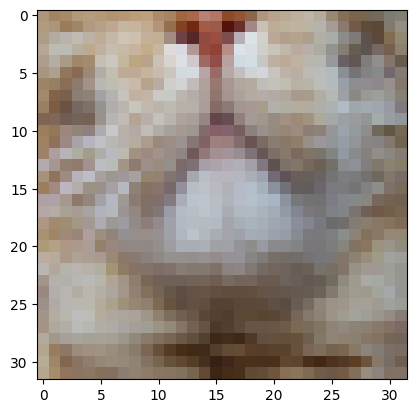

Prediction:  7    Class:  horse


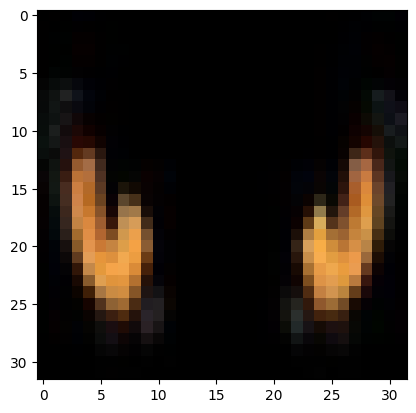

Prediction:  3    Class:  cat


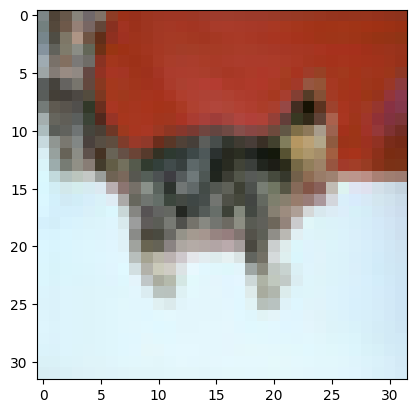

Prediction:  3    Class:  cat


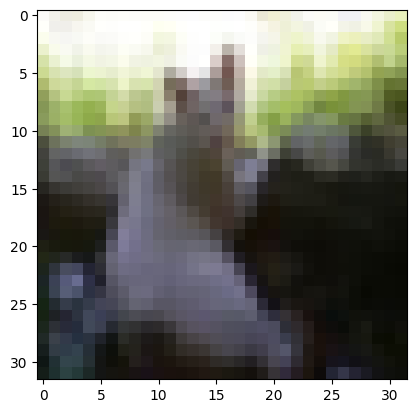

Prediction:  4    Class:  deer


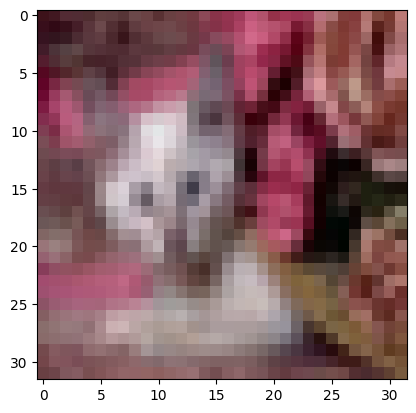

Prediction:  6    Class:  frog


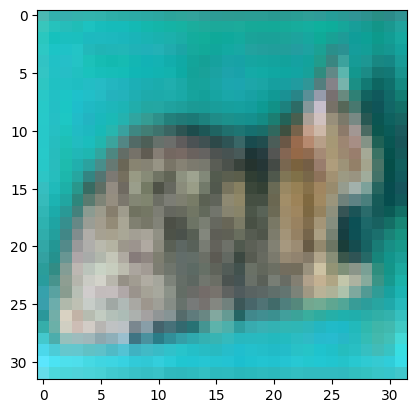

Prediction:  5    Class:  dog


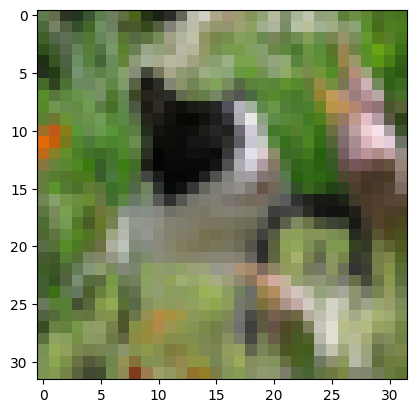

Prediction:  3    Class:  cat


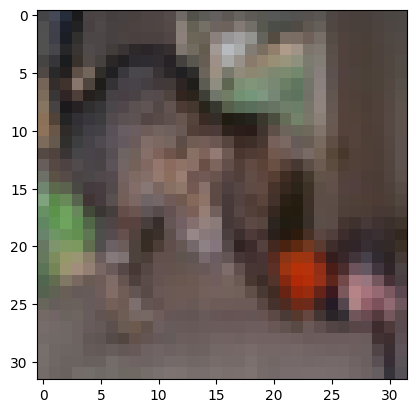

Prediction:  6    Class:  frog


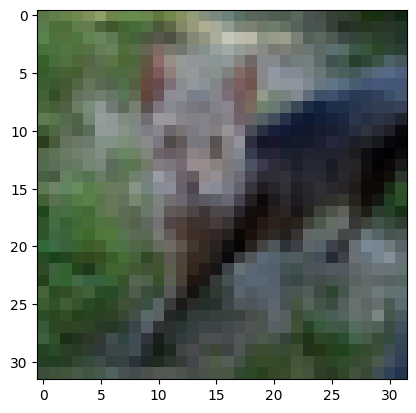

Prediction:  3    Class:  cat


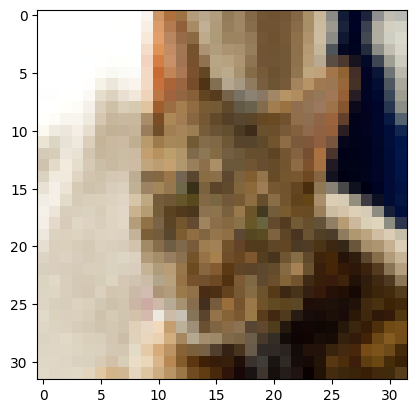

Prediction:  1    Class:  automobile


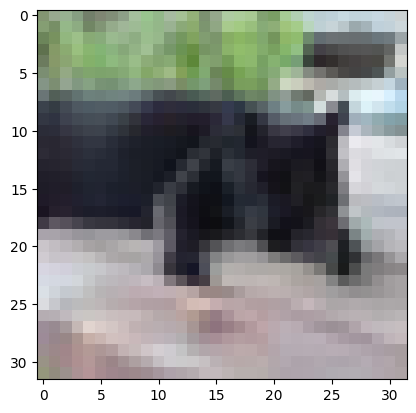

Prediction:  3    Class:  cat


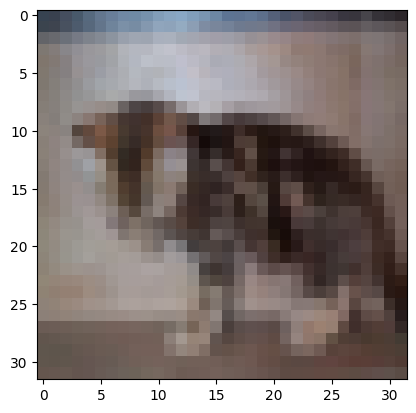

Prediction:  3    Class:  cat


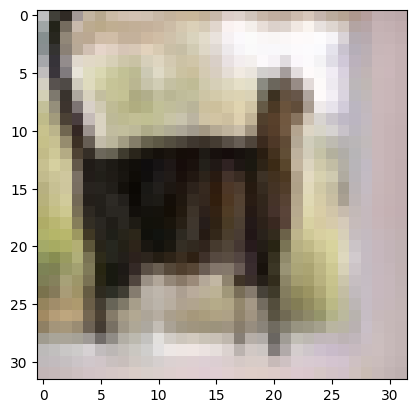

Prediction:  9    Class:  truck


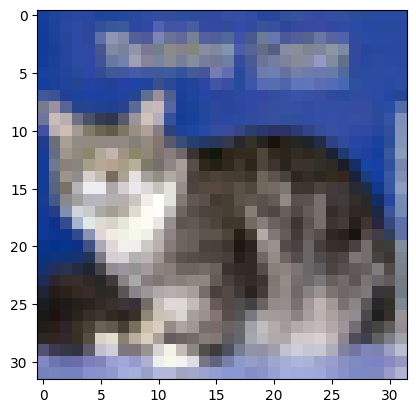

Prediction:  2    Class:  bird


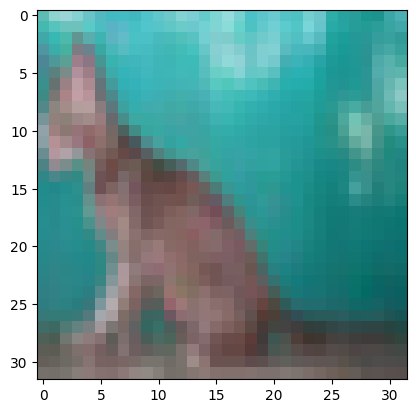

Prediction:  3    Class:  cat


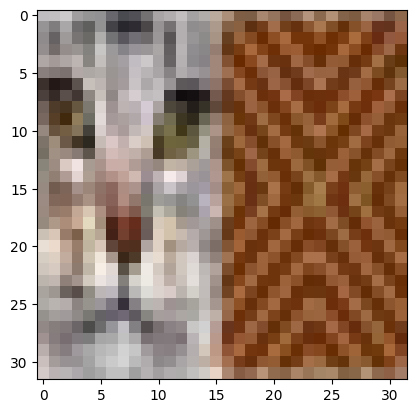

Prediction:  5    Class:  dog


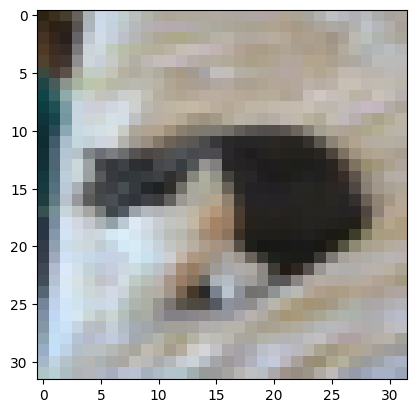

Prediction:  3    Class:  cat


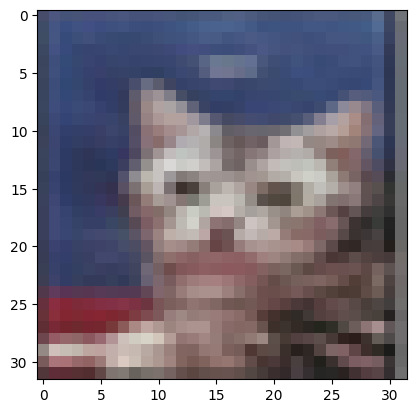

Prediction:  9    Class:  truck


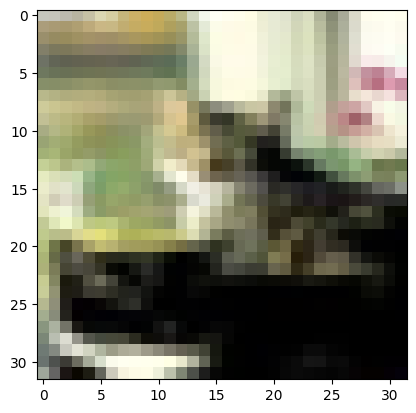

Prediction:  4    Class:  deer


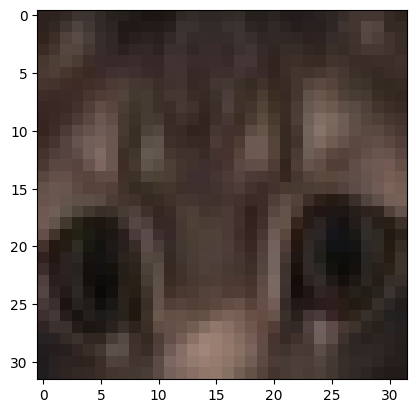

Prediction:  3    Class:  cat


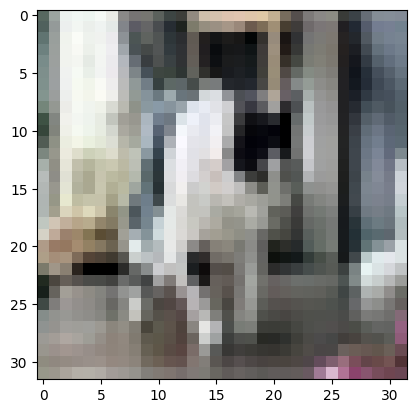

Prediction:  3    Class:  cat


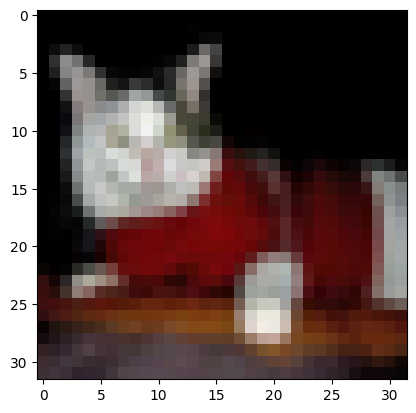

Prediction:  2    Class:  bird


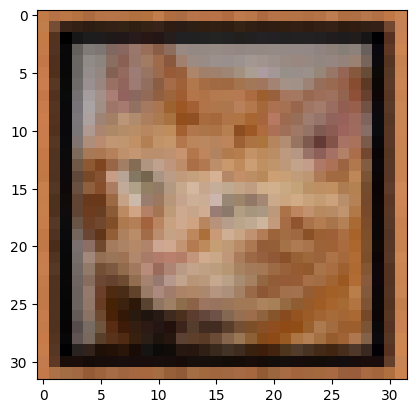

Prediction:  8    Class:  ship


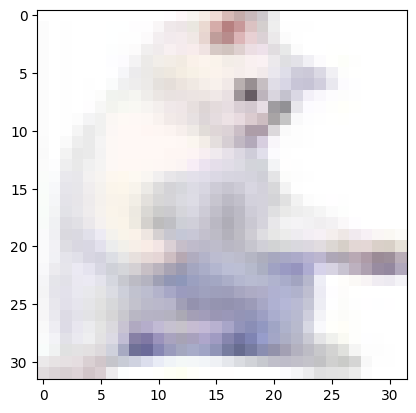

Prediction:  5    Class:  dog


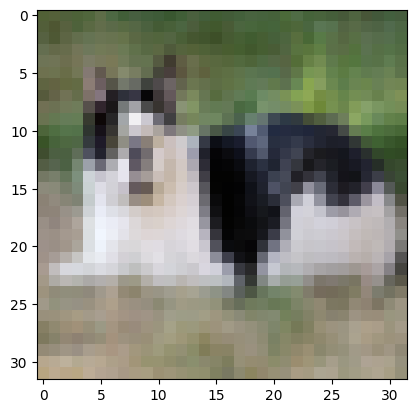

Prediction:  3    Class:  cat


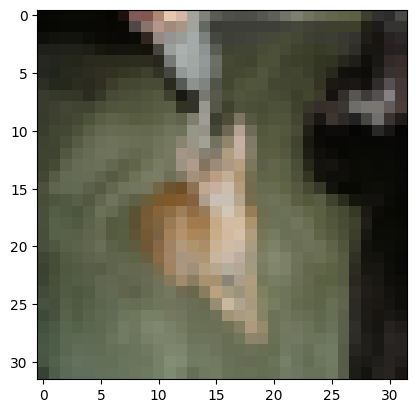

Prediction:  8    Class:  ship


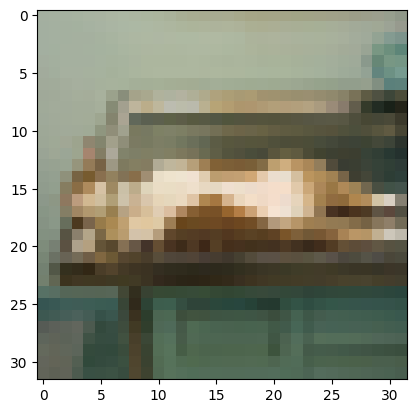

Prediction:  7    Class:  horse


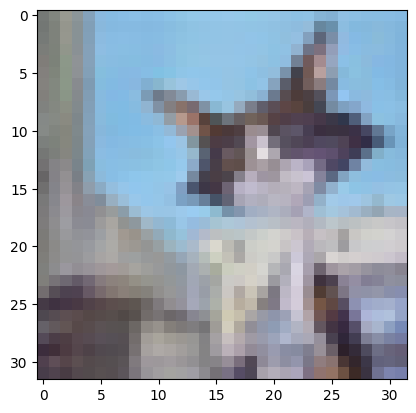

Prediction:  3    Class:  cat


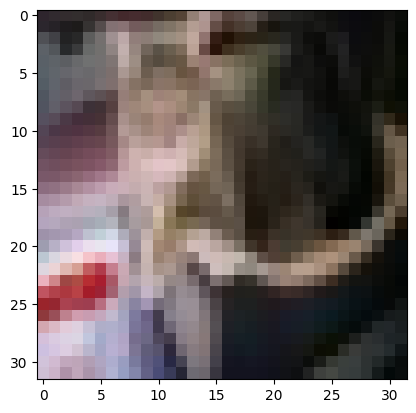

Prediction:  3    Class:  cat


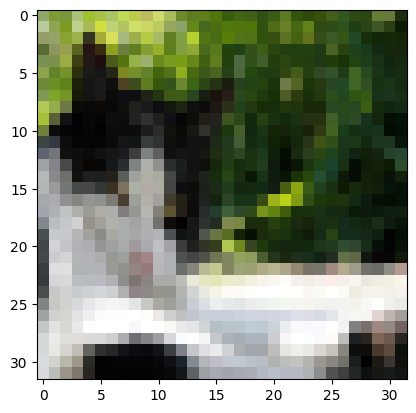

Prediction:  3    Class:  cat


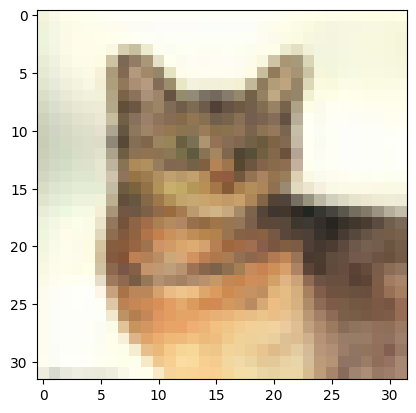

Prediction:  5    Class:  dog


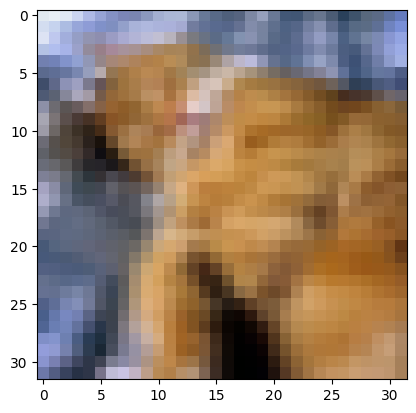

Prediction:  3    Class:  cat


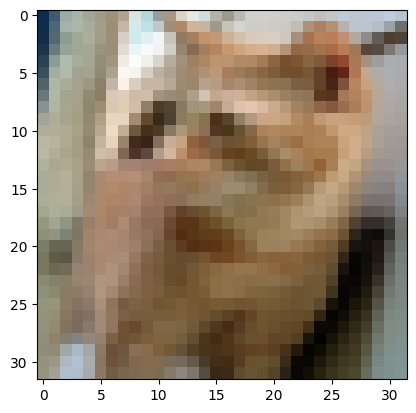

Prediction:  6    Class:  frog


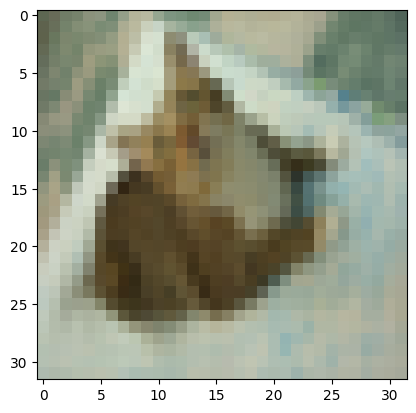

Prediction:  3    Class:  cat


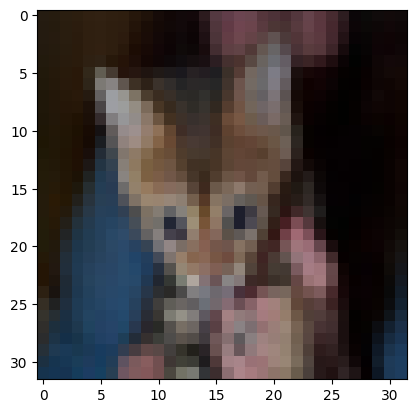

Prediction:  3    Class:  cat


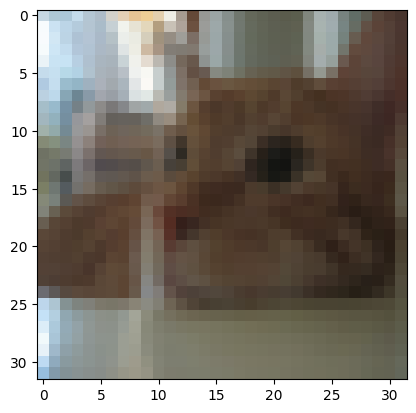

Prediction:  3    Class:  cat


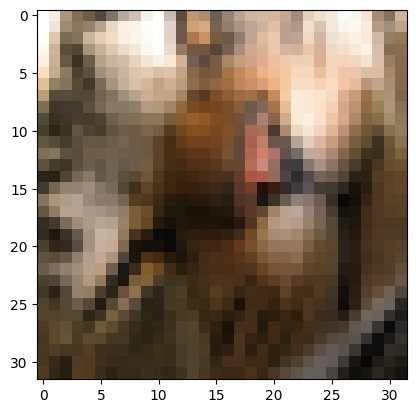

Prediction:  6    Class:  frog


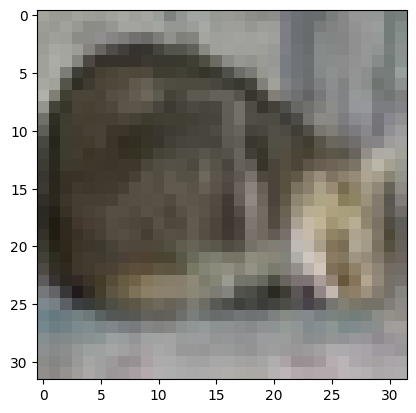

Prediction:  2    Class:  bird


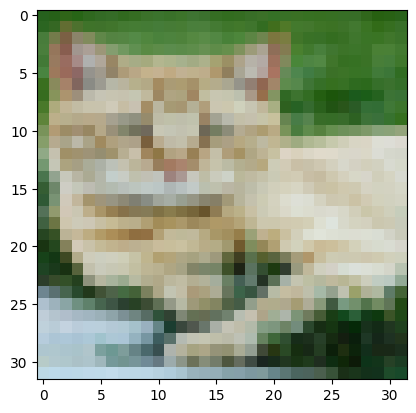

Prediction:  9    Class:  truck


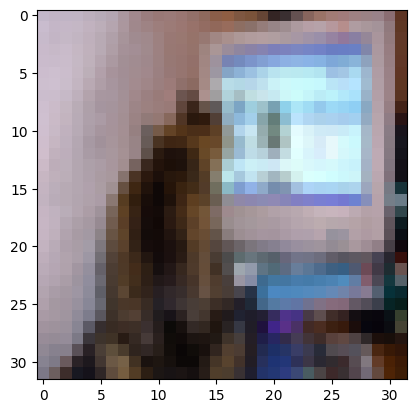

Prediction:  3    Class:  cat


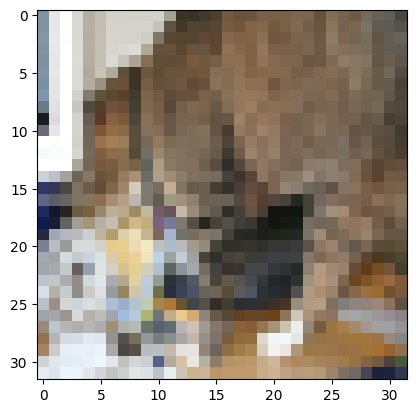

Prediction:  8    Class:  ship


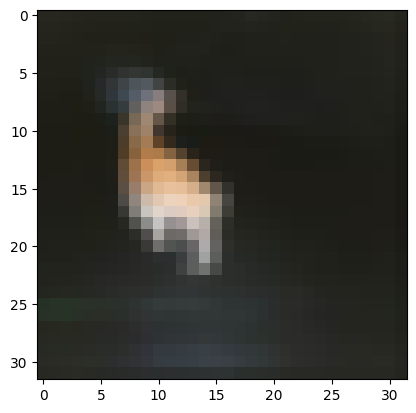

Prediction:  3    Class:  cat


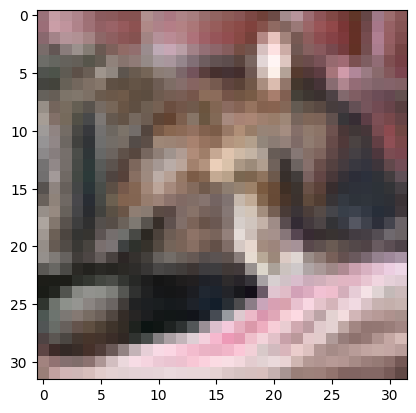

Prediction:  4    Class:  deer


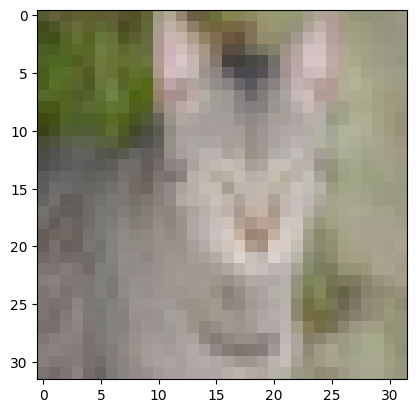

Prediction:  3    Class:  cat


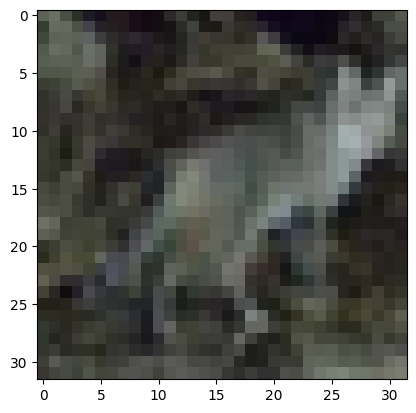

Prediction:  3    Class:  cat


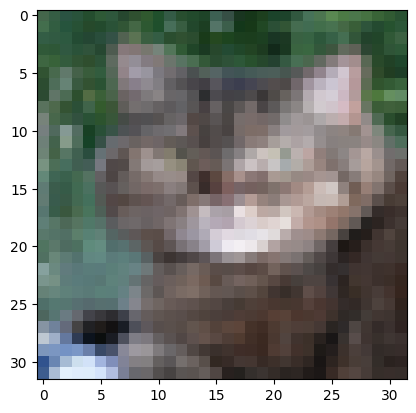

Prediction:  3    Class:  cat


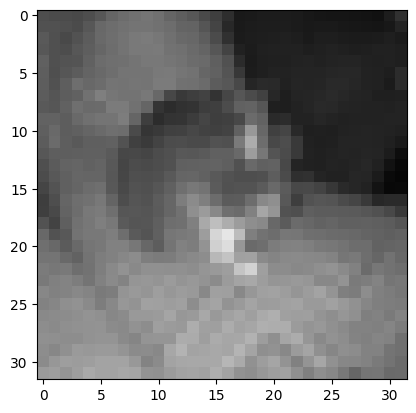

Prediction:  3    Class:  cat


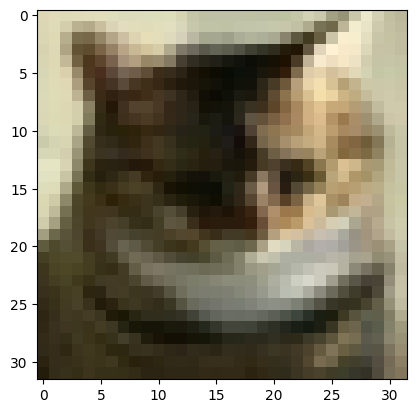

Prediction:  9    Class:  truck


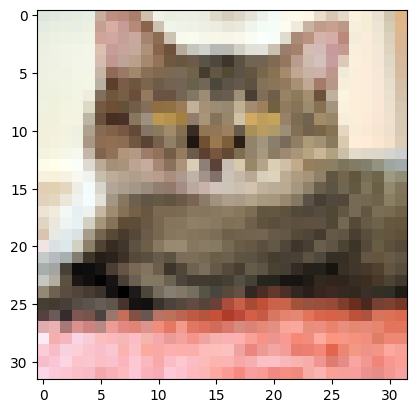

Prediction:  3    Class:  cat


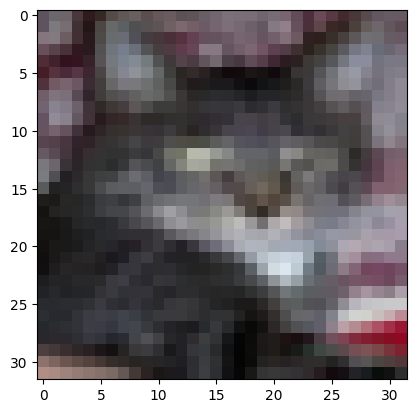

Prediction:  2    Class:  bird


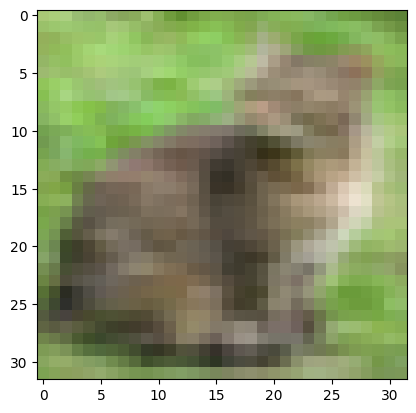

Prediction:  5    Class:  dog


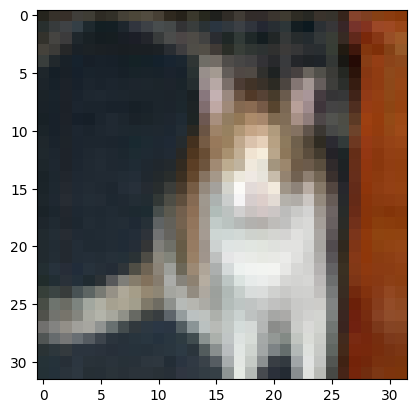

Prediction:  5    Class:  dog


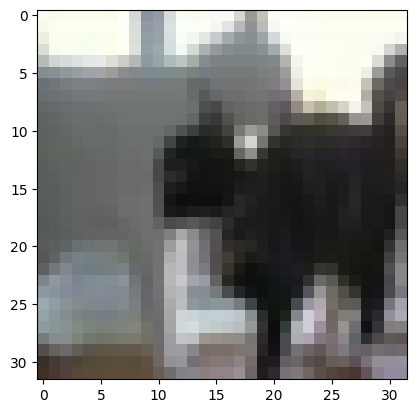

Prediction:  7    Class:  horse


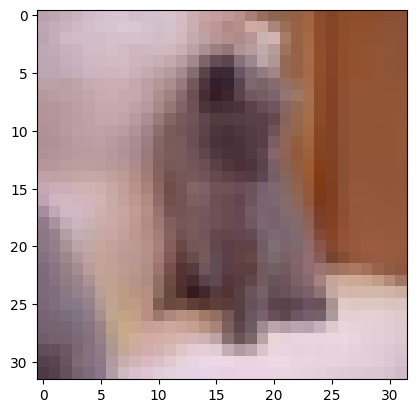

Prediction:  9    Class:  truck


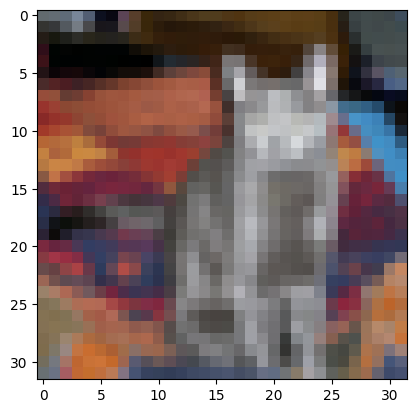

Prediction:  5    Class:  dog


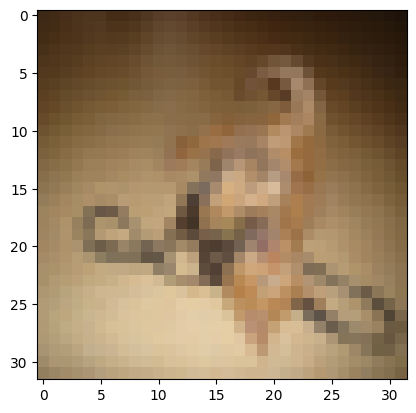

Prediction:  6    Class:  frog


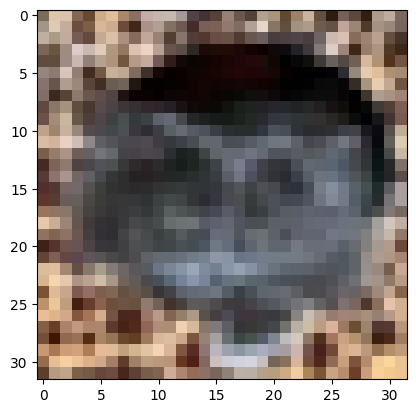

Prediction:  7    Class:  horse


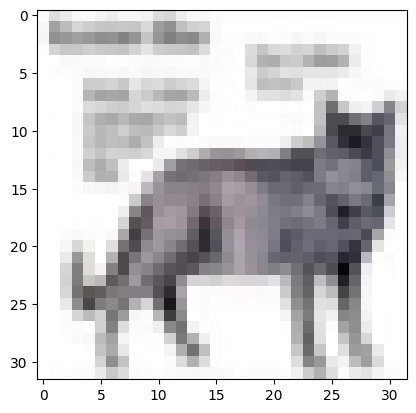

Prediction:  5    Class:  dog


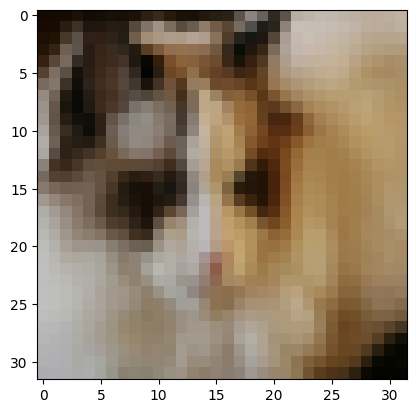

Prediction:  4    Class:  deer


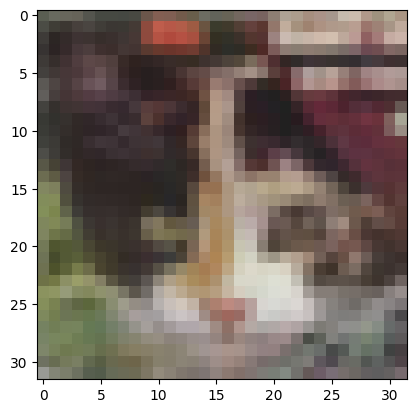

Prediction:  3    Class:  cat


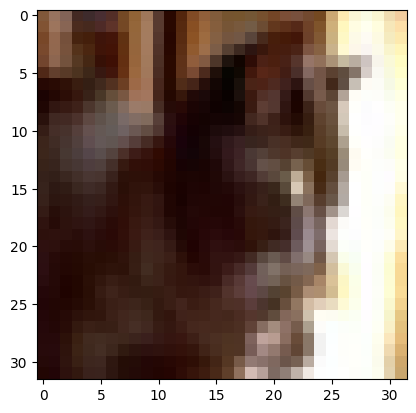

Prediction:  3    Class:  cat


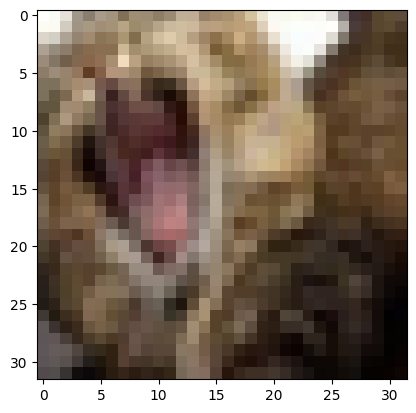

Prediction:  7    Class:  horse


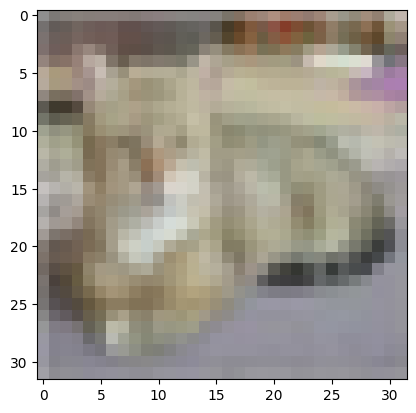

Prediction:  3    Class:  cat


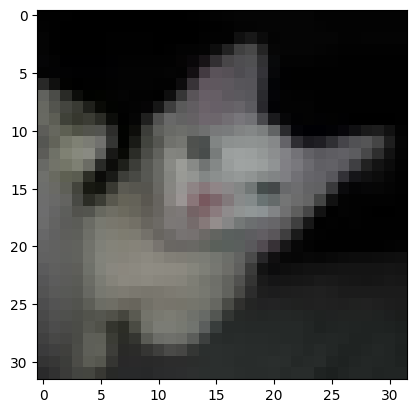

Prediction:  7    Class:  horse


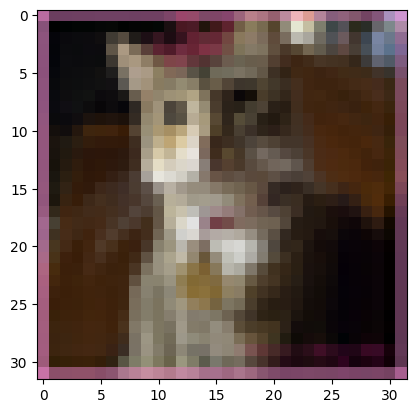

Prediction:  3    Class:  cat


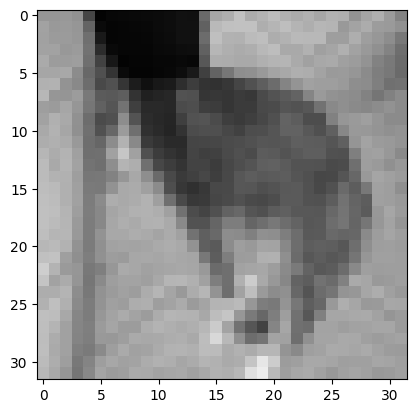

Prediction:  7    Class:  horse


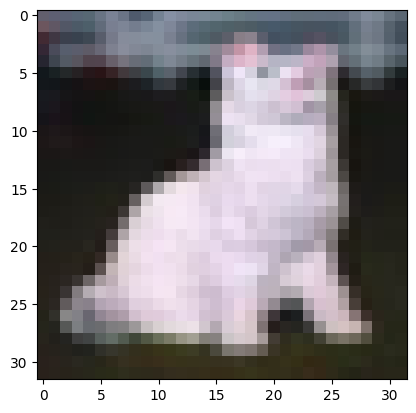

Prediction:  3    Class:  cat


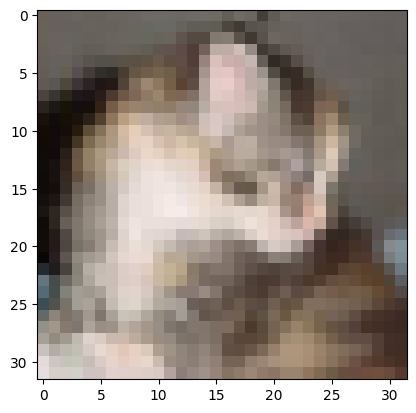

Prediction:  3    Class:  cat


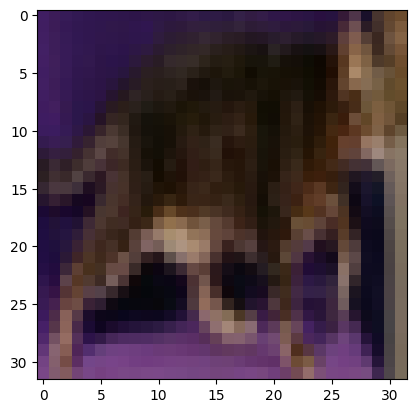

Prediction:  2    Class:  bird


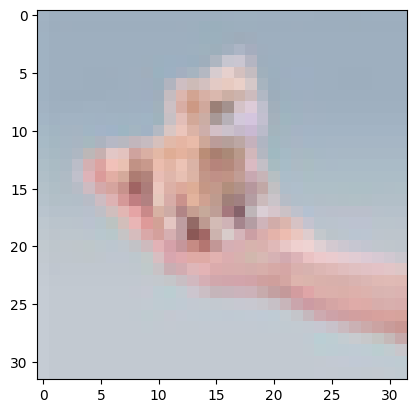

Prediction:  3    Class:  cat


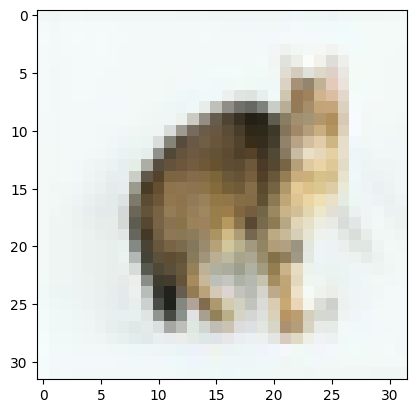

Prediction:  7    Class:  horse


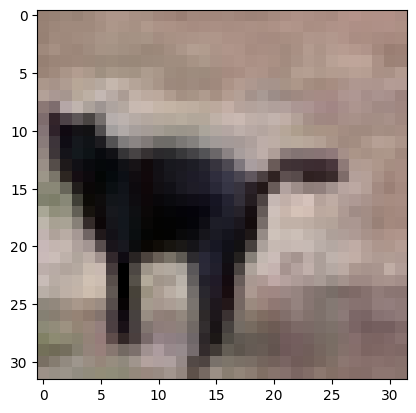

Prediction:  4    Class:  deer


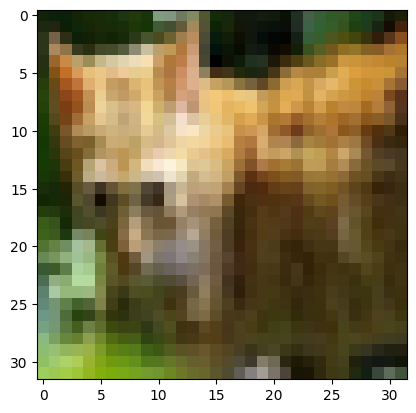

Prediction:  3    Class:  cat


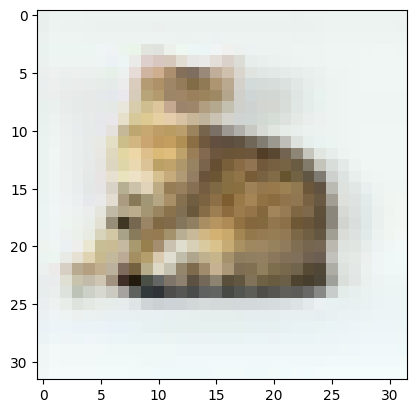

Prediction:  8    Class:  ship


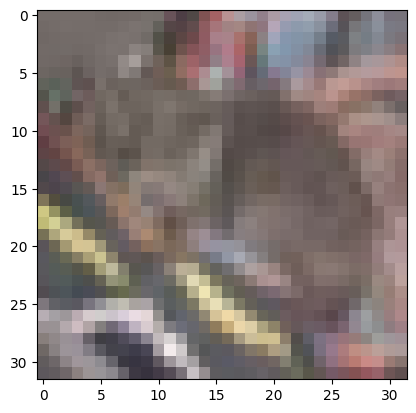

Prediction:  3    Class:  cat


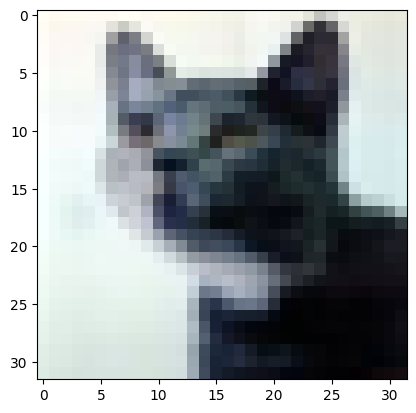

Prediction:  6    Class:  frog


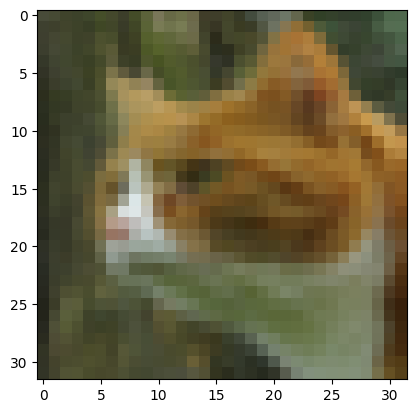

Prediction:  3    Class:  cat


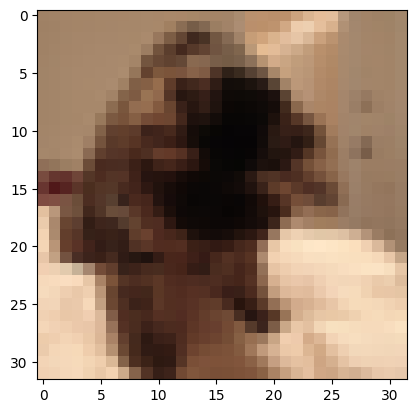

Prediction:  3    Class:  cat


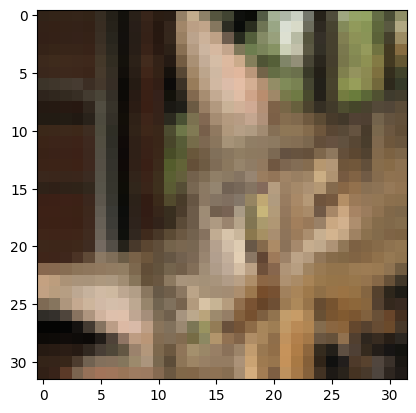

Prediction:  0    Class:  airplane


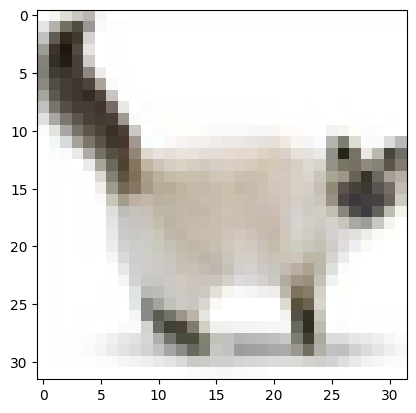

Prediction:  7    Class:  horse


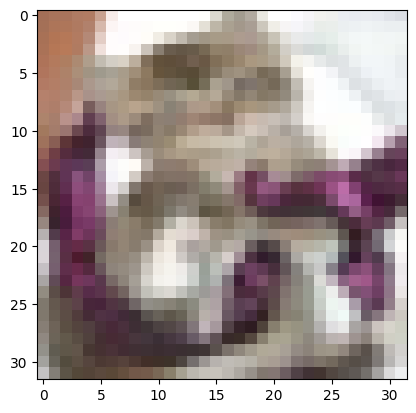

Prediction:  9    Class:  truck


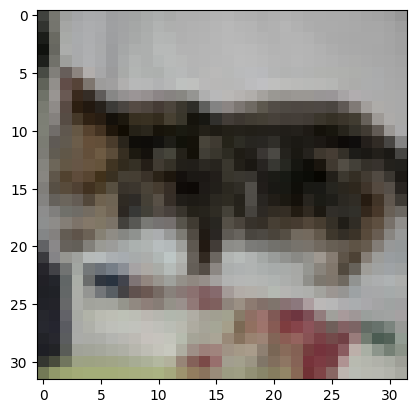

Prediction:  2    Class:  bird


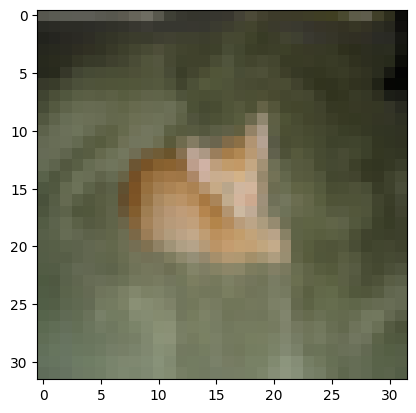

Prediction:  1    Class:  automobile


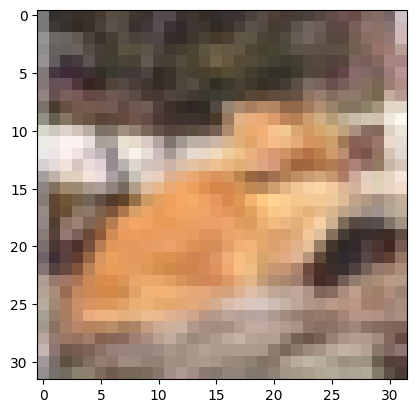

Prediction:  3    Class:  cat


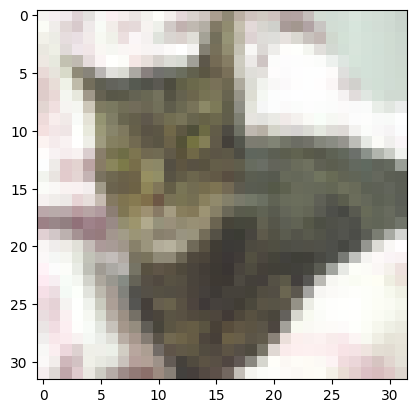

Prediction:  5    Class:  dog


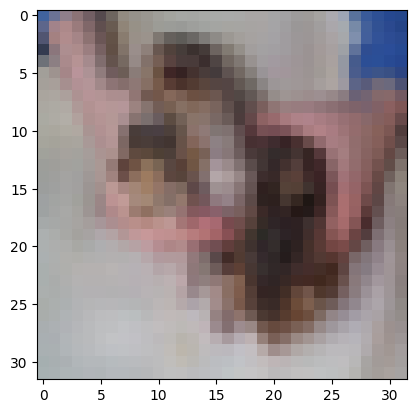

Prediction:  3    Class:  cat


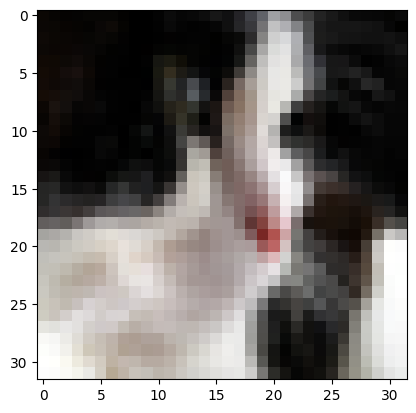

Prediction:  5    Class:  dog


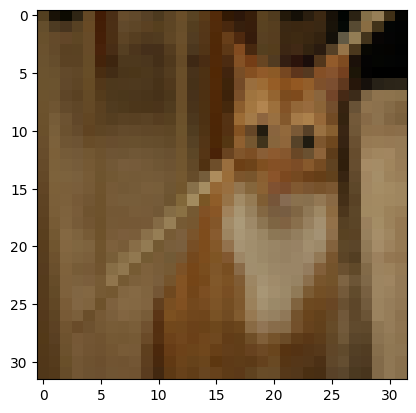

Prediction:  1    Class:  automobile


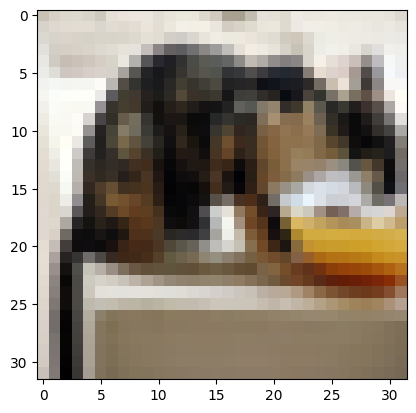

Prediction:  3    Class:  cat


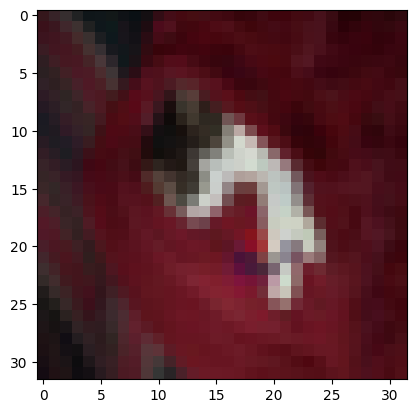

Prediction:  5    Class:  dog


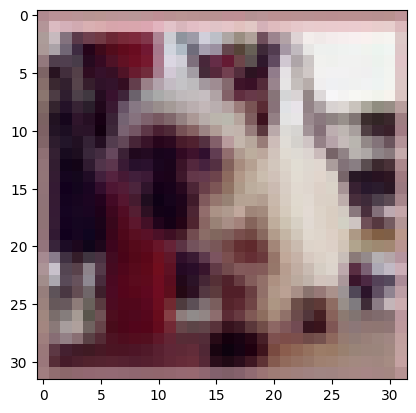

Prediction:  6    Class:  frog


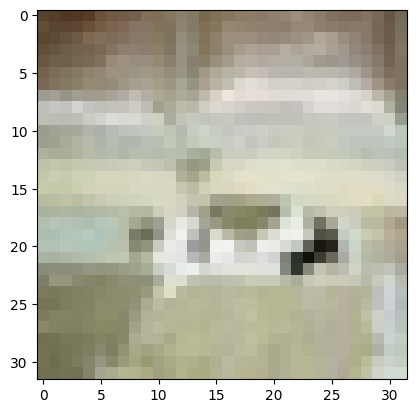

Prediction:  3    Class:  cat


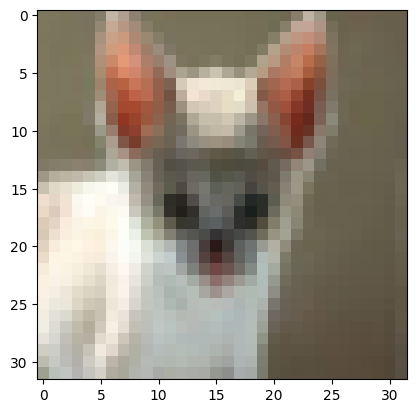

Prediction:  3    Class:  cat


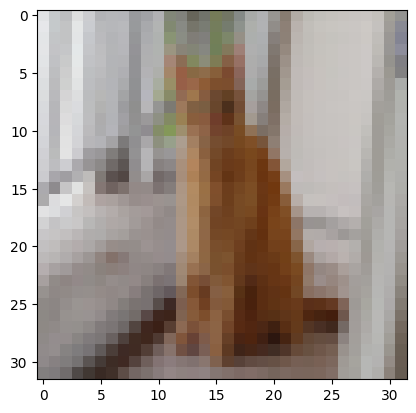

Prediction:  3    Class:  cat


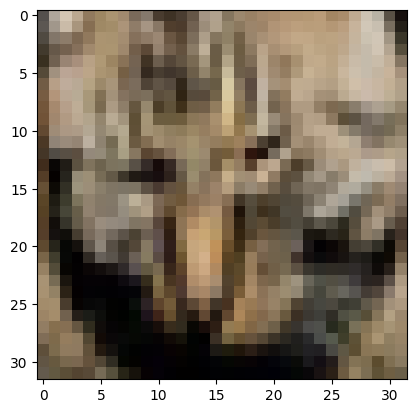

Prediction:  3    Class:  cat


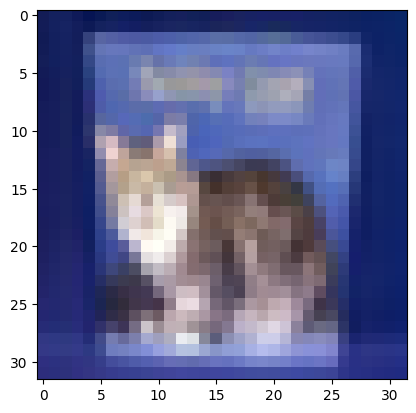

Prediction:  0    Class:  airplane


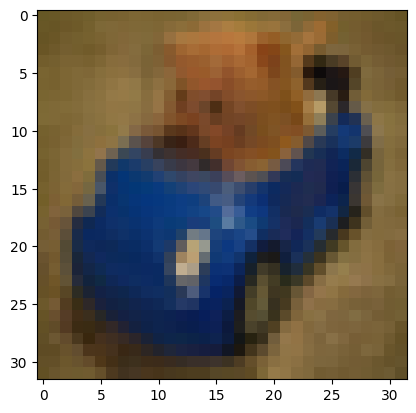

Prediction:  5    Class:  dog


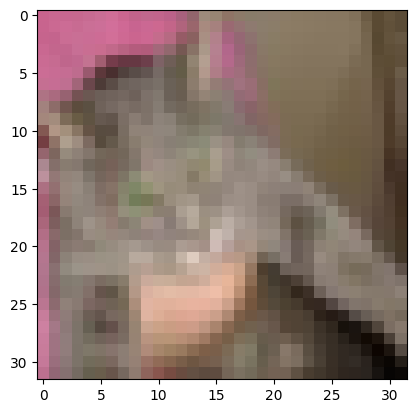

Prediction:  3    Class:  cat


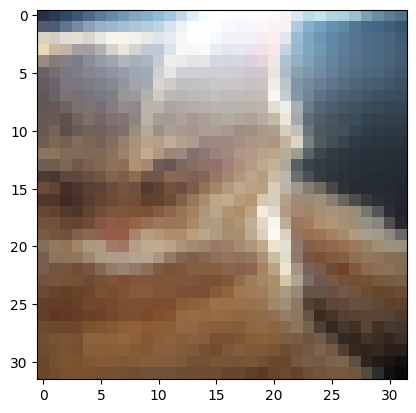

Prediction:  4    Class:  deer


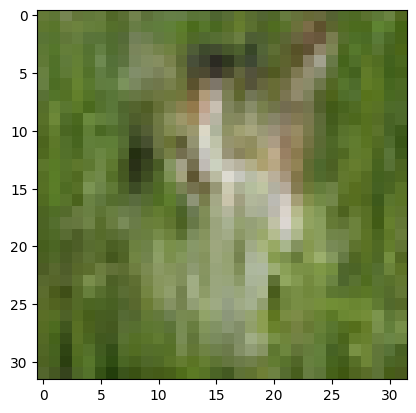

Prediction:  3    Class:  cat


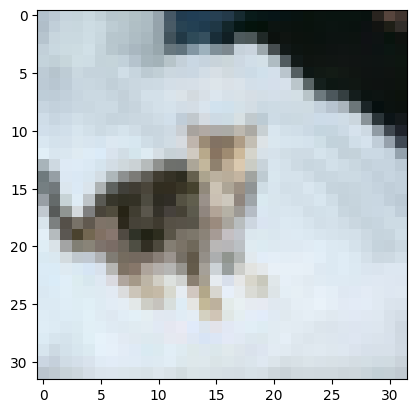

Prediction:  3    Class:  cat


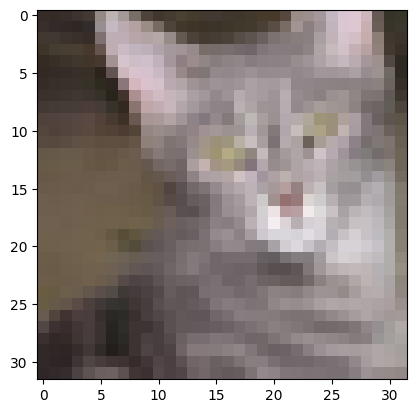

Prediction:  3    Class:  cat


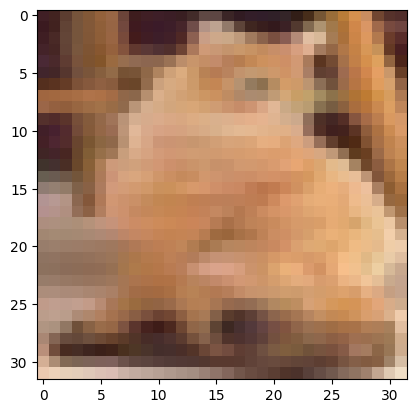

Prediction:  3    Class:  cat


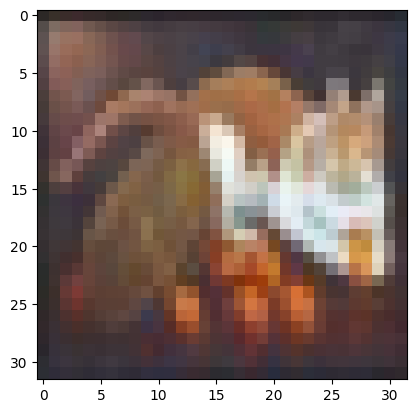

Prediction:  3    Class:  cat


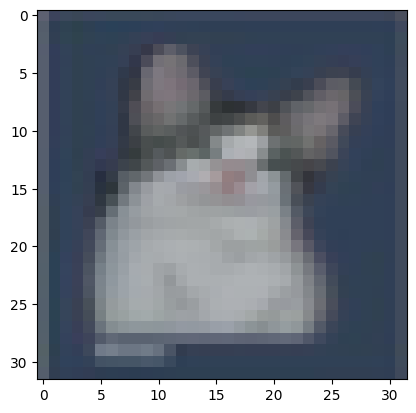

Prediction:  8    Class:  ship


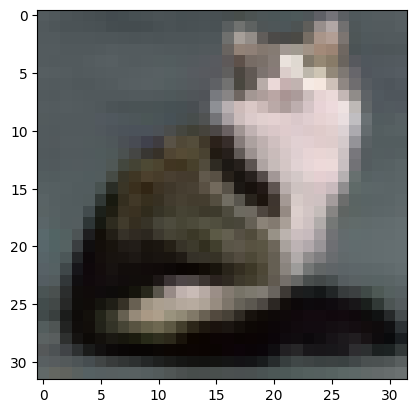

Prediction:  2    Class:  bird


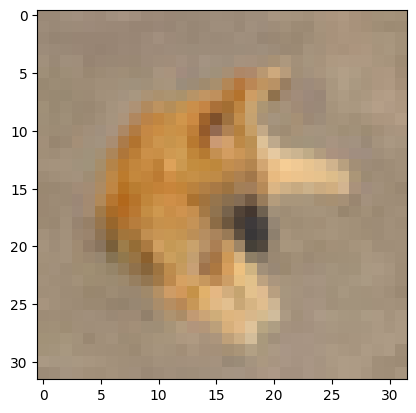

Prediction:  6    Class:  frog


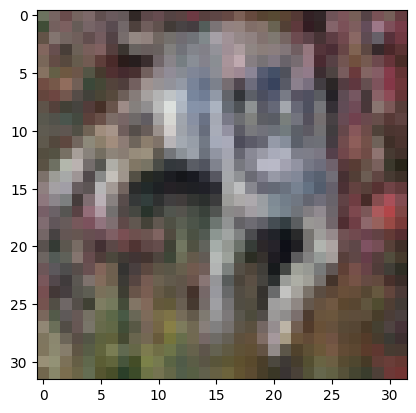

Prediction:  7    Class:  horse


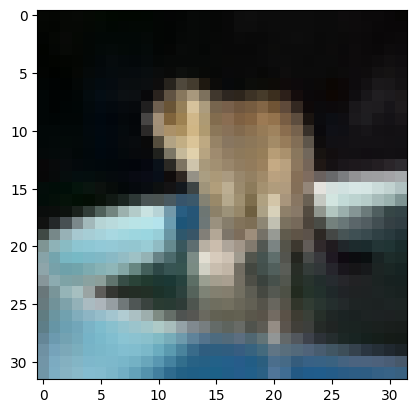

Prediction:  3    Class:  cat


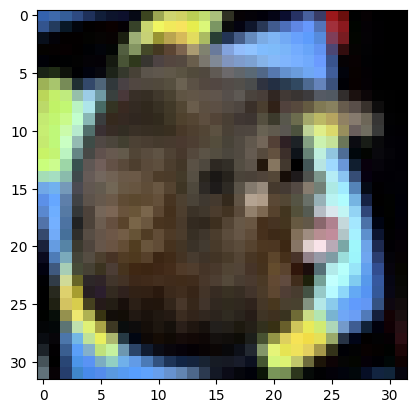

Prediction:  3    Class:  cat


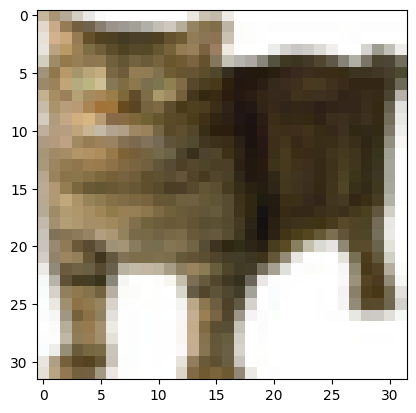

Prediction:  3    Class:  cat


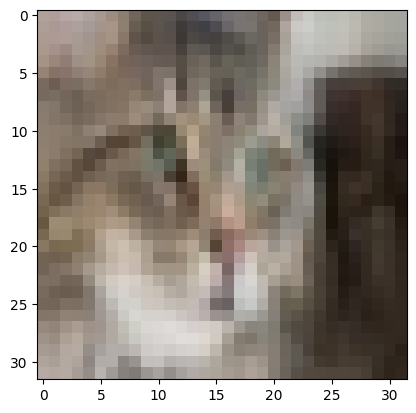

Prediction:  1    Class:  automobile


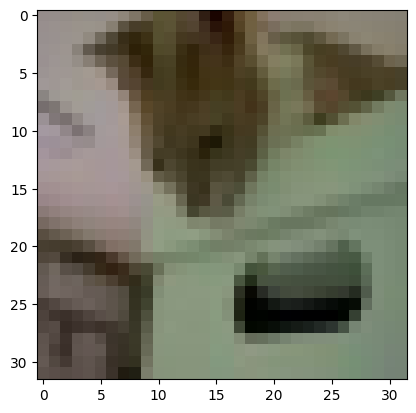

Prediction:  8    Class:  ship


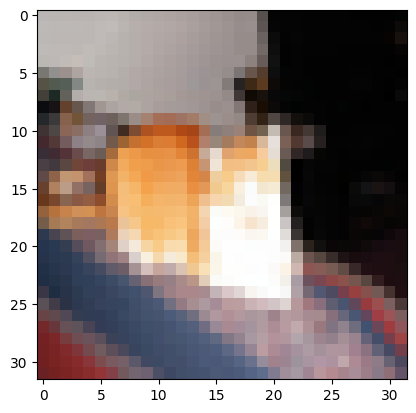

Prediction:  7    Class:  horse


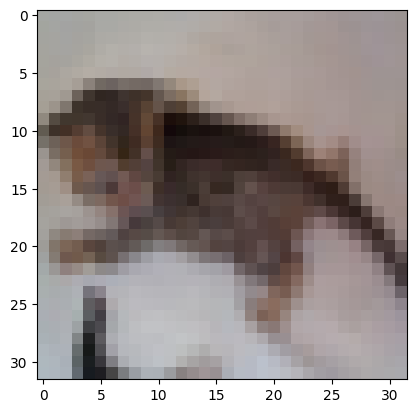

Prediction:  8    Class:  ship


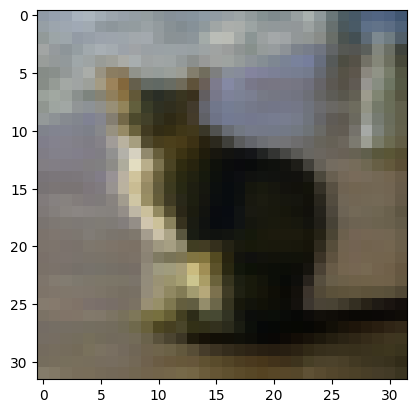

Prediction:  3    Class:  cat


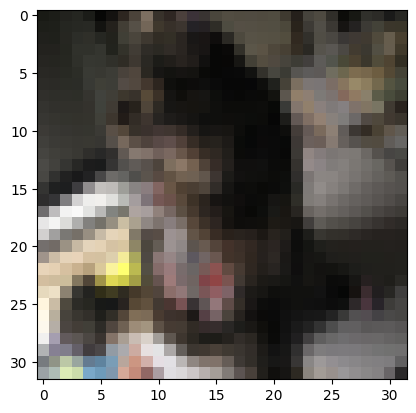

Prediction:  3    Class:  cat


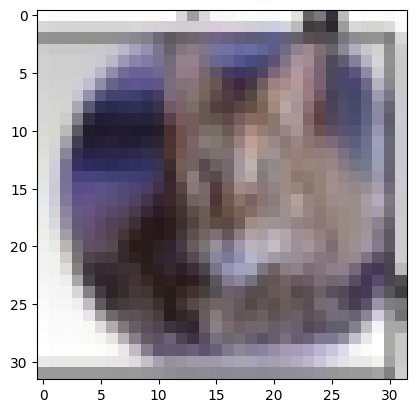

Prediction:  3    Class:  cat


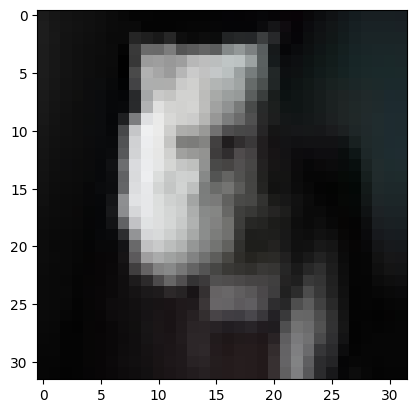

Prediction:  3    Class:  cat


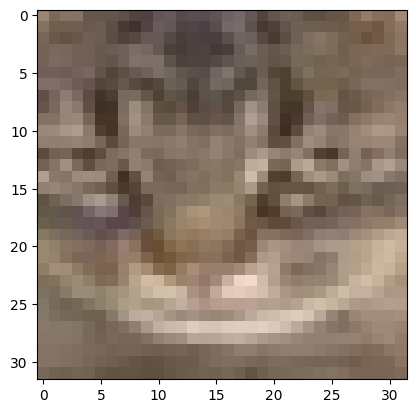

Prediction:  3    Class:  cat


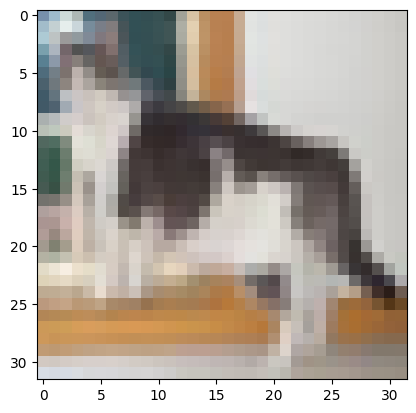

Prediction:  5    Class:  dog


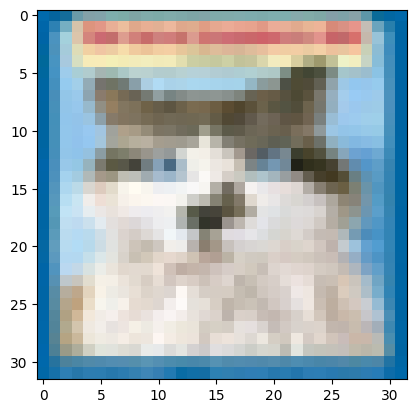

Prediction:  2    Class:  bird


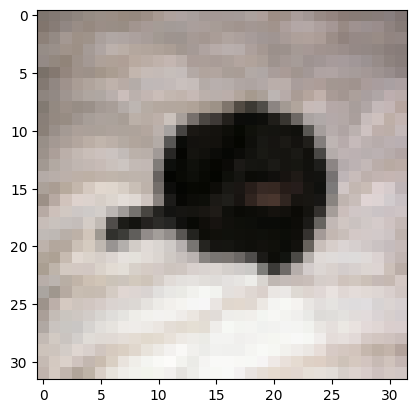

Prediction:  3    Class:  cat


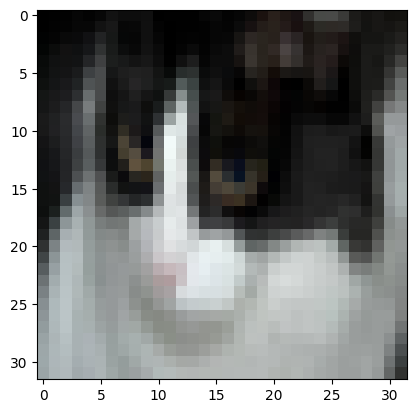

Prediction:  6    Class:  frog


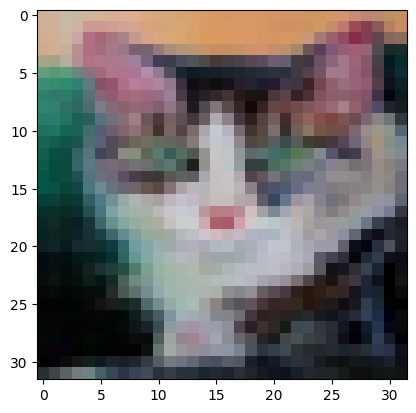

Prediction:  1    Class:  automobile


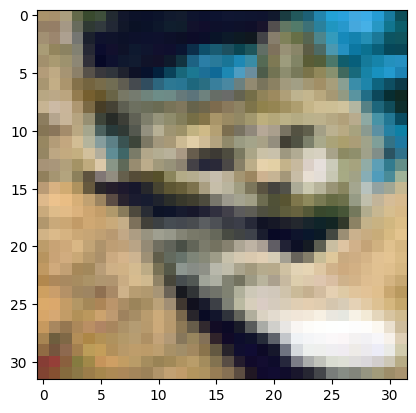

Prediction:  4    Class:  deer


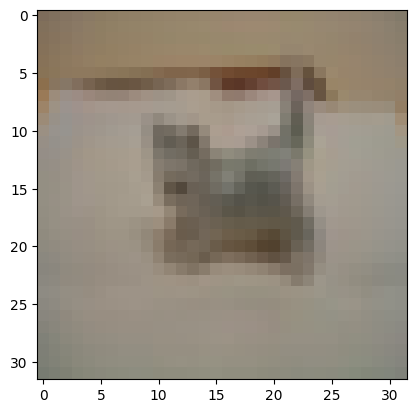

Prediction:  3    Class:  cat


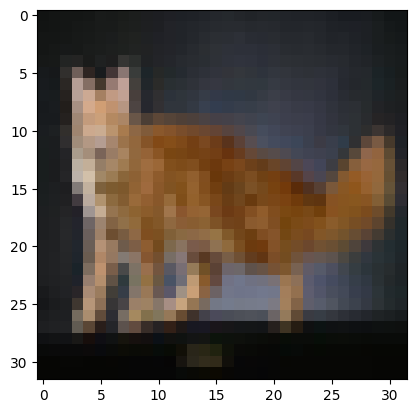

Prediction:  1    Class:  automobile


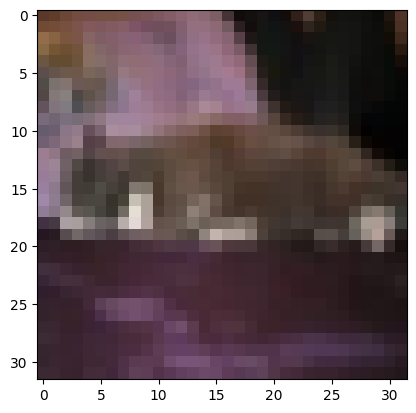

Prediction:  3    Class:  cat


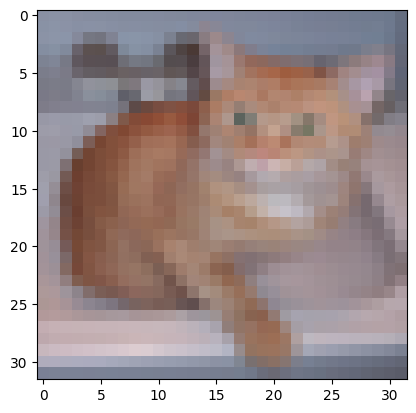

Prediction:  3    Class:  cat


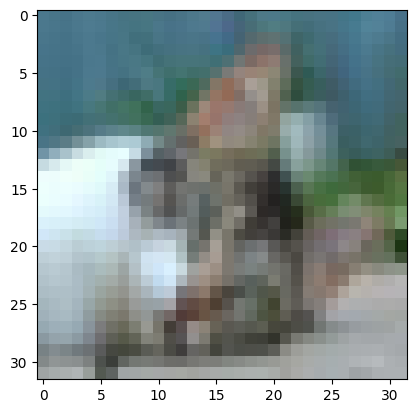

Prediction:  5    Class:  dog


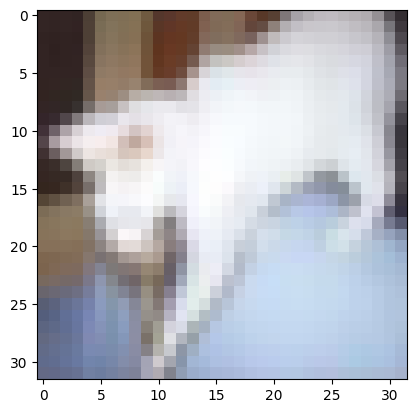

Prediction:  4    Class:  deer


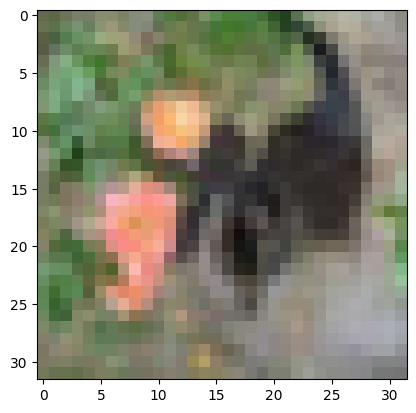

Prediction:  3    Class:  cat


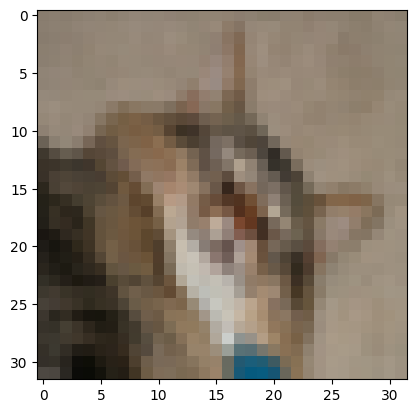

Prediction:  3    Class:  cat


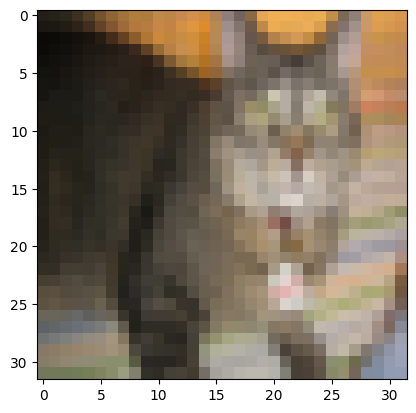

Prediction:  3    Class:  cat


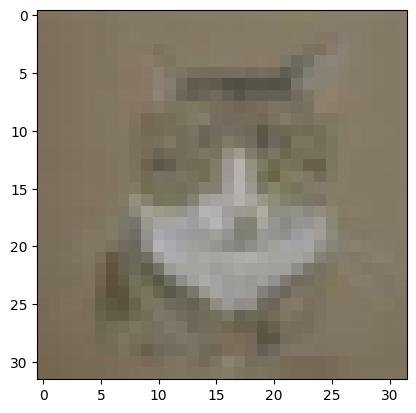

Prediction:  8    Class:  ship


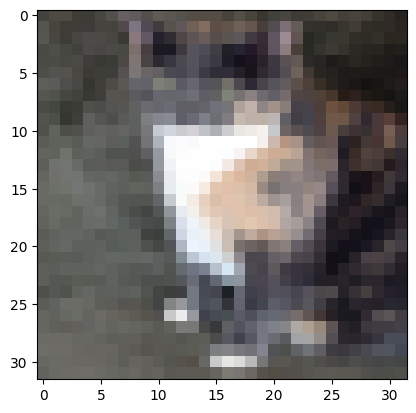

Prediction:  3    Class:  cat


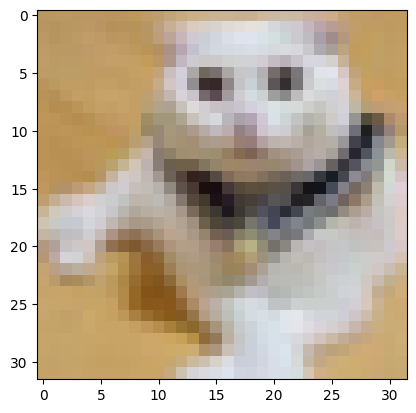

Prediction:  3    Class:  cat


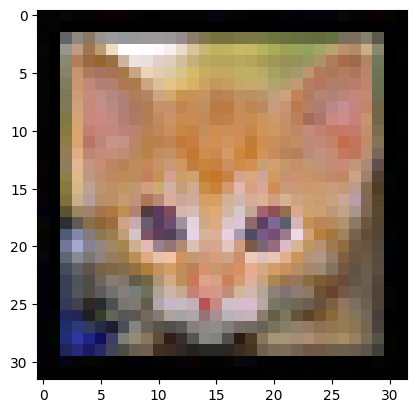

Prediction:  5    Class:  dog


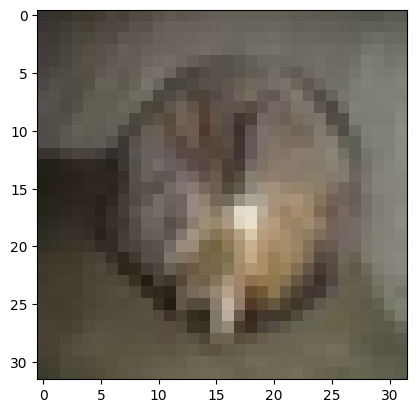

Prediction:  3    Class:  cat


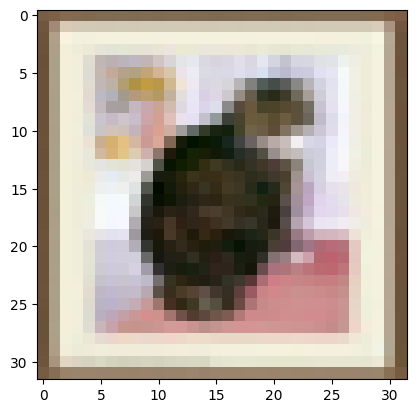

Prediction:  1    Class:  automobile


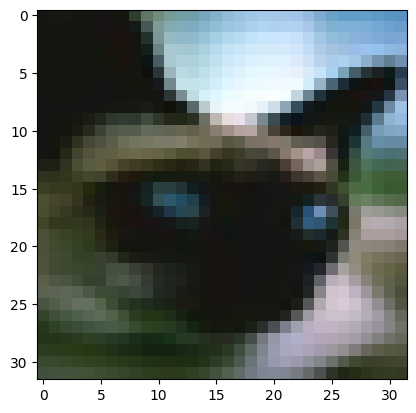

Prediction:  2    Class:  bird


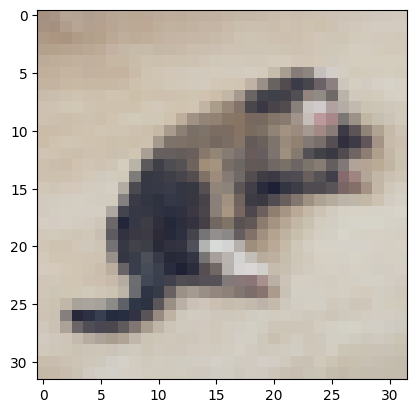

Prediction:  7    Class:  horse


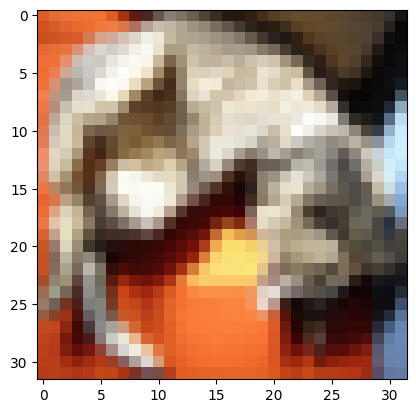

Prediction:  8    Class:  ship


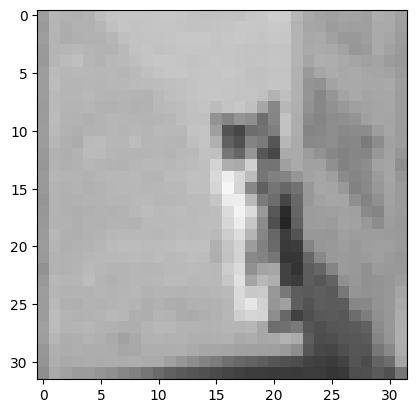

Prediction:  2    Class:  bird


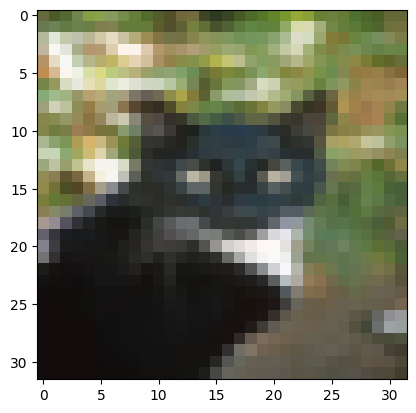

Prediction:  3    Class:  cat


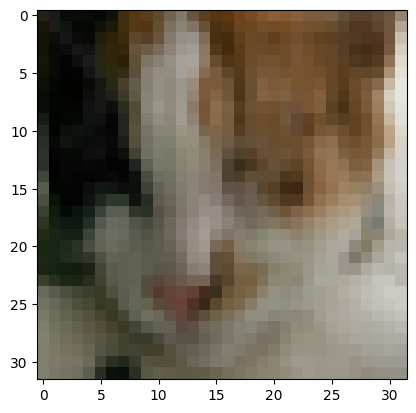

Prediction:  3    Class:  cat


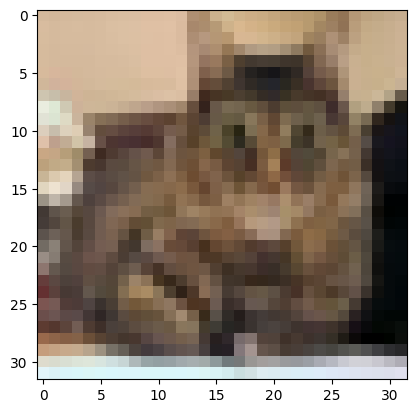

Prediction:  2    Class:  bird


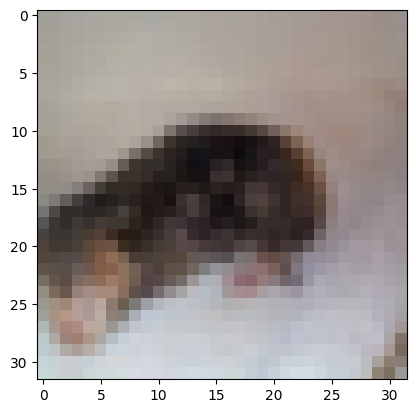

Prediction:  3    Class:  cat


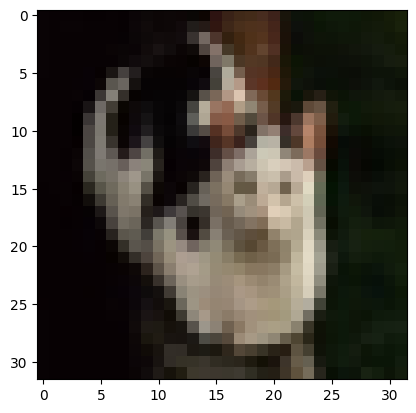

Prediction:  3    Class:  cat


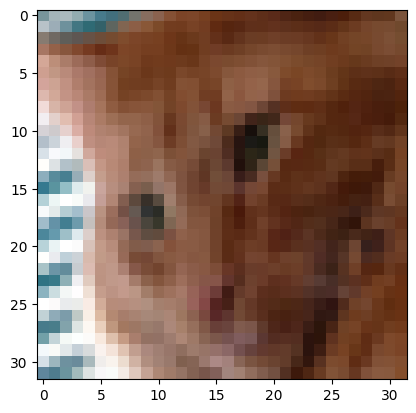

Prediction:  2    Class:  bird


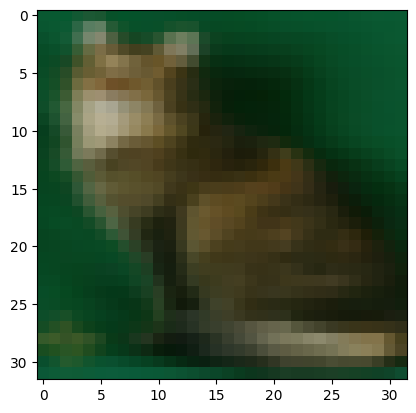

Prediction:  3    Class:  cat


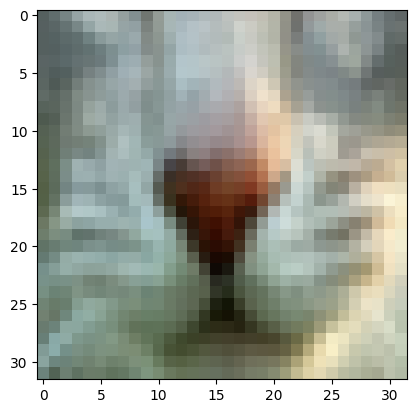

Prediction:  3    Class:  cat


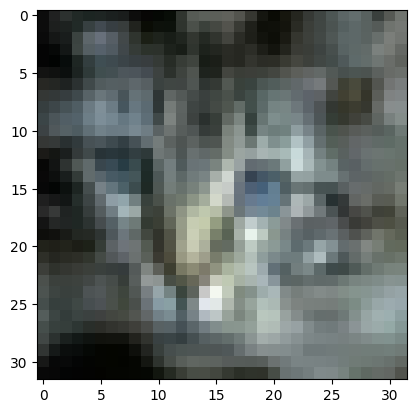

Prediction:  5    Class:  dog


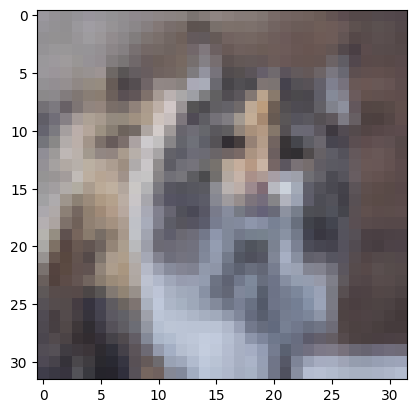

Prediction:  3    Class:  cat


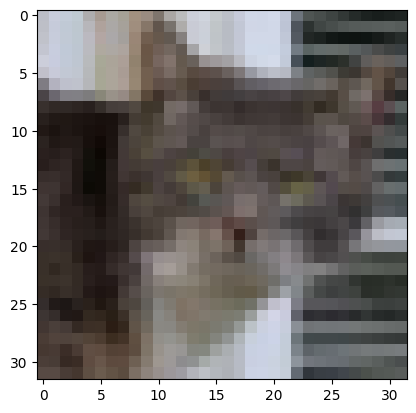

Prediction:  8    Class:  ship


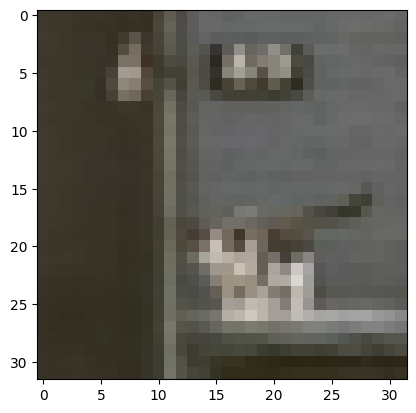

Prediction:  5    Class:  dog


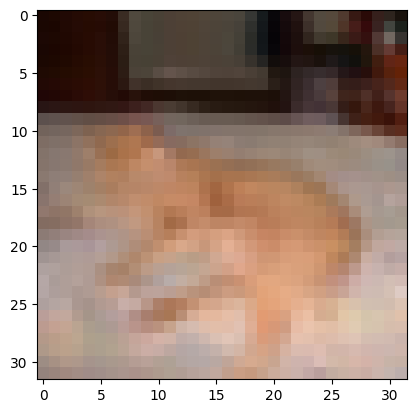

Prediction:  3    Class:  cat


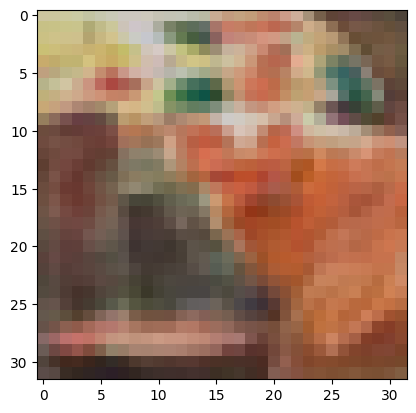

Prediction:  9    Class:  truck


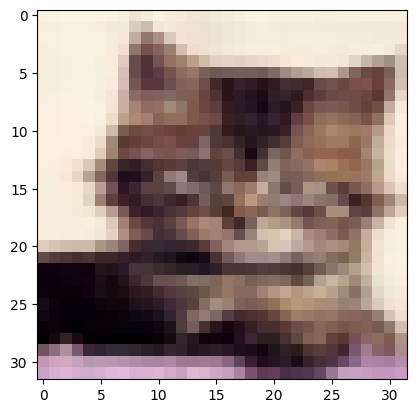

Prediction:  3    Class:  cat


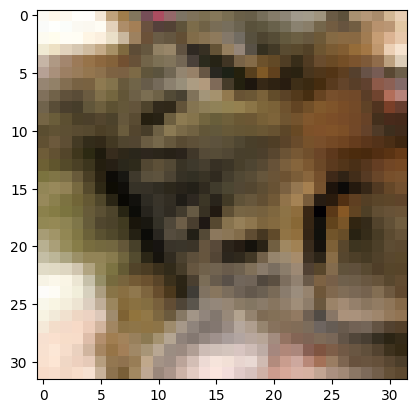

Prediction:  9    Class:  truck


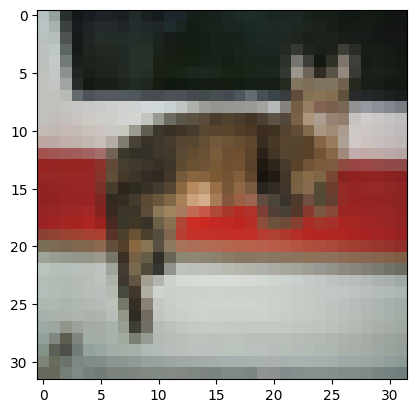

Prediction:  3    Class:  cat


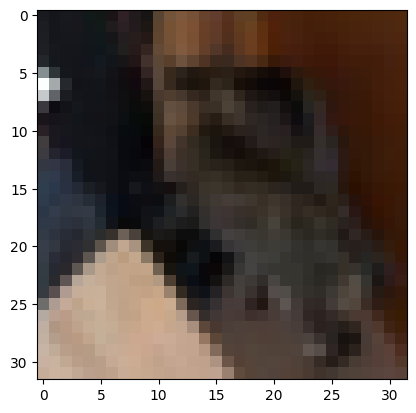

Prediction:  6    Class:  frog


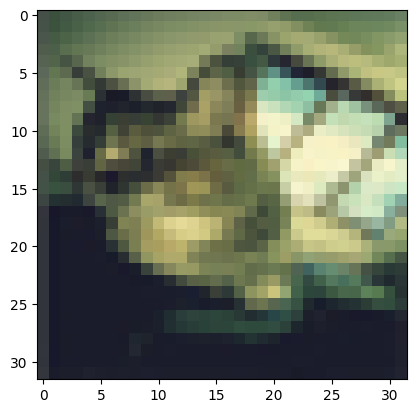

Prediction:  6    Class:  frog


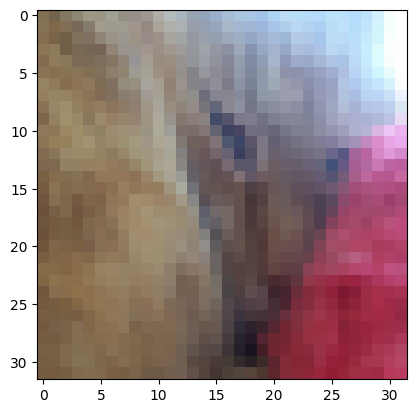

Prediction:  9    Class:  truck


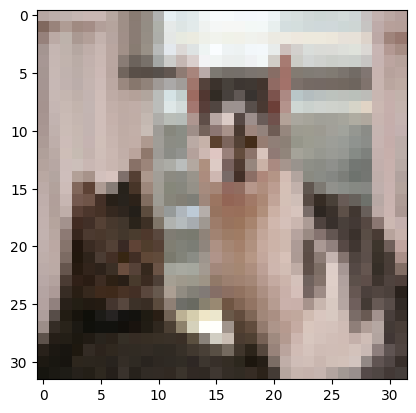

Prediction:  3    Class:  cat


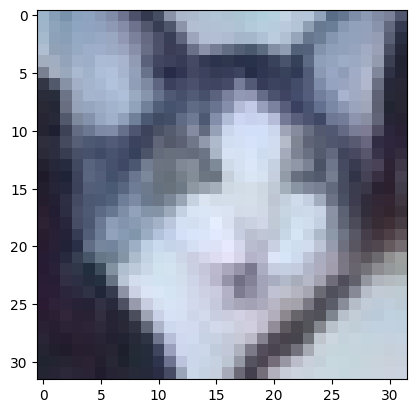

Prediction:  5    Class:  dog


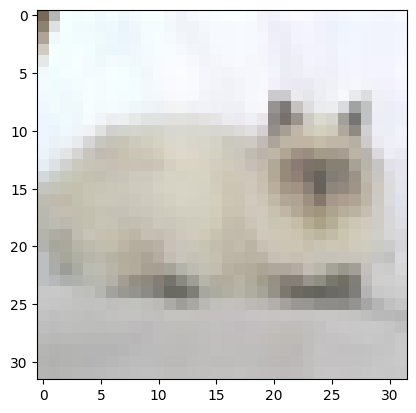

Prediction:  3    Class:  cat


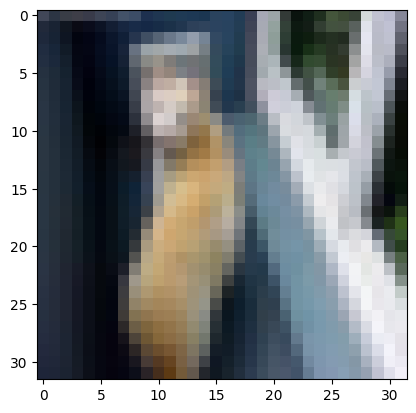

Prediction:  3    Class:  cat


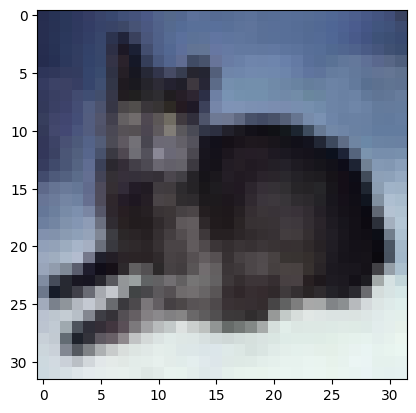

Prediction:  9    Class:  truck


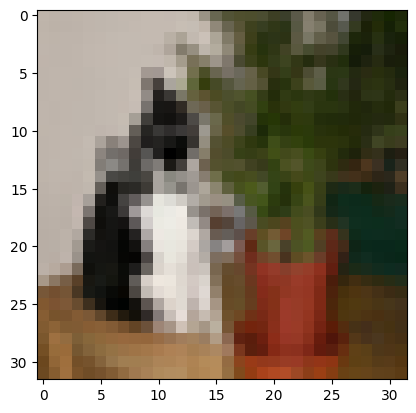

Prediction:  4    Class:  deer


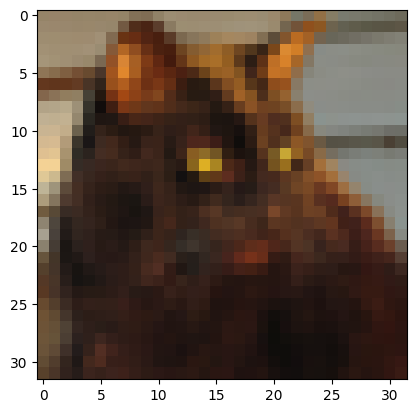

Prediction:  3    Class:  cat


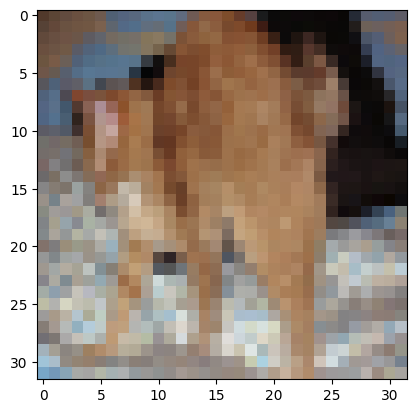

Prediction:  3    Class:  cat


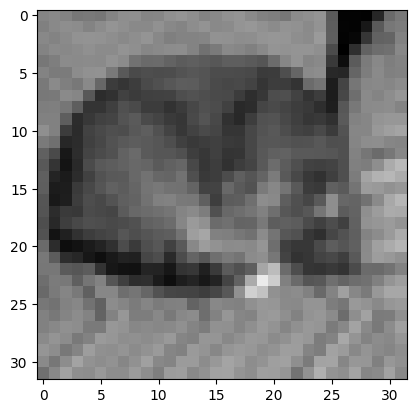

Prediction:  3    Class:  cat


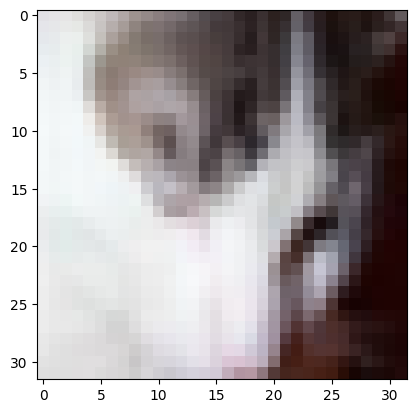

Prediction:  5    Class:  dog


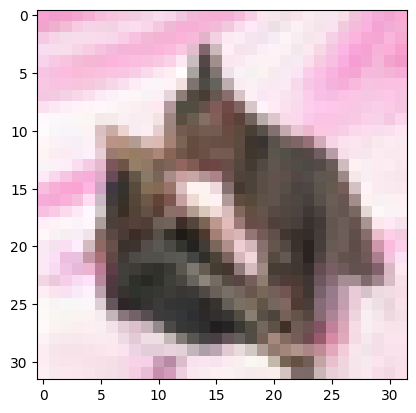

Prediction:  3    Class:  cat


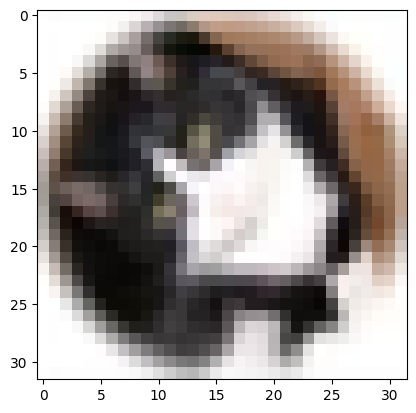

Prediction:  9    Class:  truck


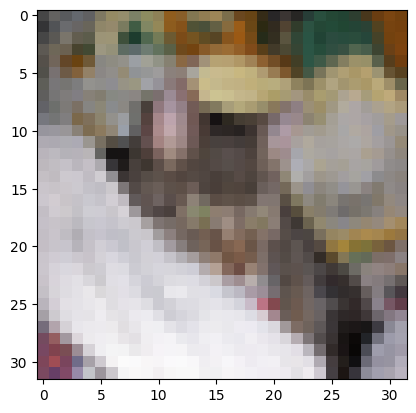

Prediction:  3    Class:  cat


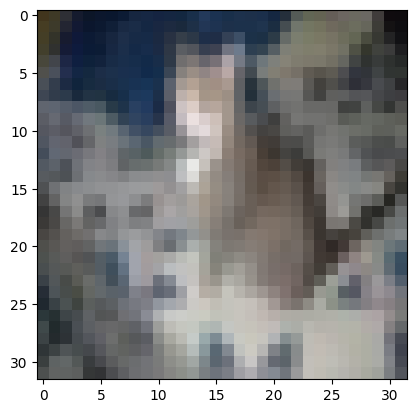

Prediction:  5    Class:  dog


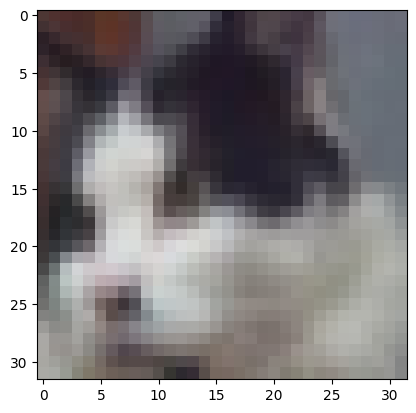

Prediction:  3    Class:  cat


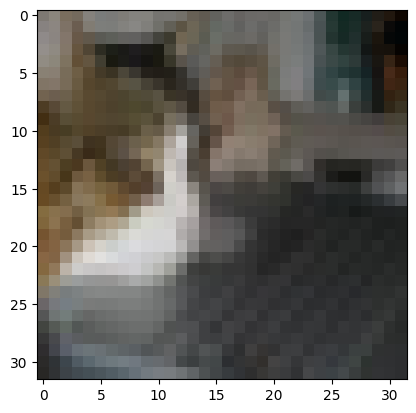

Prediction:  3    Class:  cat


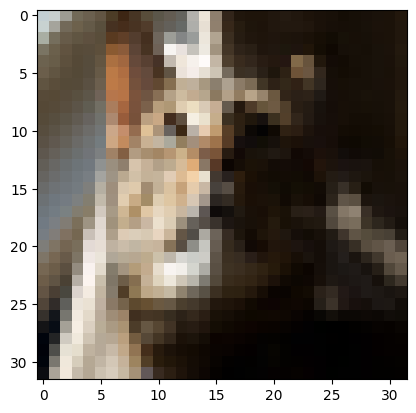

Prediction:  3    Class:  cat


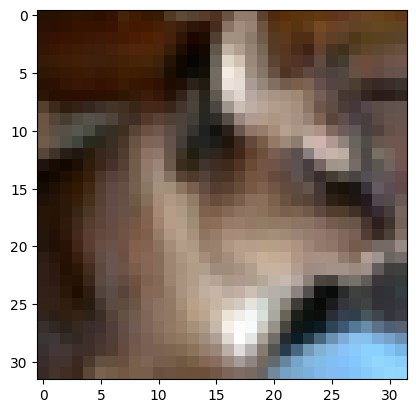

Prediction:  3    Class:  cat


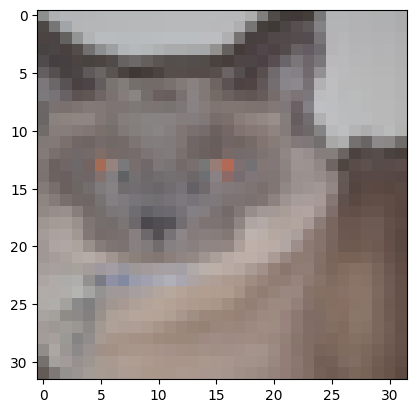

Prediction:  9    Class:  truck


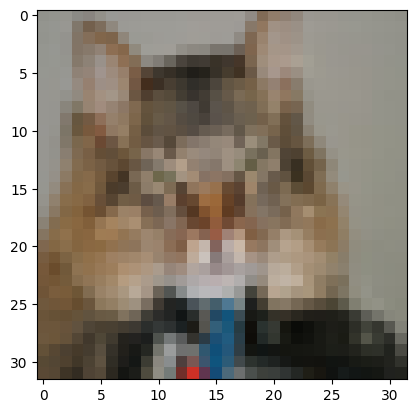

Prediction:  2    Class:  bird


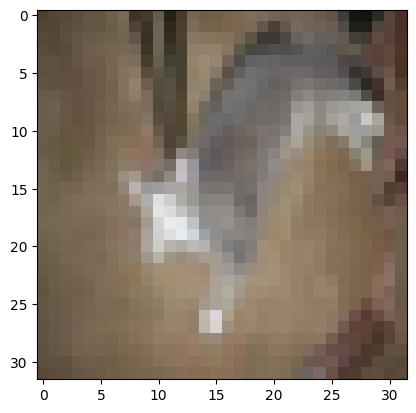

Prediction:  5    Class:  dog


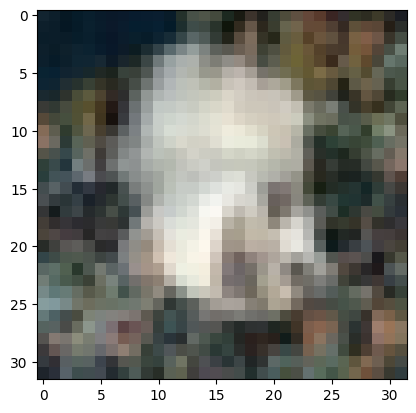

Prediction:  3    Class:  cat


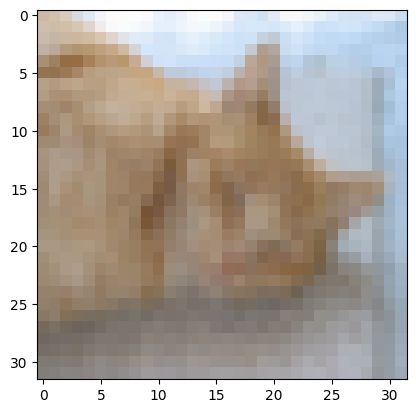

Prediction:  3    Class:  cat


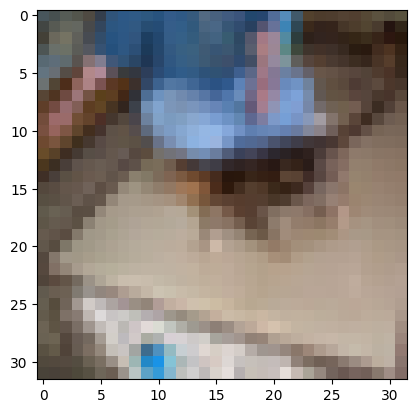

Prediction:  3    Class:  cat


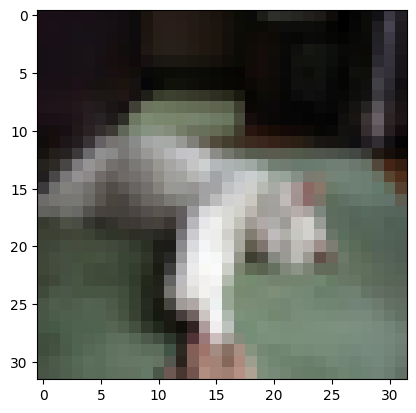

Prediction:  3    Class:  cat


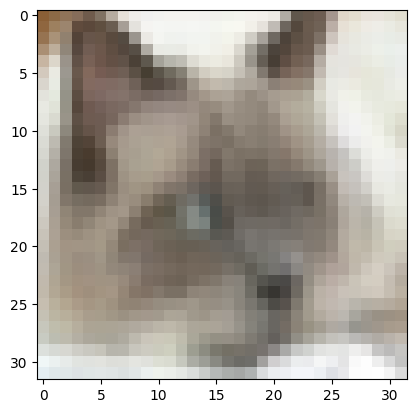

Prediction:  6    Class:  frog


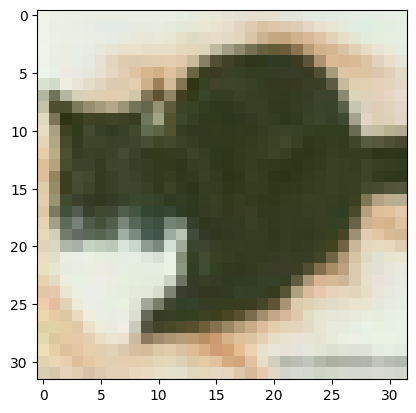

Prediction:  5    Class:  dog


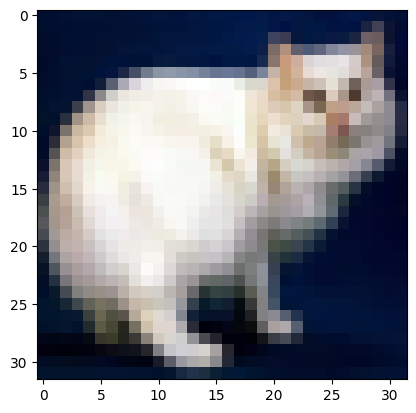

Prediction:  6    Class:  frog


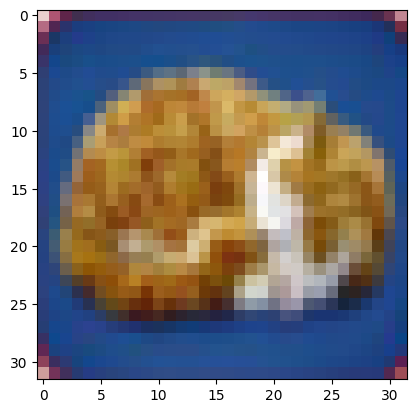

Prediction:  8    Class:  ship


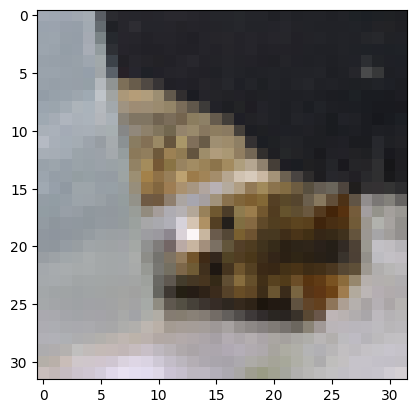

Prediction:  3    Class:  cat


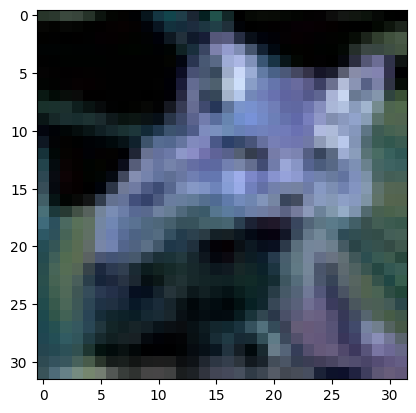

Prediction:  9    Class:  truck


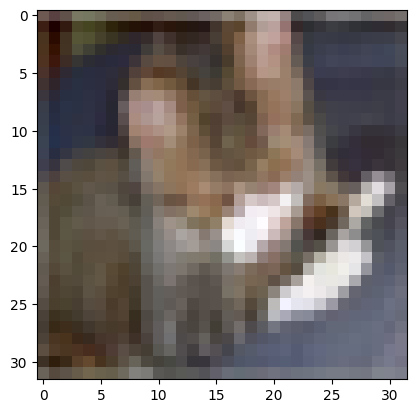

Prediction:  7    Class:  horse


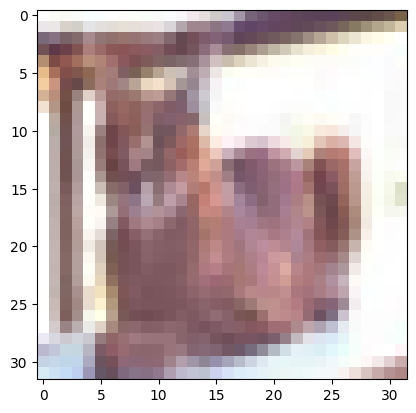

Prediction:  6    Class:  frog


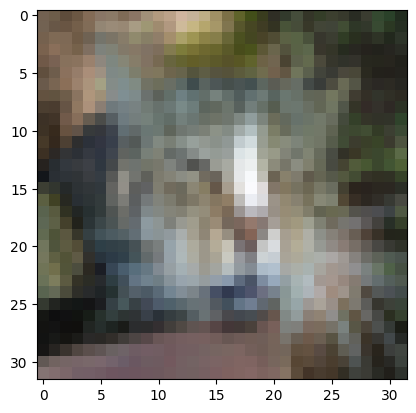

Prediction:  3    Class:  cat


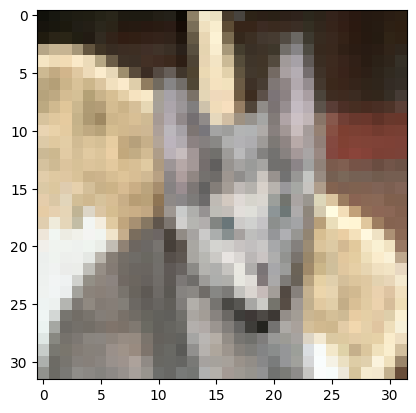

Prediction:  5    Class:  dog


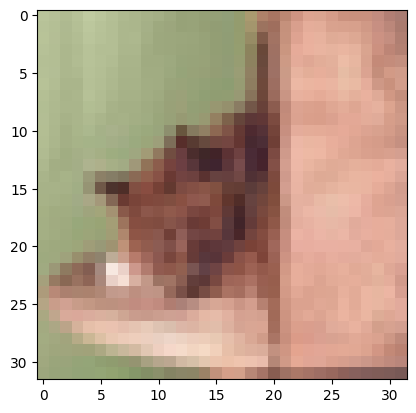

Prediction:  2    Class:  bird


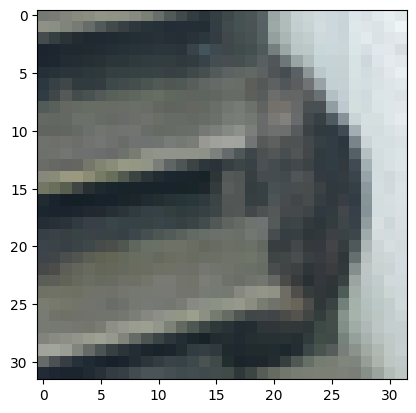

Prediction:  3    Class:  cat


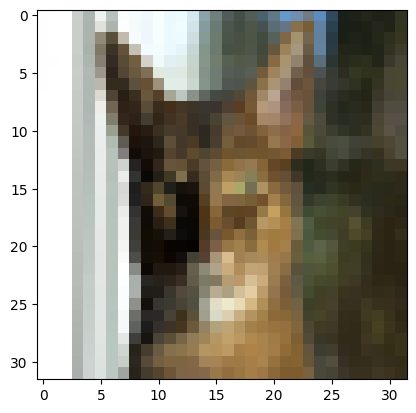

Prediction:  5    Class:  dog


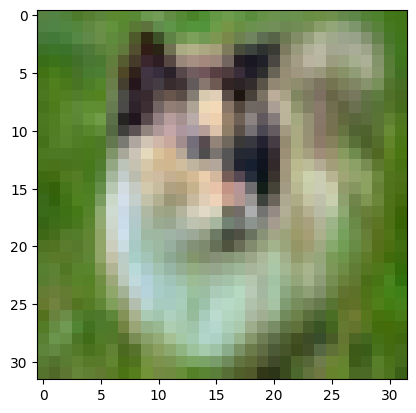

Prediction:  3    Class:  cat


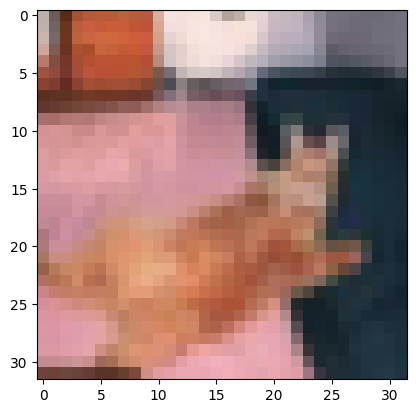

Prediction:  5    Class:  dog


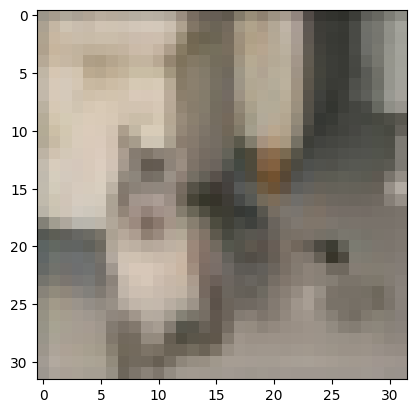

Prediction:  2    Class:  bird


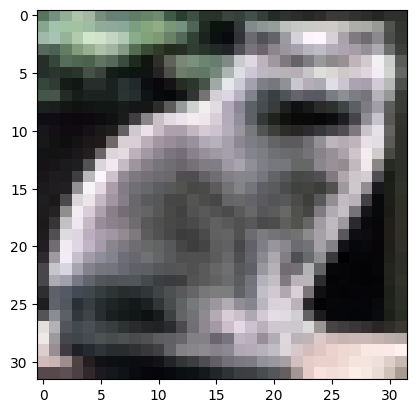

Prediction:  3    Class:  cat


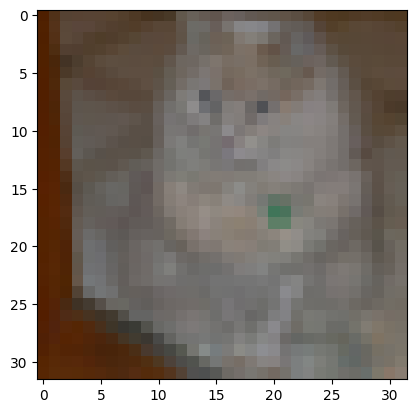

Prediction:  3    Class:  cat


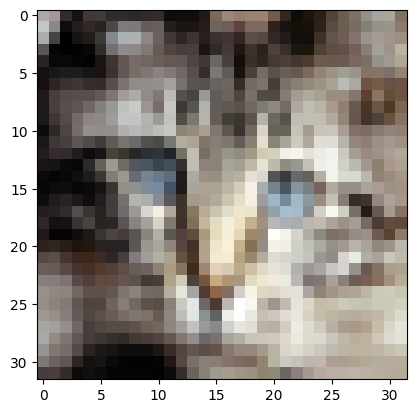

Prediction:  5    Class:  dog


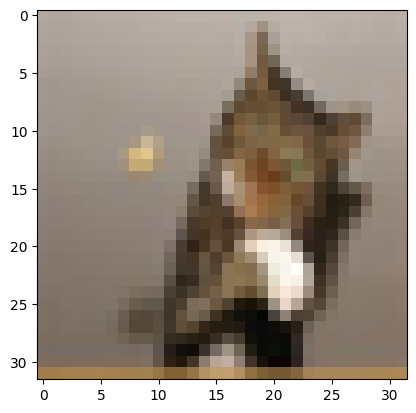

Prediction:  5    Class:  dog


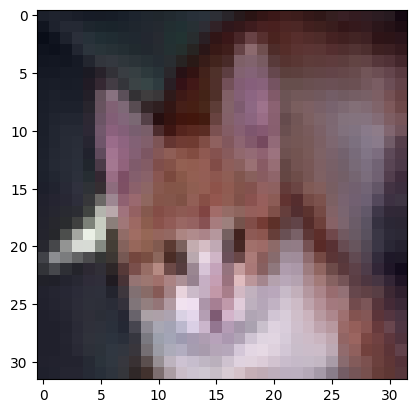

Prediction:  3    Class:  cat


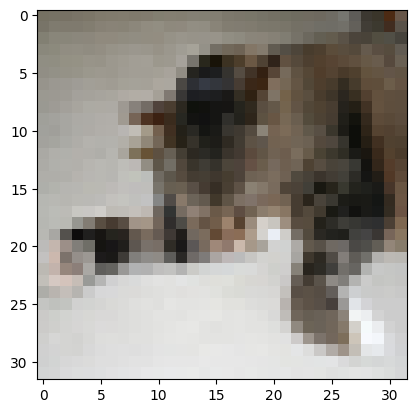

Prediction:  6    Class:  frog


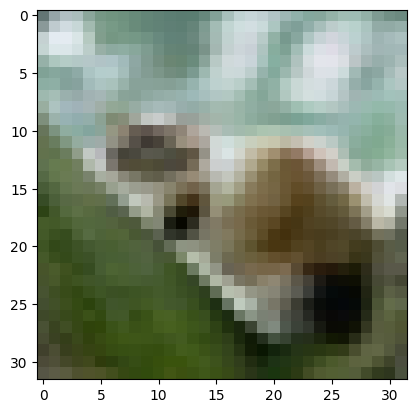

Prediction:  3    Class:  cat


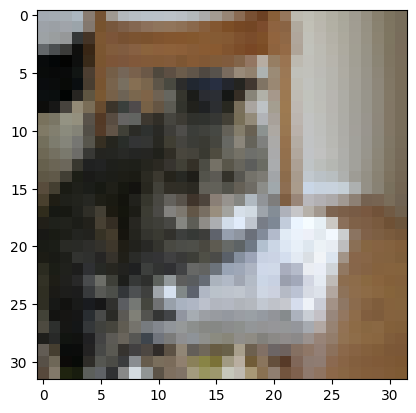

Prediction:  3    Class:  cat


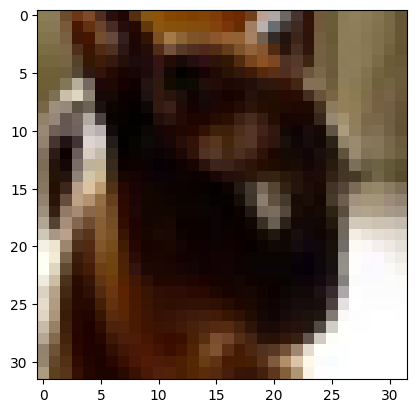

Prediction:  2    Class:  bird


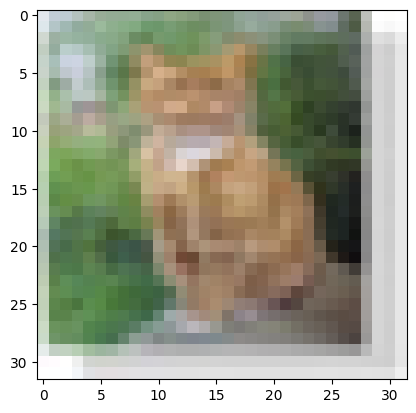

Prediction:  3    Class:  cat


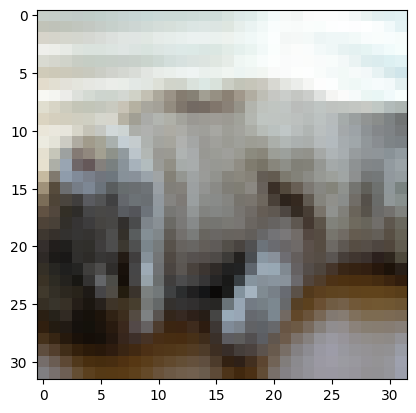

Prediction:  4    Class:  deer


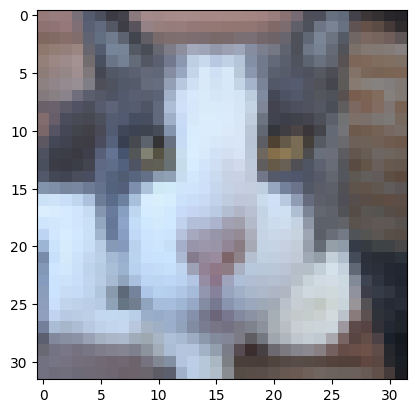

Prediction:  7    Class:  horse


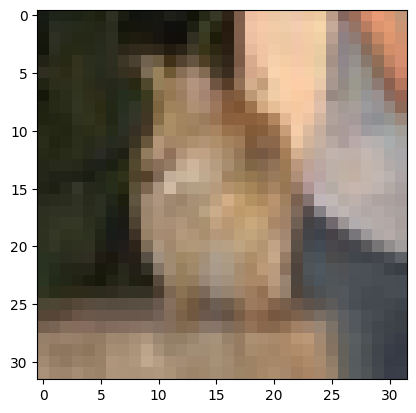

Prediction:  5    Class:  dog


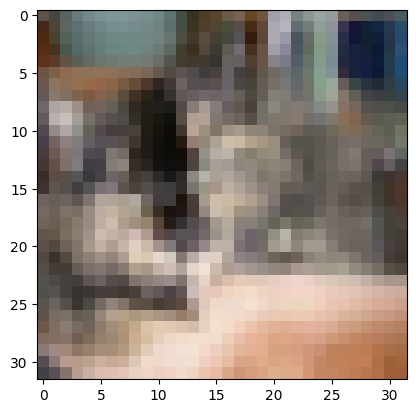

Prediction:  3    Class:  cat


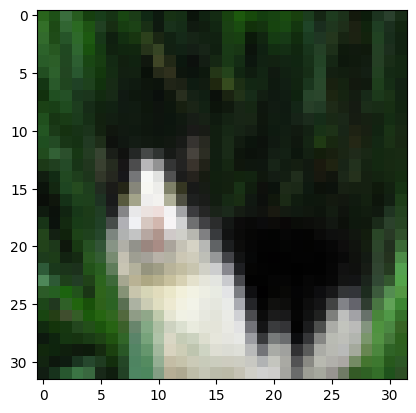

Prediction:  3    Class:  cat


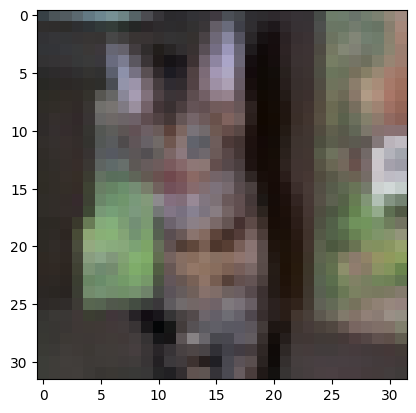

Prediction:  0    Class:  airplane


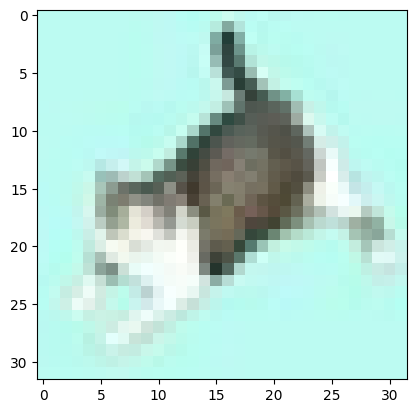

Prediction:  1    Class:  automobile


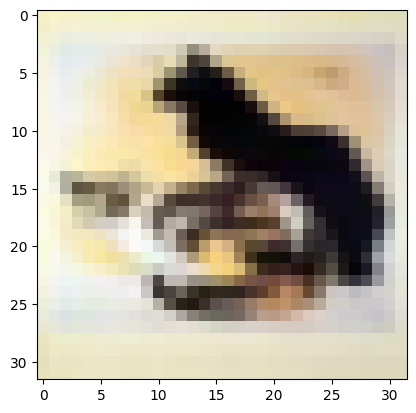

Prediction:  5    Class:  dog


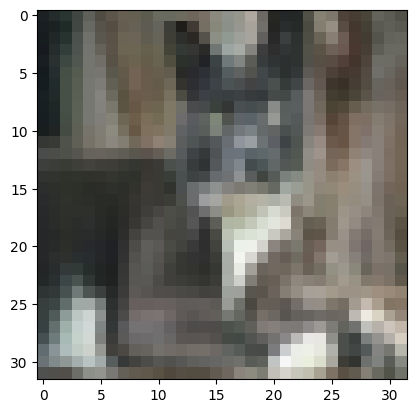

Prediction:  5    Class:  dog


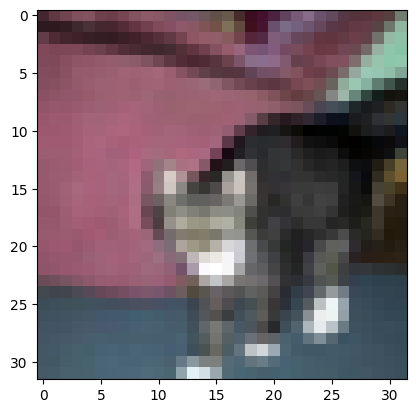

Prediction:  3    Class:  cat


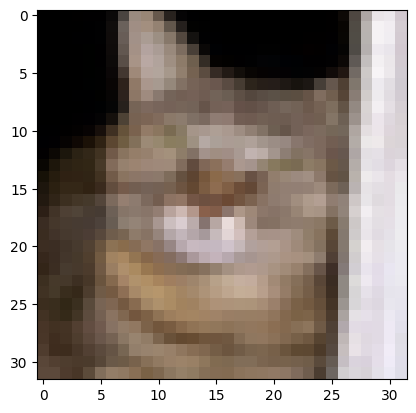

Prediction:  3    Class:  cat


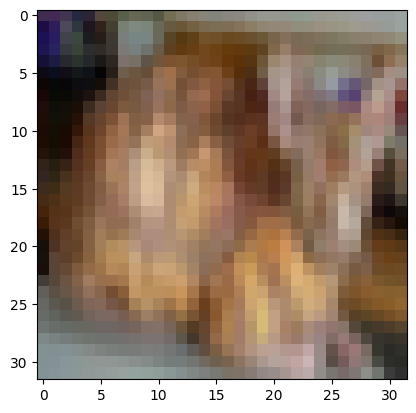

Prediction:  3    Class:  cat


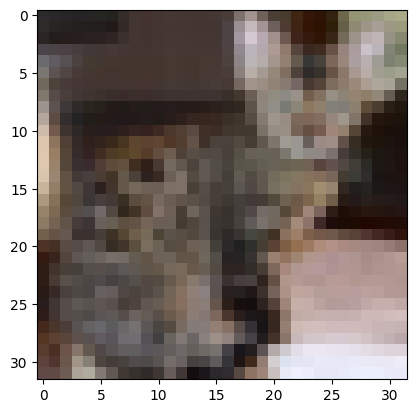

Prediction:  3    Class:  cat


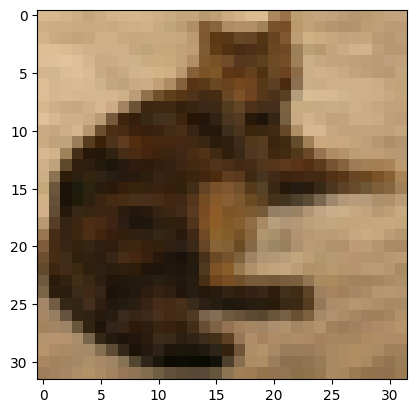

Prediction:  3    Class:  cat


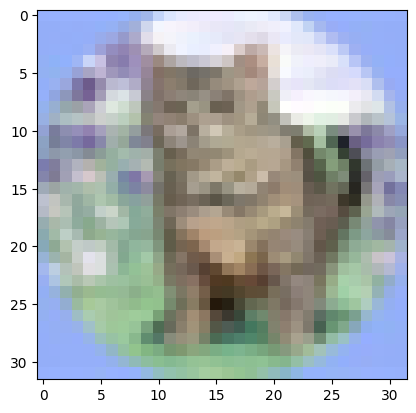

Prediction:  0    Class:  airplane


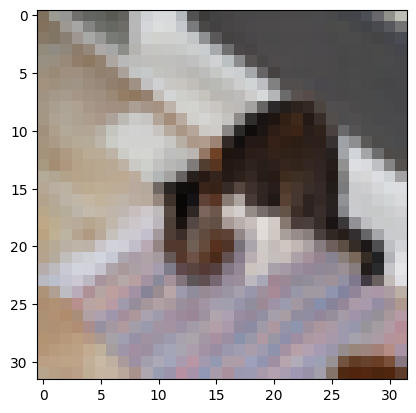

Prediction:  5    Class:  dog


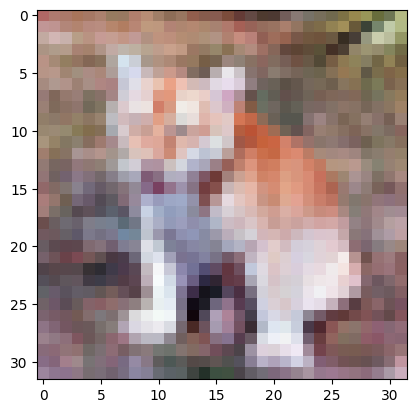

Prediction:  5    Class:  dog


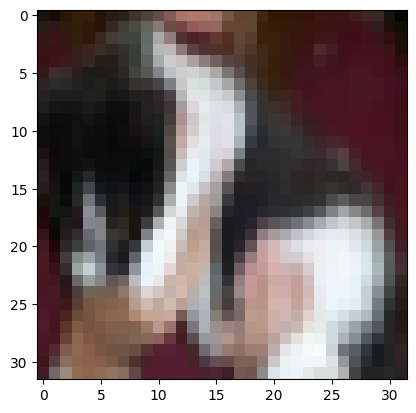

Prediction:  3    Class:  cat


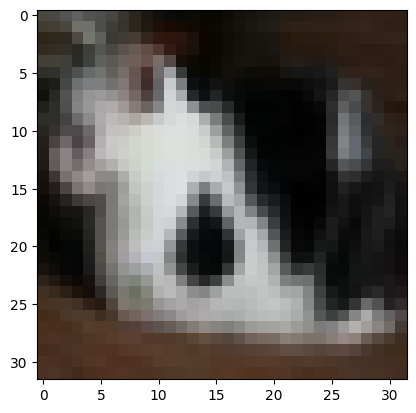

Prediction:  3    Class:  cat


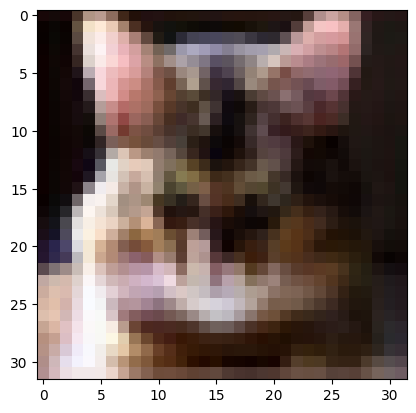

Prediction:  3    Class:  cat


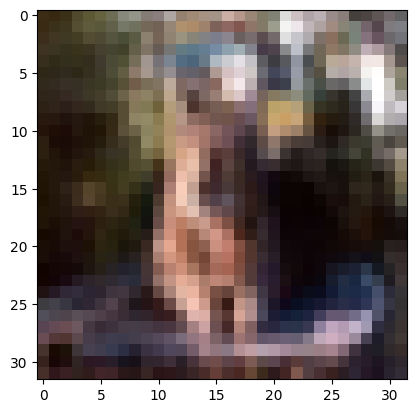

Prediction:  7    Class:  horse


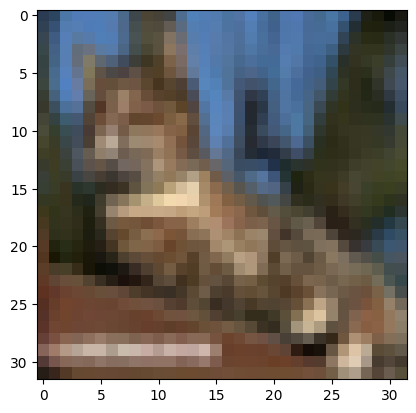

Prediction:  5    Class:  dog


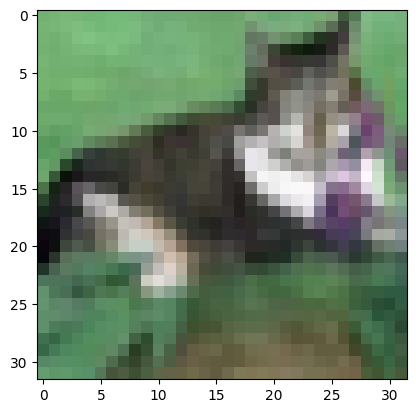

Prediction:  6    Class:  frog


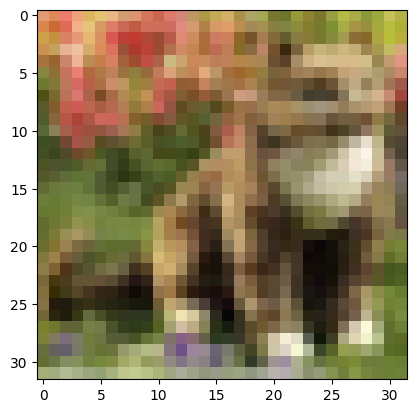

Prediction:  9    Class:  truck


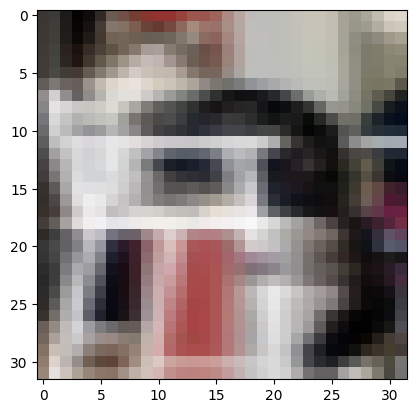

Prediction:  3    Class:  cat


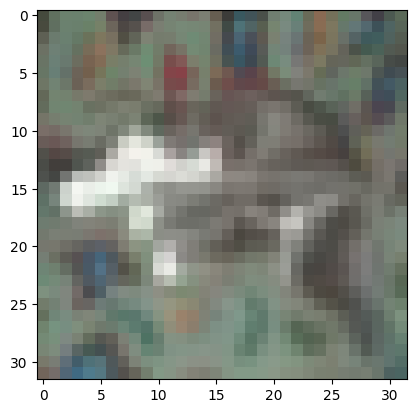

Prediction:  3    Class:  cat


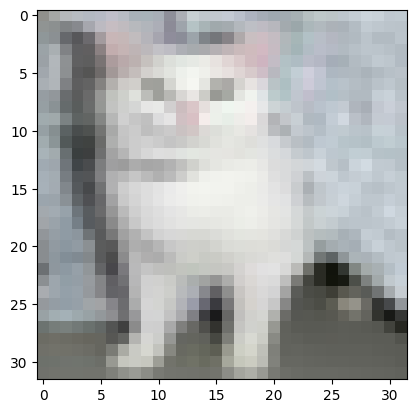

Prediction:  3    Class:  cat


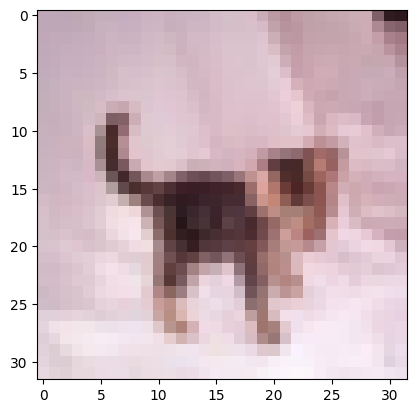

Prediction:  7    Class:  horse


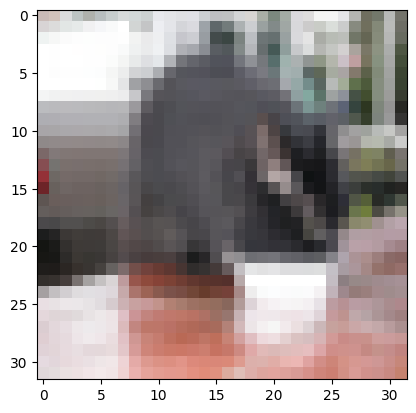

Prediction:  3    Class:  cat


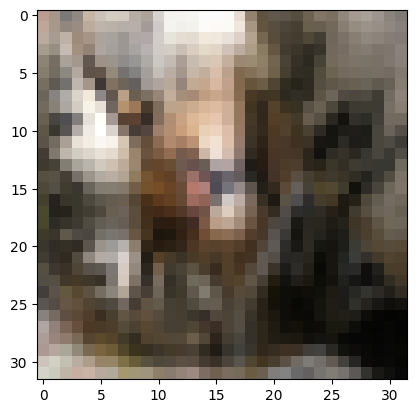

Prediction:  5    Class:  dog


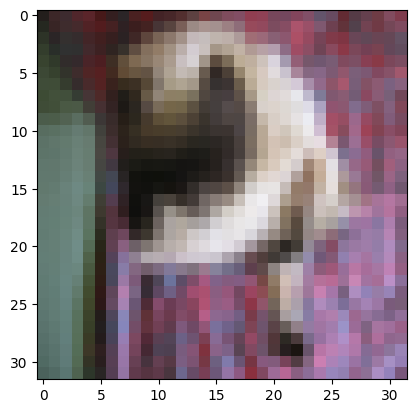

Prediction:  5    Class:  dog


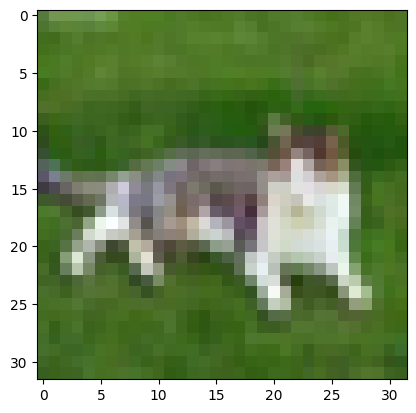

Prediction:  3    Class:  cat


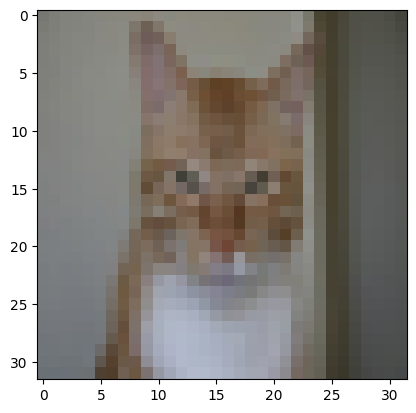

Prediction:  7    Class:  horse


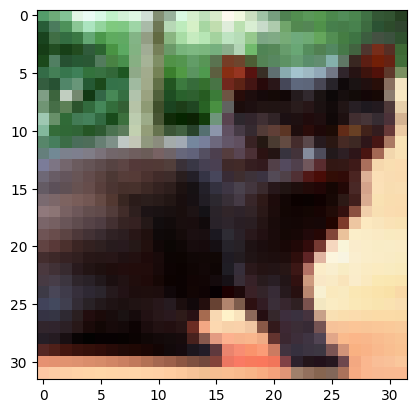

Prediction:  2    Class:  bird


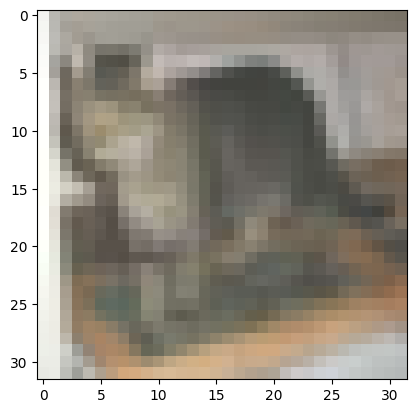

Prediction:  1    Class:  automobile


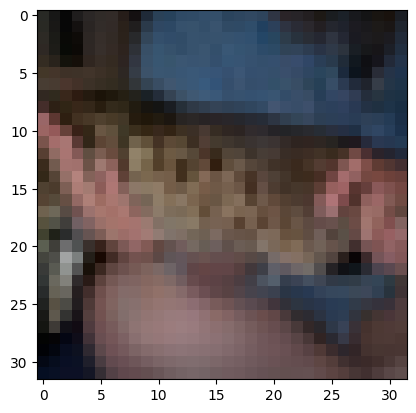

Prediction:  5    Class:  dog


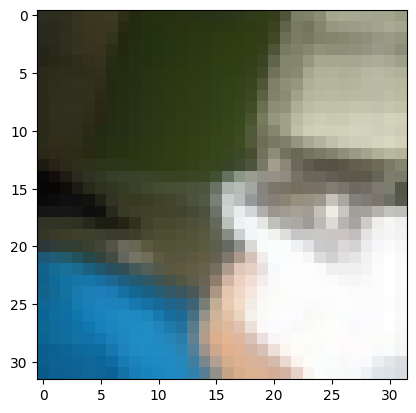

Prediction:  3    Class:  cat


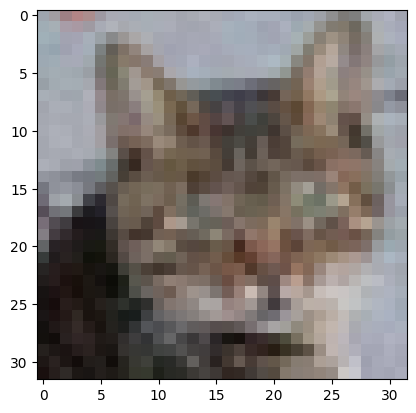

Prediction:  7    Class:  horse


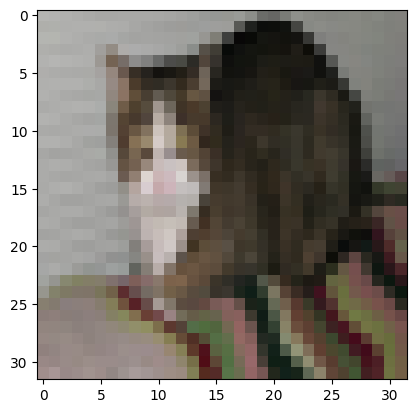

Prediction:  8    Class:  ship


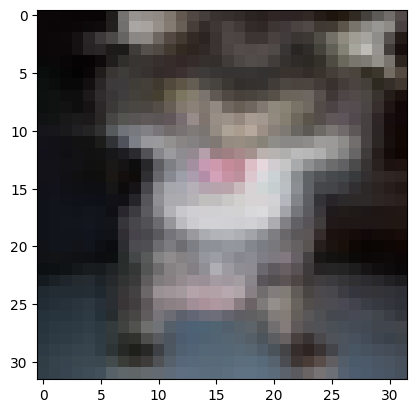

Prediction:  3    Class:  cat


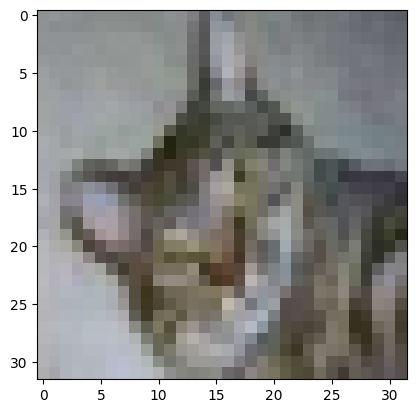

Prediction:  3    Class:  cat


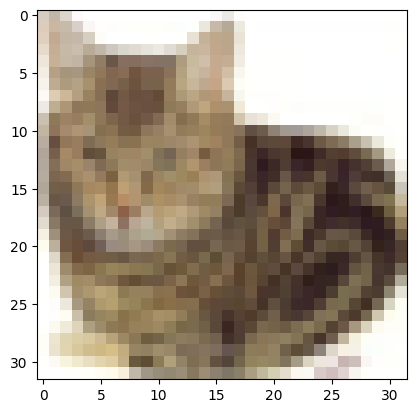

Prediction:  3    Class:  cat


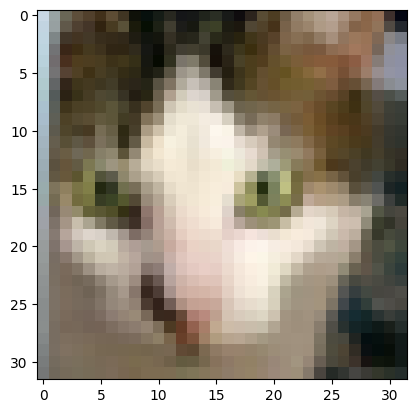

Prediction:  2    Class:  bird


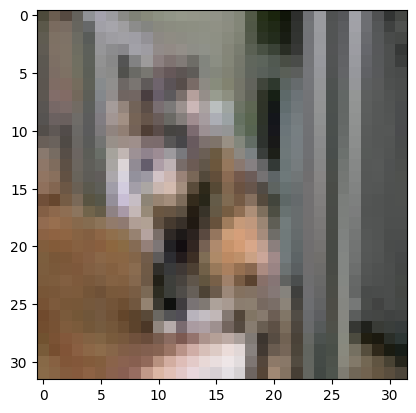

Prediction:  3    Class:  cat


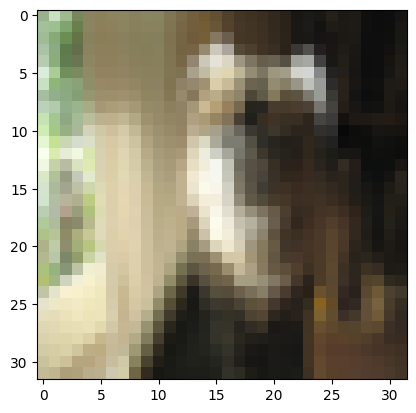

Prediction:  3    Class:  cat


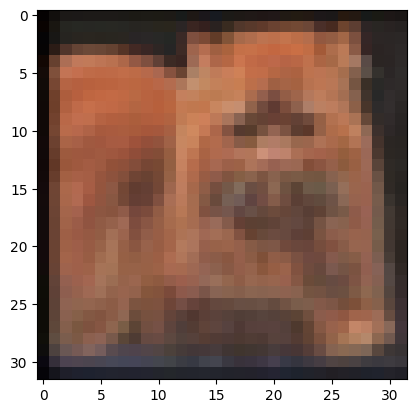

Prediction:  9    Class:  truck


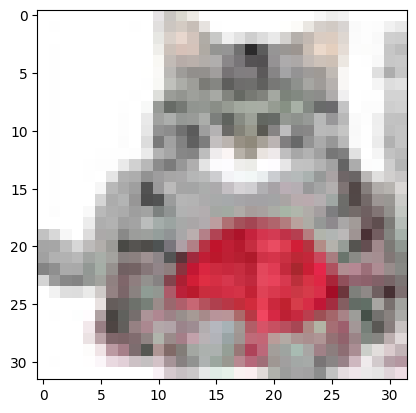

Prediction:  7    Class:  horse


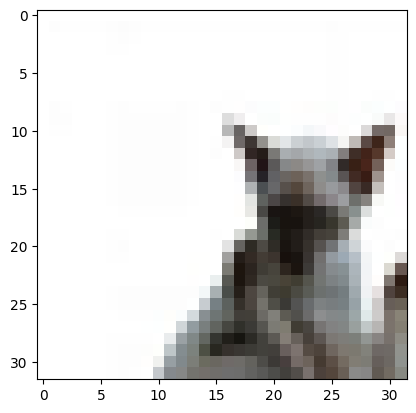

Prediction:  3    Class:  cat


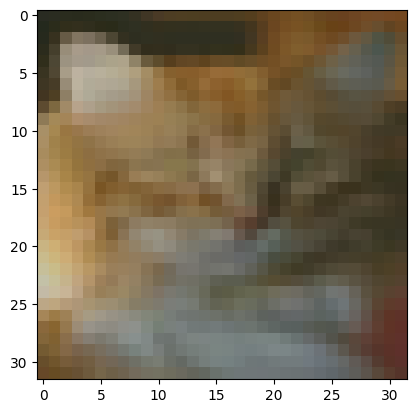

Prediction:  2    Class:  bird


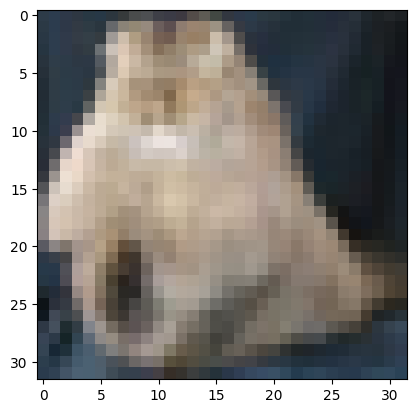

Prediction:  6    Class:  frog


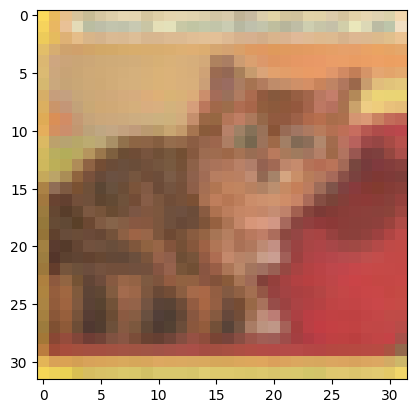

Prediction:  3    Class:  cat


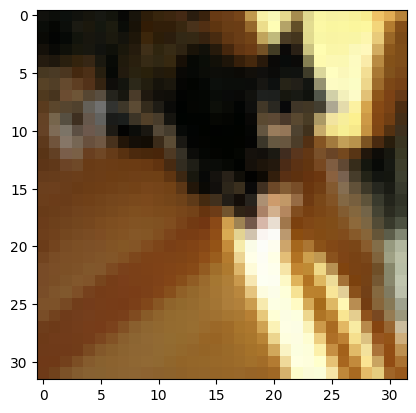

Prediction:  1    Class:  automobile


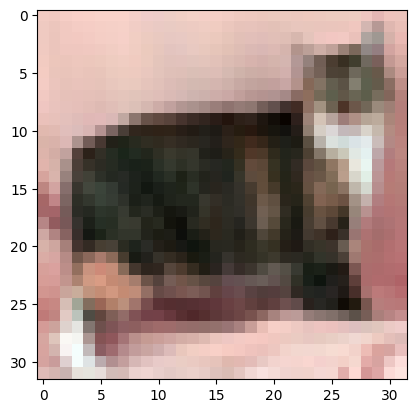

Prediction:  3    Class:  cat


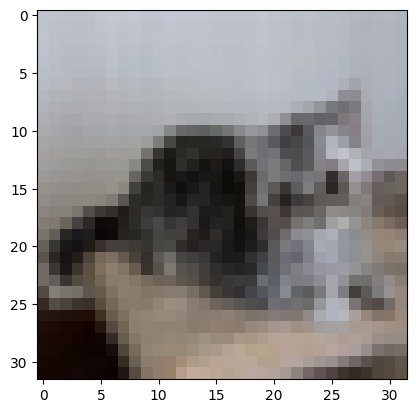

Prediction:  2    Class:  bird


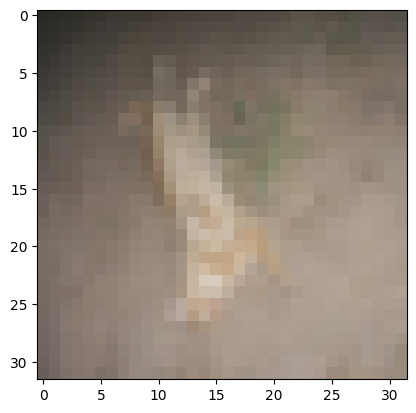

Prediction:  3    Class:  cat


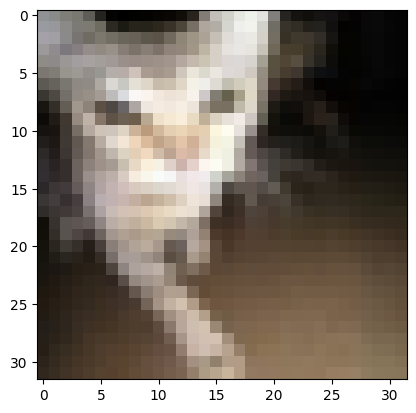

Prediction:  3    Class:  cat


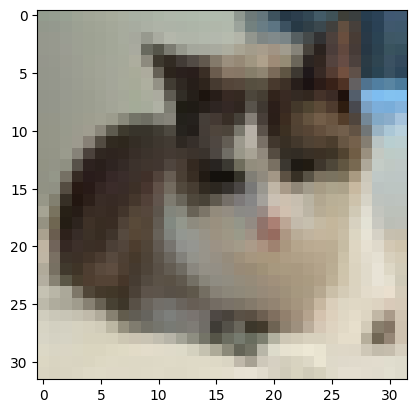

Prediction:  6    Class:  frog


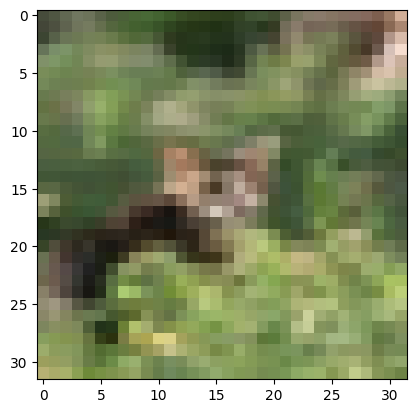

Prediction:  8    Class:  ship


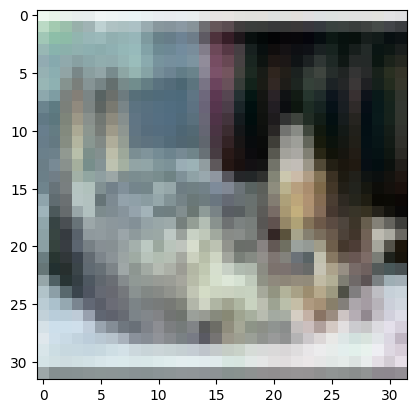

Prediction:  3    Class:  cat


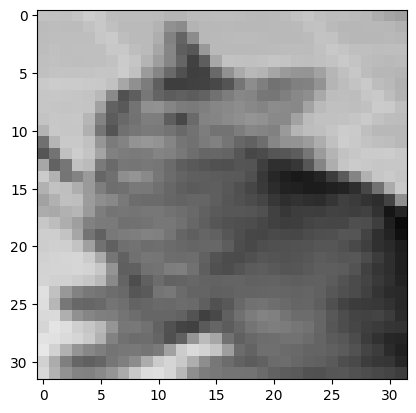

Prediction:  5    Class:  dog


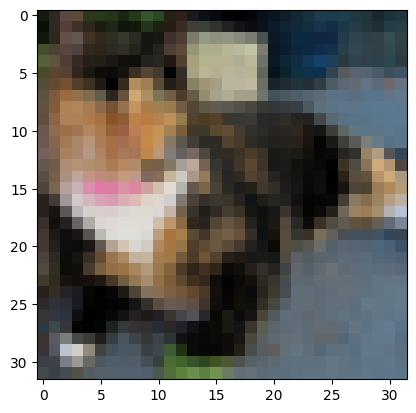

Prediction:  1    Class:  automobile


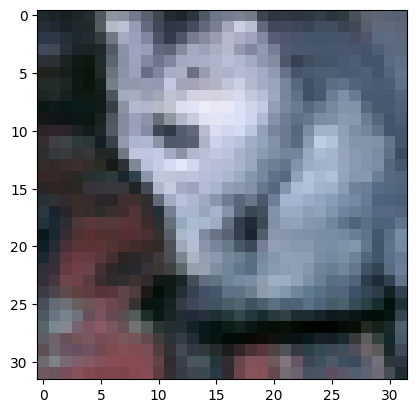

Prediction:  3    Class:  cat


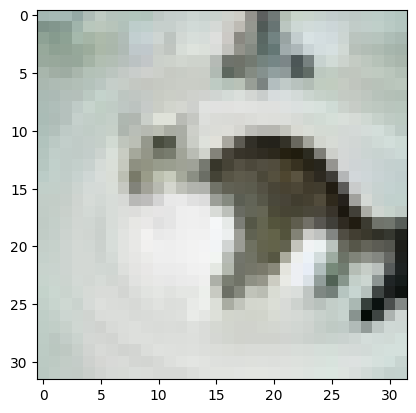

Prediction:  3    Class:  cat


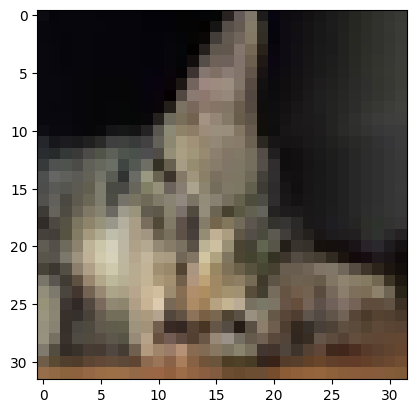

Prediction:  3    Class:  cat


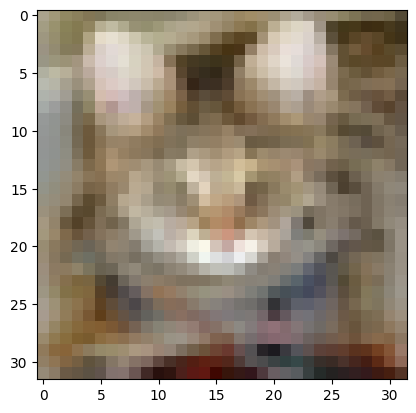

Prediction:  3    Class:  cat


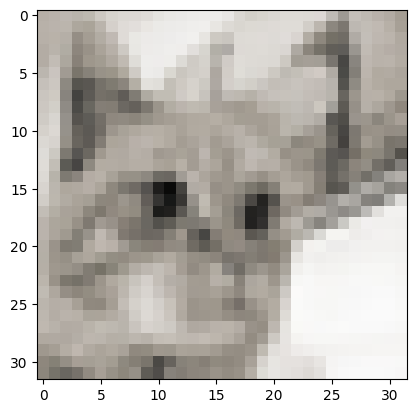

Prediction:  3    Class:  cat


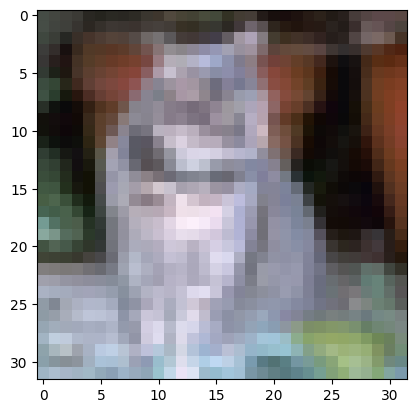

Prediction:  6    Class:  frog


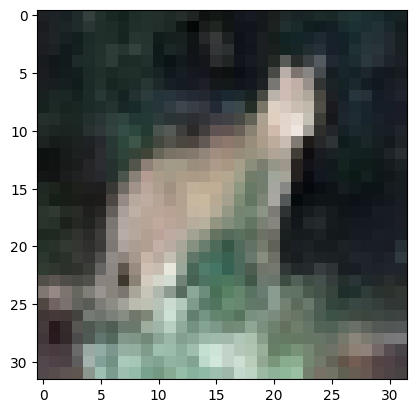

Prediction:  3    Class:  cat


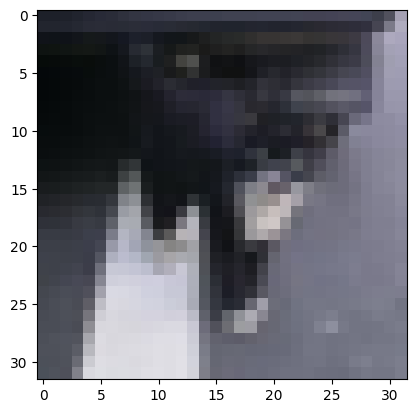

Prediction:  8    Class:  ship


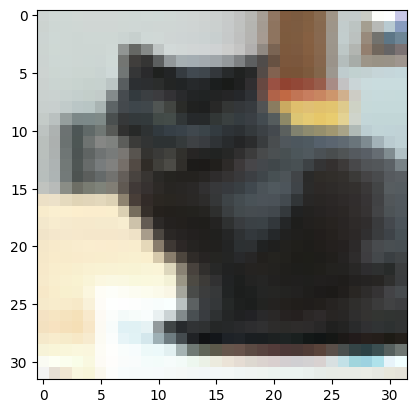

Prediction:  3    Class:  cat


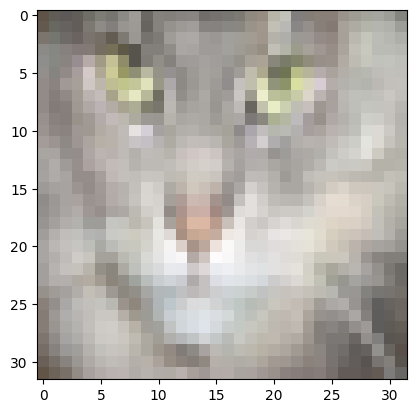

Prediction:  3    Class:  cat


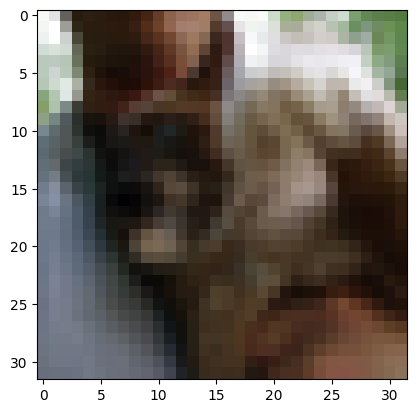

Prediction:  3    Class:  cat


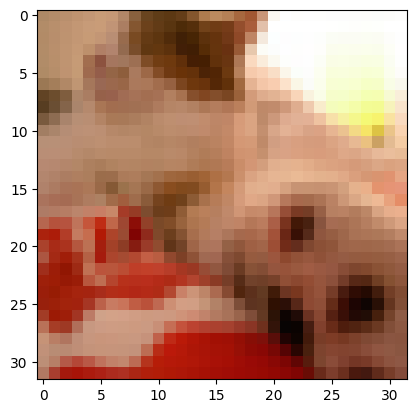

Prediction:  3    Class:  cat


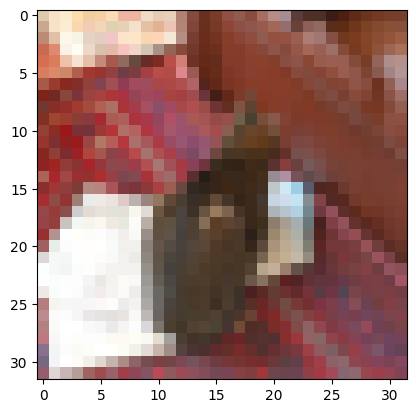

Prediction:  0    Class:  airplane


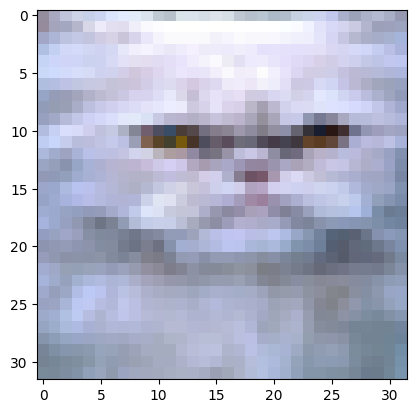

Prediction:  3    Class:  cat


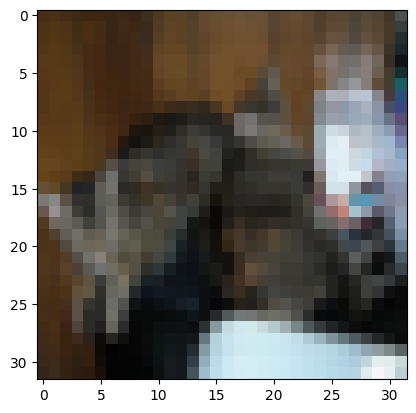

Prediction:  7    Class:  horse


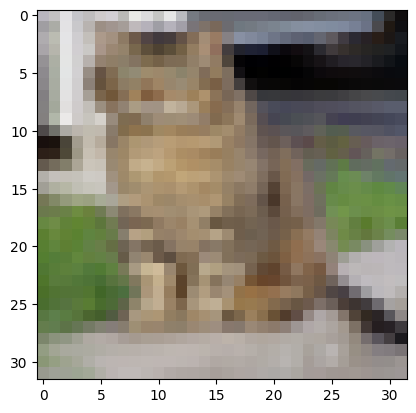

Prediction:  3    Class:  cat


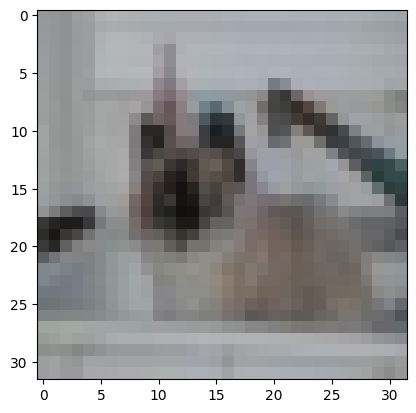

Prediction:  7    Class:  horse


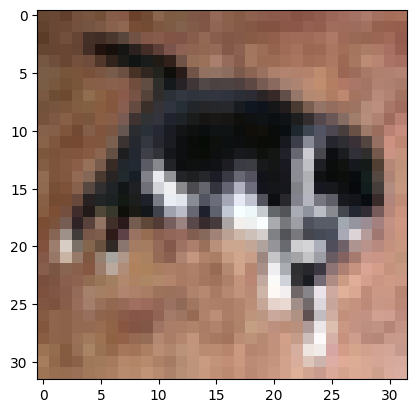

Prediction:  3    Class:  cat


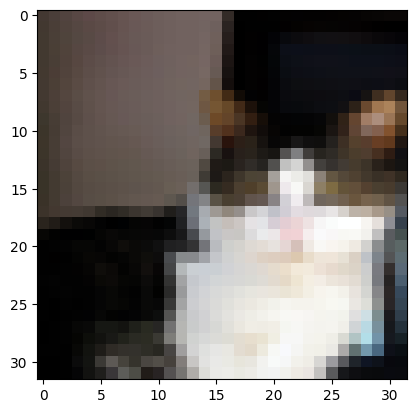

Prediction:  5    Class:  dog


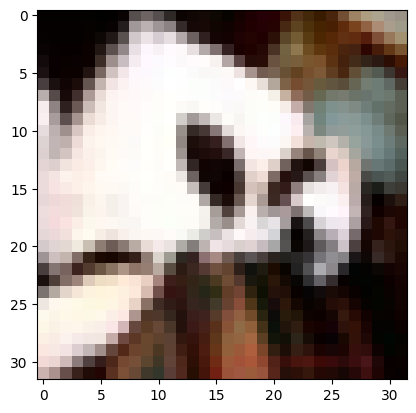

Prediction:  6    Class:  frog


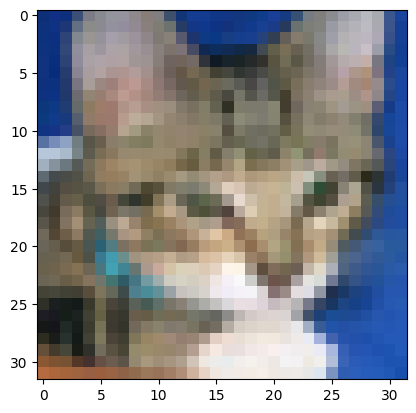

Prediction:  6    Class:  frog


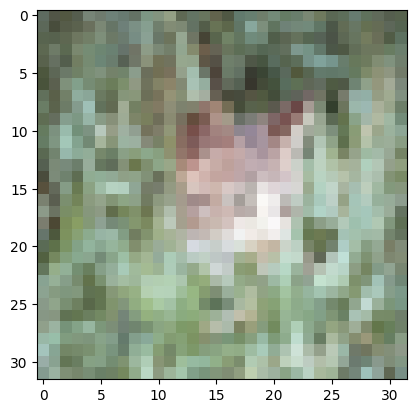

Prediction:  3    Class:  cat


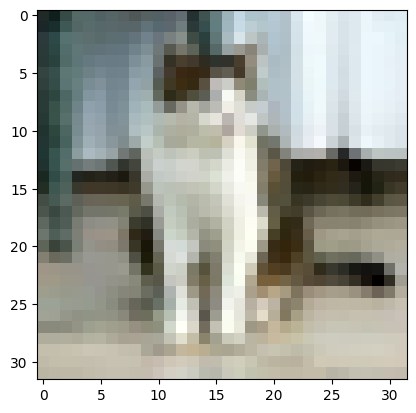

Prediction:  6    Class:  frog


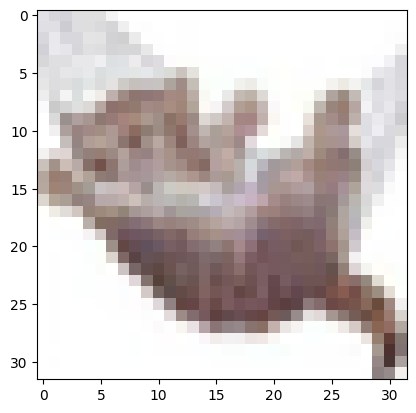

Prediction:  3    Class:  cat


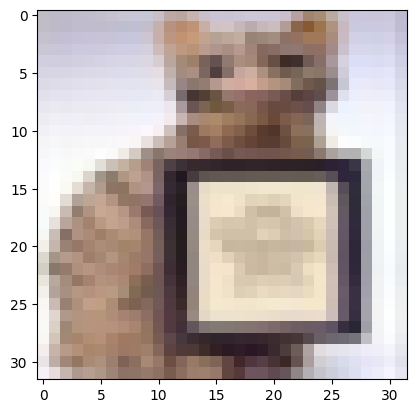

Prediction:  5    Class:  dog


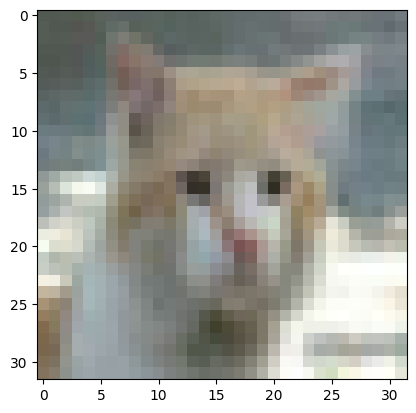

Prediction:  3    Class:  cat


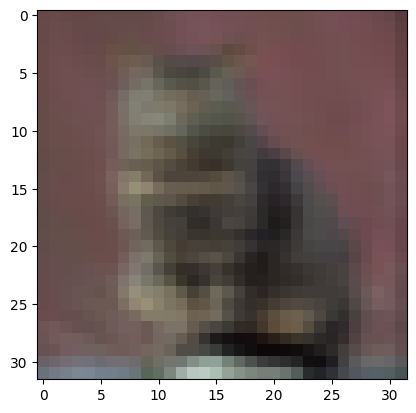

Prediction:  4    Class:  deer


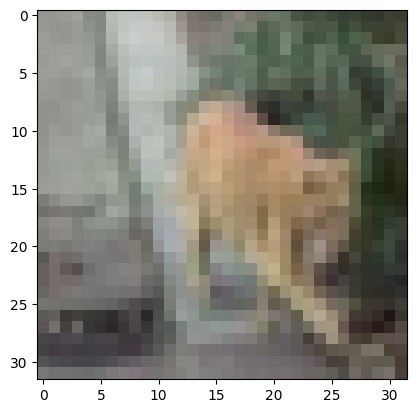

Prediction:  5    Class:  dog


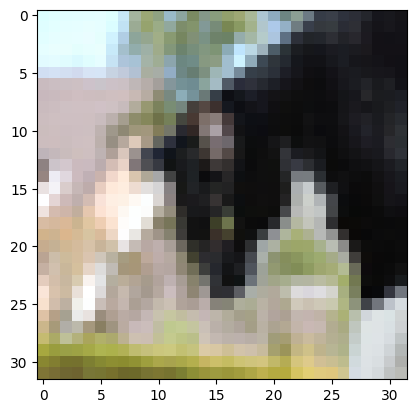

Prediction:  6    Class:  frog


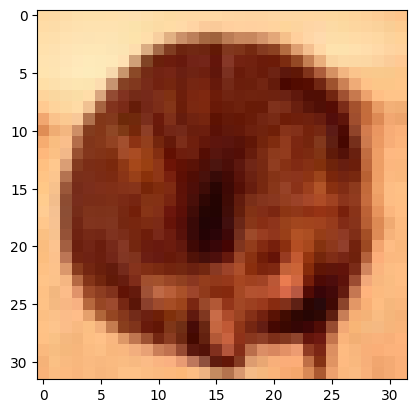

Prediction:  3    Class:  cat


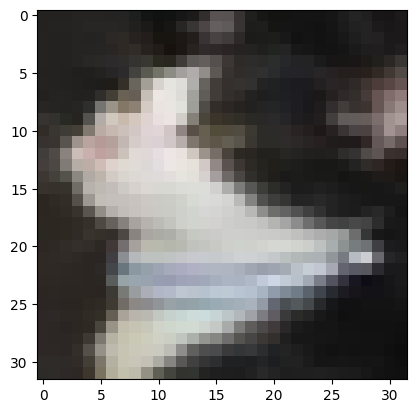

Prediction:  3    Class:  cat


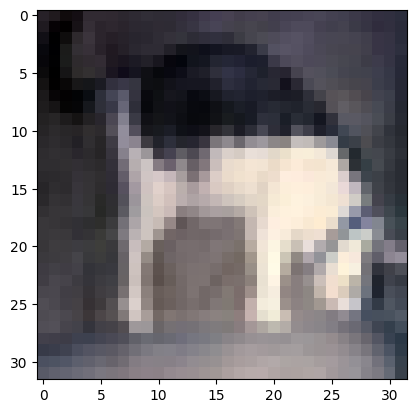

Prediction:  8    Class:  ship


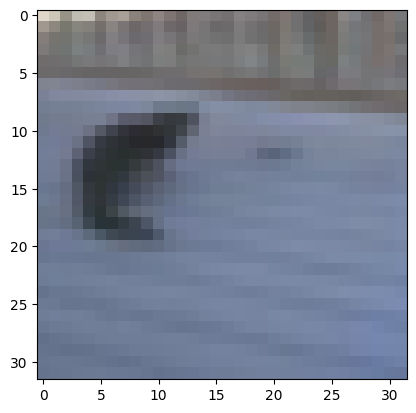

Prediction:  2    Class:  bird


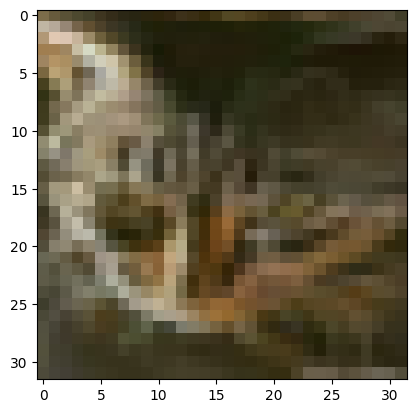

Prediction:  7    Class:  horse


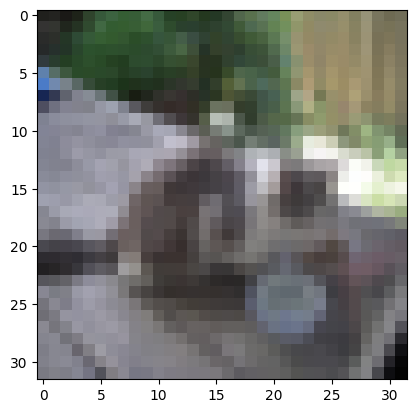

Prediction:  5    Class:  dog


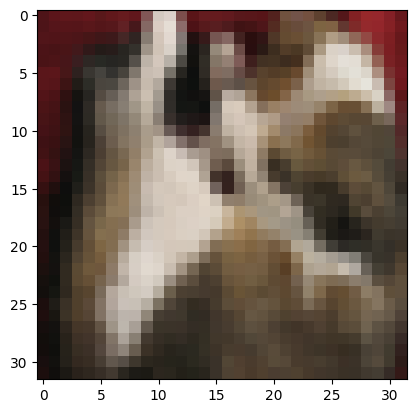

Prediction:  1    Class:  automobile


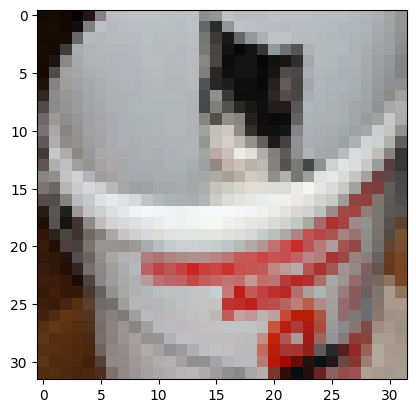

Prediction:  3    Class:  cat


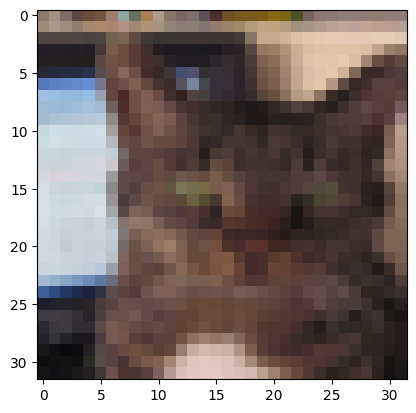

Prediction:  2    Class:  bird


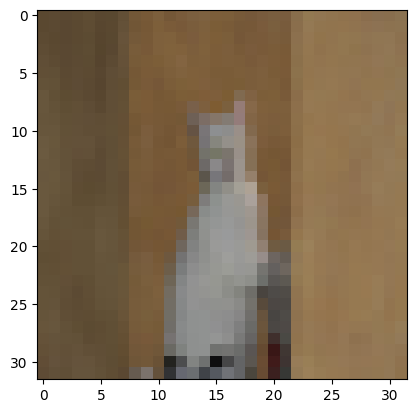

Prediction:  3    Class:  cat


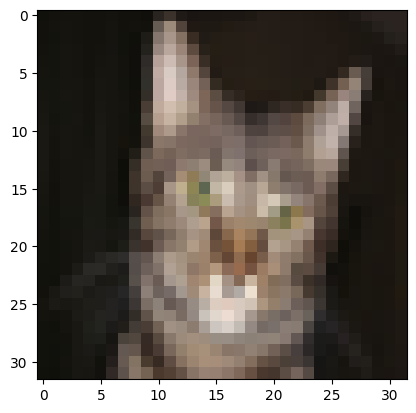

Prediction:  3    Class:  cat


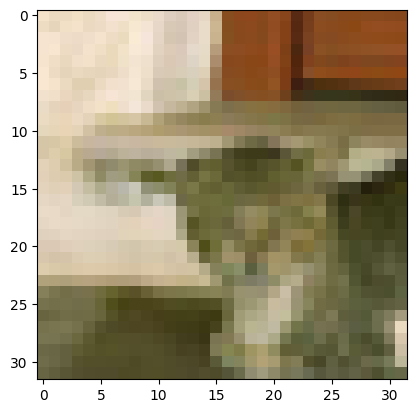

Prediction:  5    Class:  dog


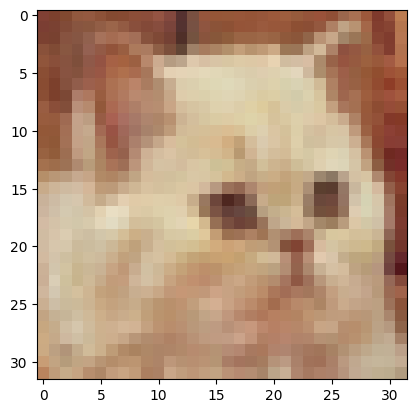

Prediction:  3    Class:  cat


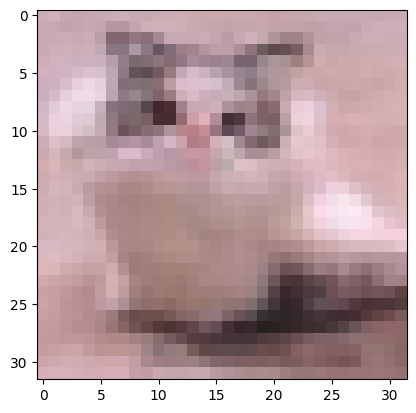

Prediction:  5    Class:  dog


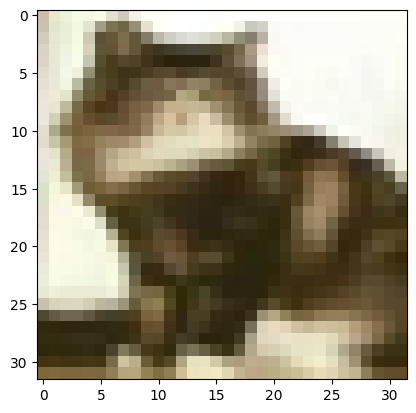

Prediction:  3    Class:  cat


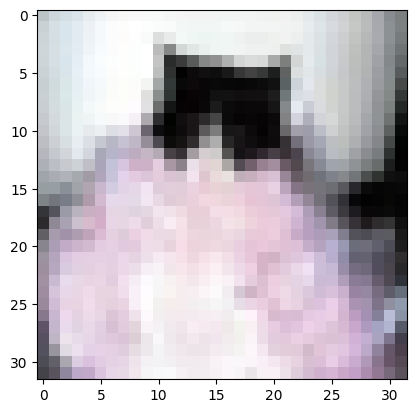

Prediction:  5    Class:  dog


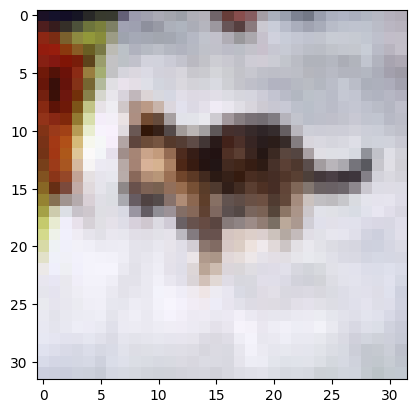

Prediction:  2    Class:  bird


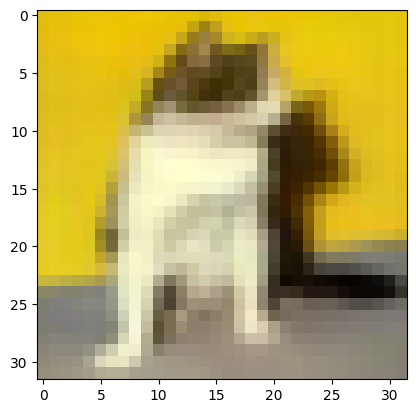

Prediction:  6    Class:  frog


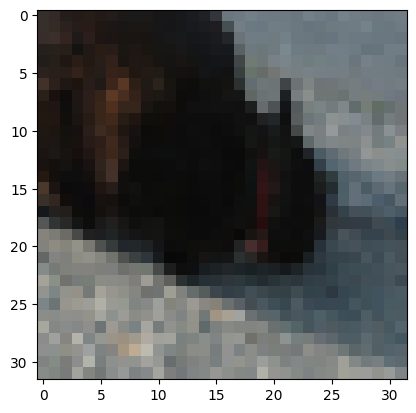

Prediction:  2    Class:  bird


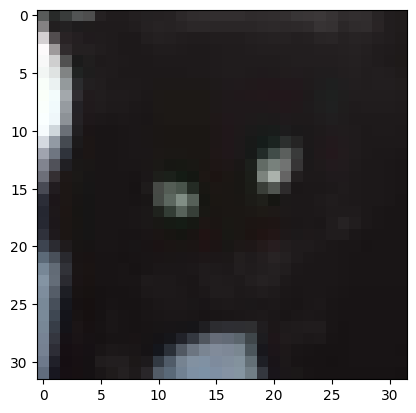

Prediction:  3    Class:  cat


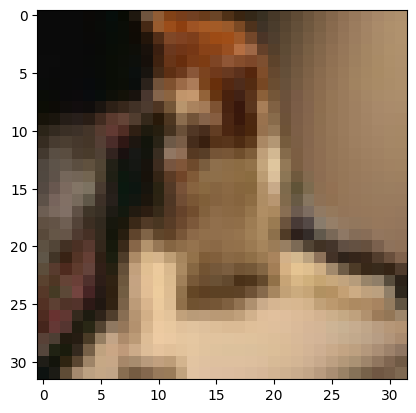

Prediction:  3    Class:  cat


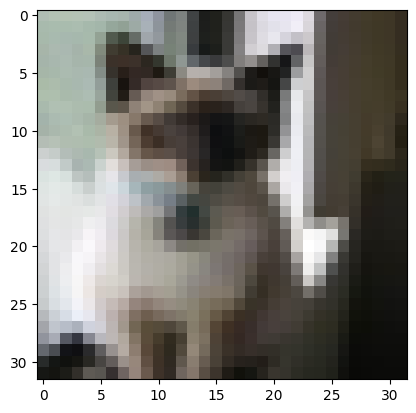

Prediction:  6    Class:  frog


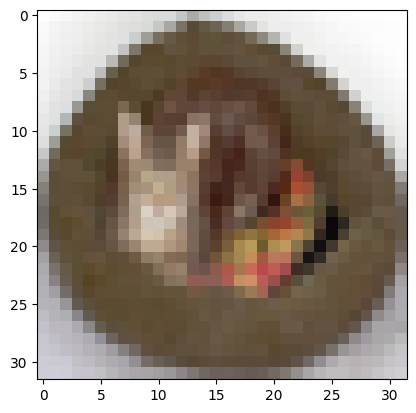

Prediction:  3    Class:  cat


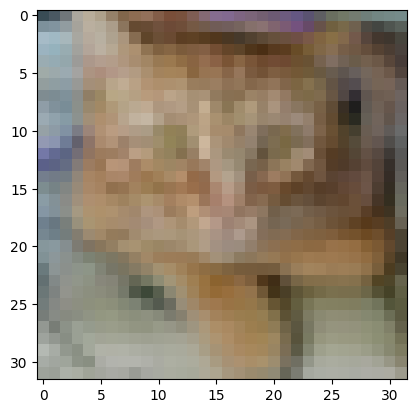

Prediction:  2    Class:  bird


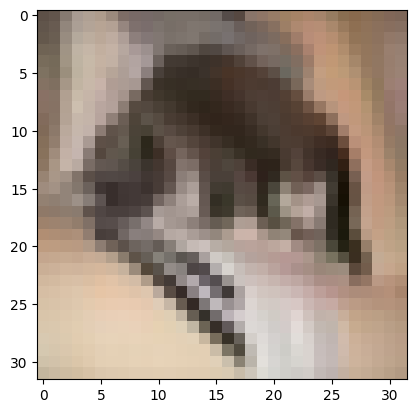

Prediction:  3    Class:  cat


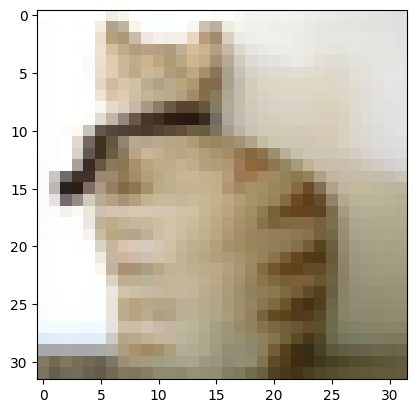

Prediction:  1    Class:  automobile


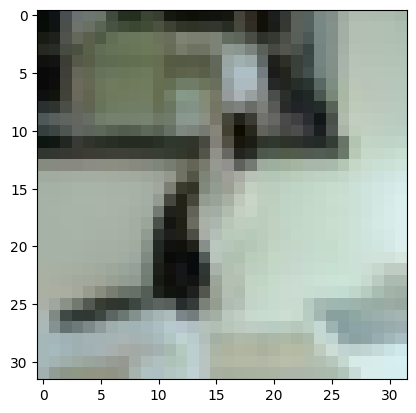

Prediction:  5    Class:  dog


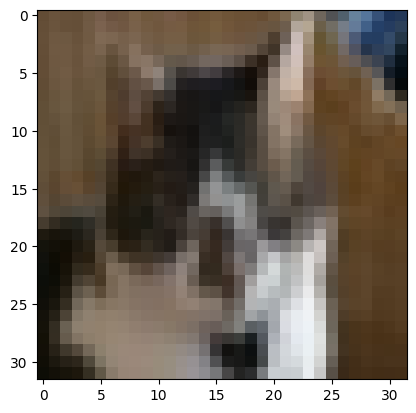

Prediction:  3    Class:  cat


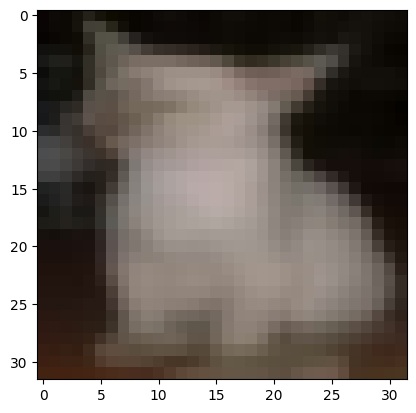

Prediction:  0    Class:  airplane


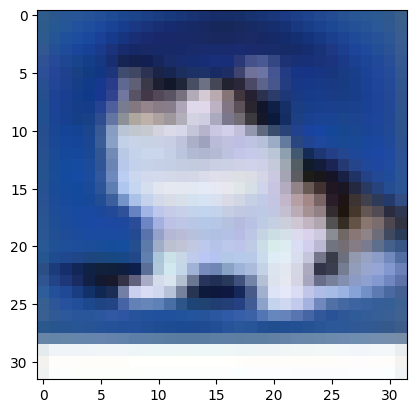

Prediction:  6    Class:  frog


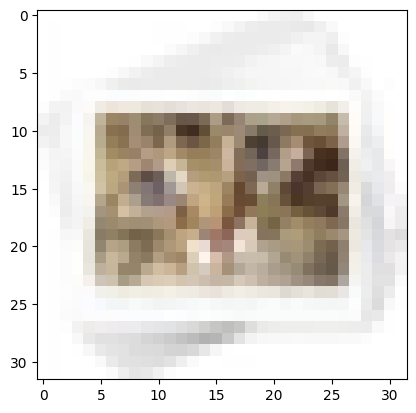

Prediction:  3    Class:  cat


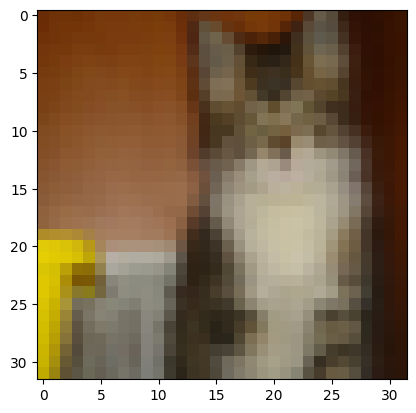

Prediction:  9    Class:  truck


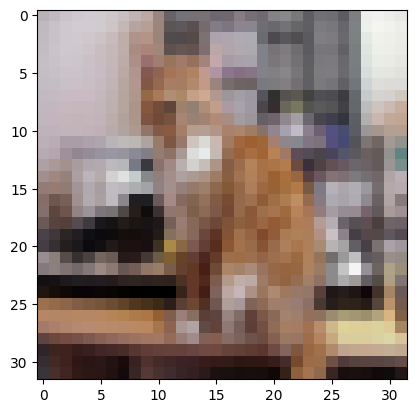

Prediction:  4    Class:  deer


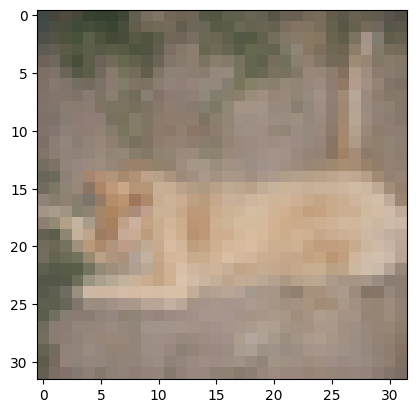

Prediction:  3    Class:  cat


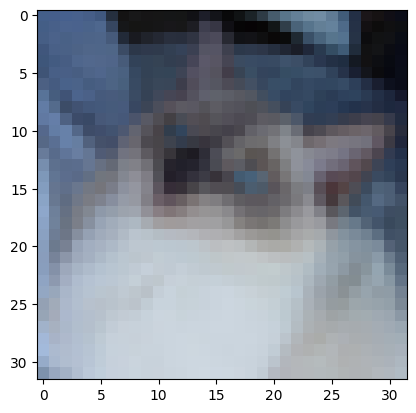

Prediction:  5    Class:  dog


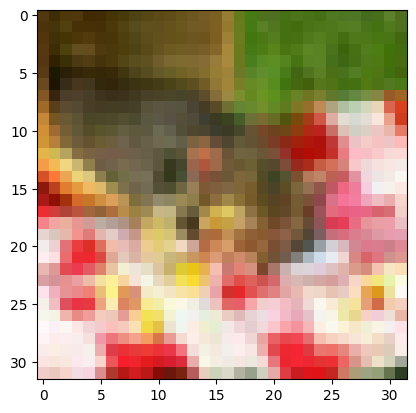

Prediction:  3    Class:  cat


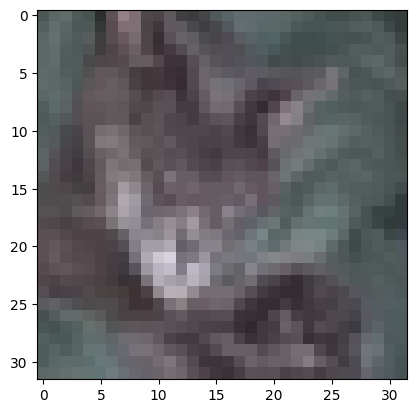

Prediction:  3    Class:  cat


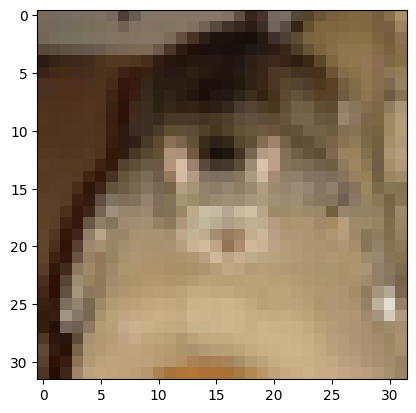

Prediction:  6    Class:  frog


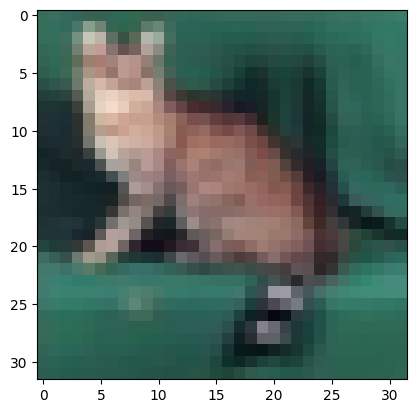

Prediction:  6    Class:  frog


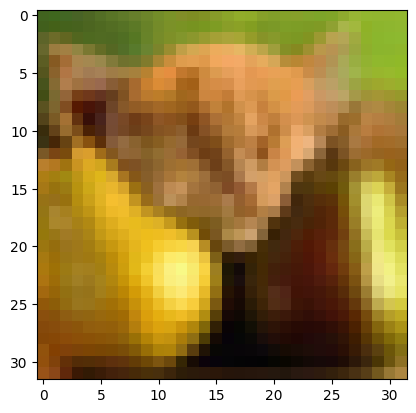

Prediction:  3    Class:  cat


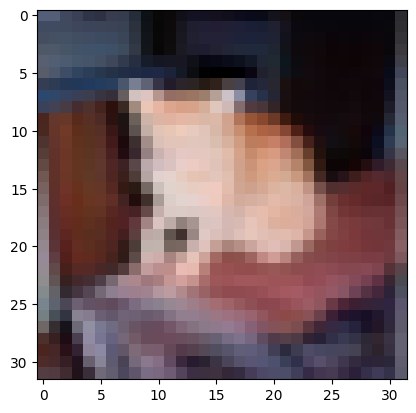

Prediction:  6    Class:  frog


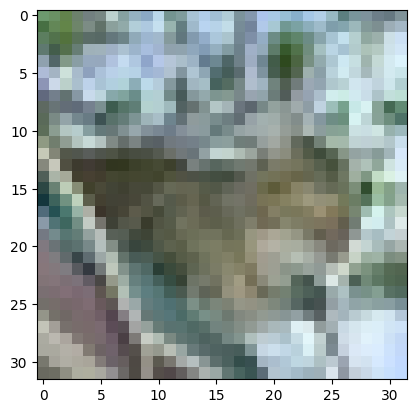

Prediction:  3    Class:  cat


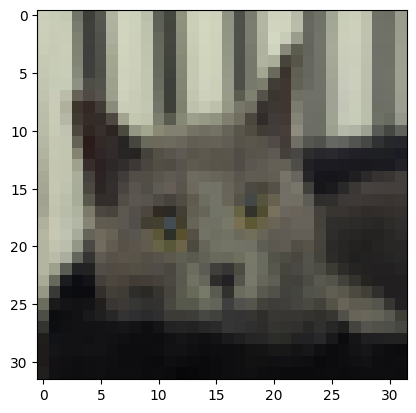

Prediction:  8    Class:  ship


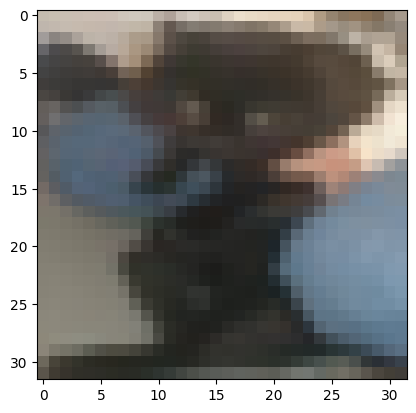

Prediction:  2    Class:  bird


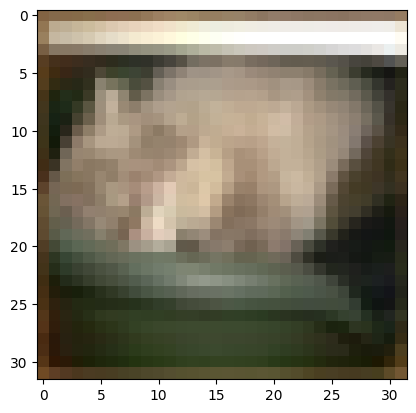

Prediction:  3    Class:  cat


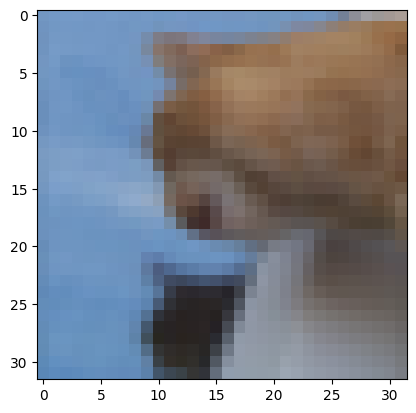

Prediction:  3    Class:  cat


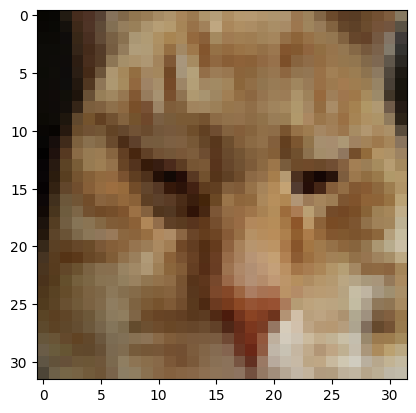

Prediction:  9    Class:  truck


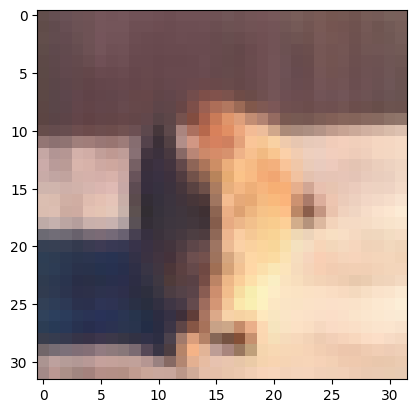

Prediction:  3    Class:  cat


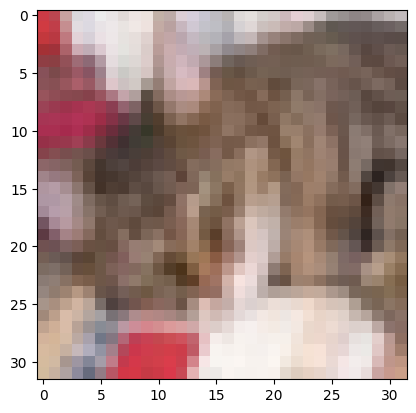

Prediction:  5    Class:  dog


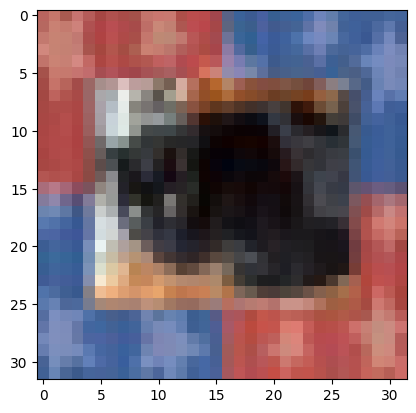

Prediction:  2    Class:  bird


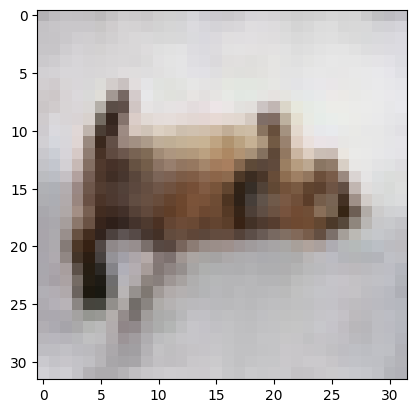

Prediction:  0    Class:  airplane


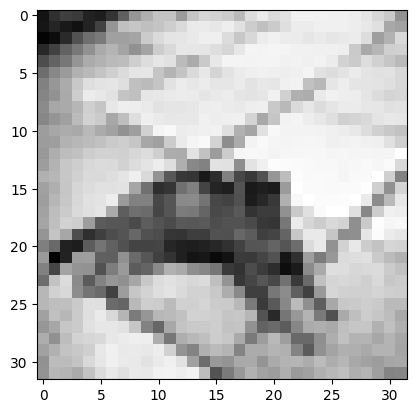

Prediction:  6    Class:  frog


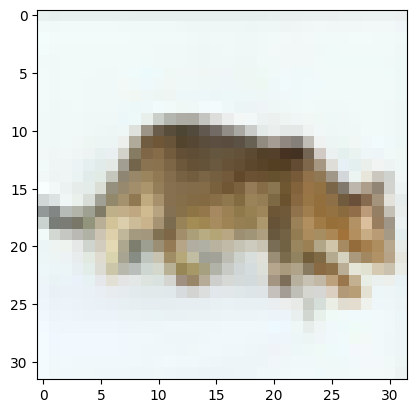

Prediction:  2    Class:  bird


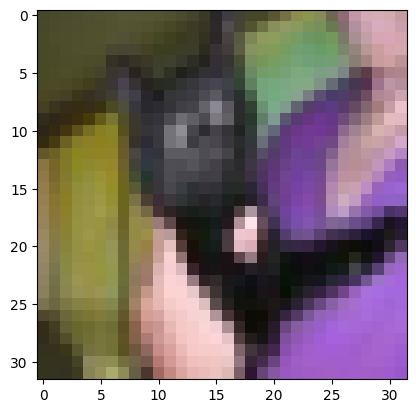

Prediction:  5    Class:  dog


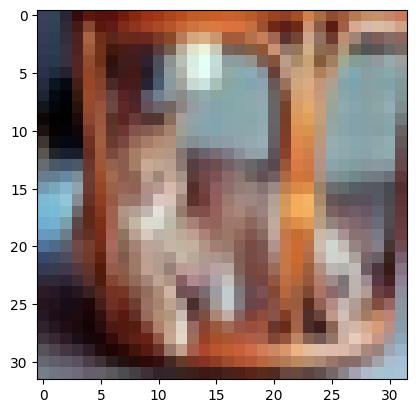

Prediction:  6    Class:  frog


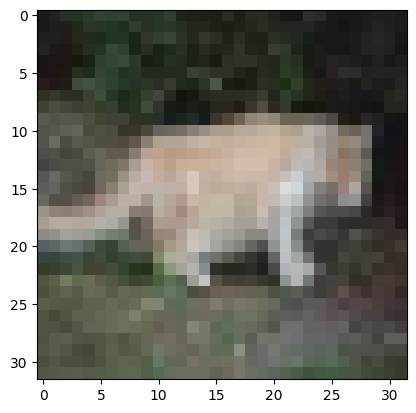

Prediction:  3    Class:  cat


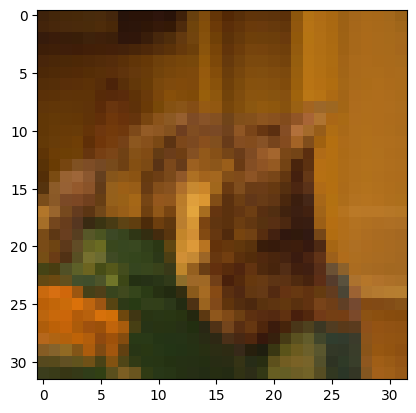

Prediction:  1    Class:  automobile


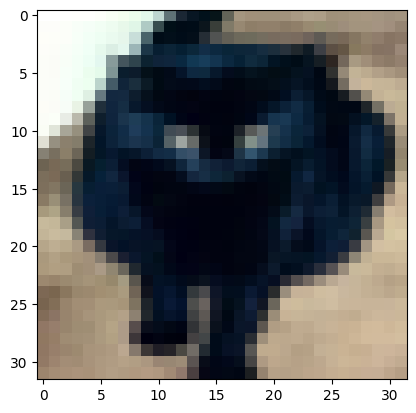

Prediction:  3    Class:  cat


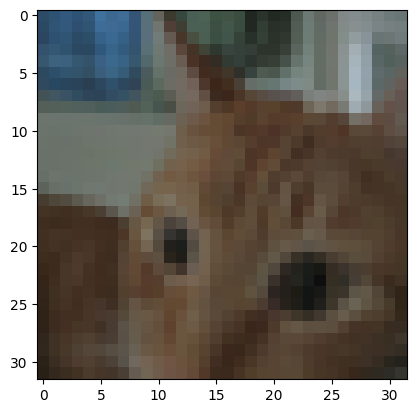

Prediction:  5    Class:  dog


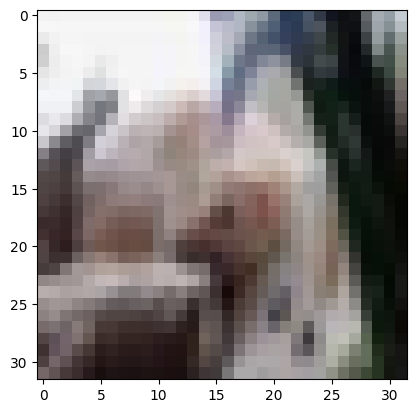

Prediction:  9    Class:  truck


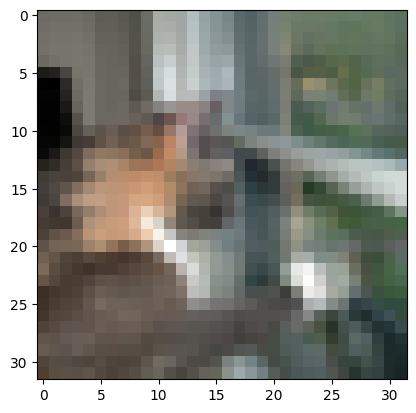

Prediction:  7    Class:  horse


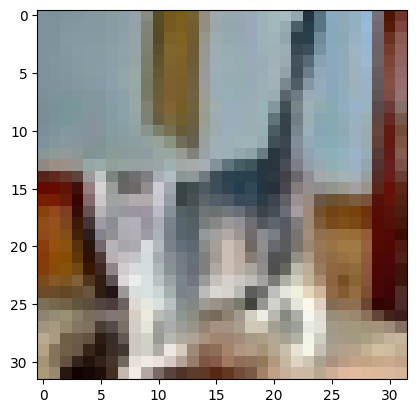

Prediction:  3    Class:  cat


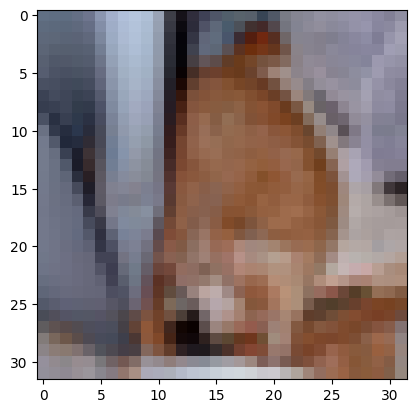

Prediction:  3    Class:  cat


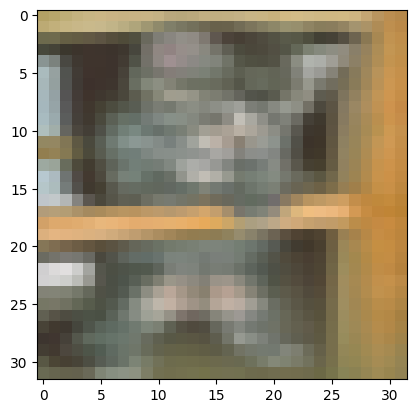

Prediction:  3    Class:  cat


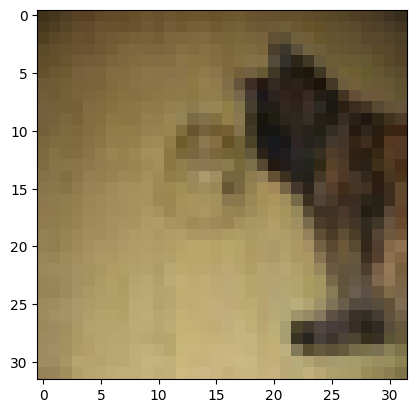

Prediction:  3    Class:  cat


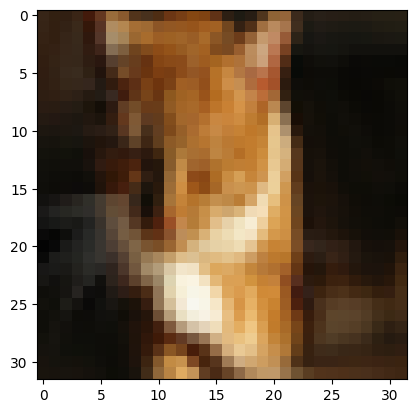

Prediction:  3    Class:  cat


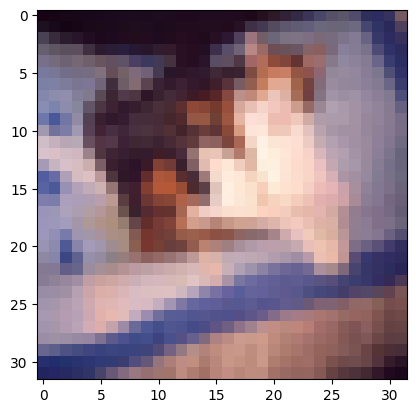

Prediction:  3    Class:  cat


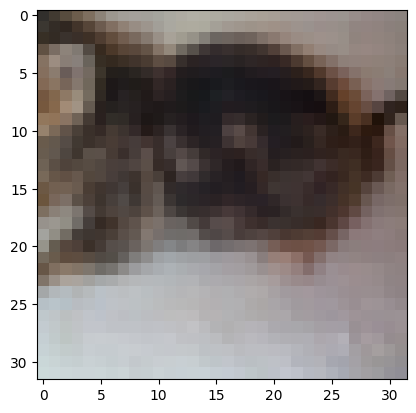

Prediction:  5    Class:  dog


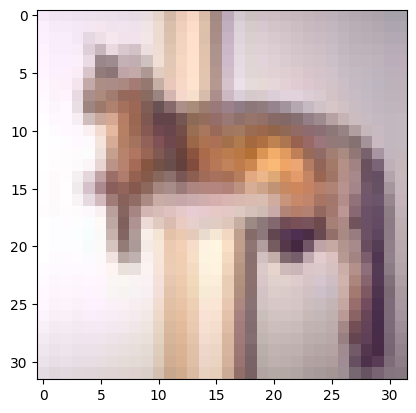

Prediction:  3    Class:  cat


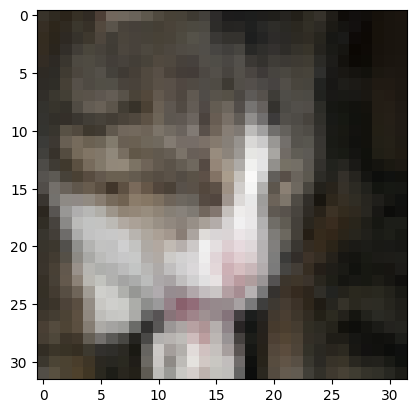

Prediction:  3    Class:  cat


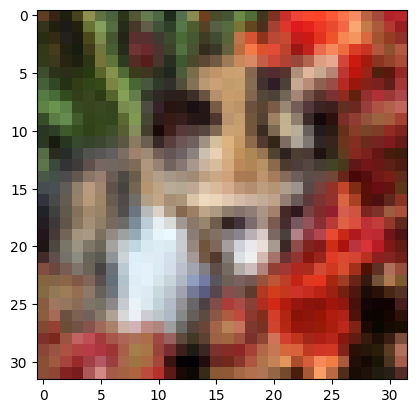

Prediction:  3    Class:  cat


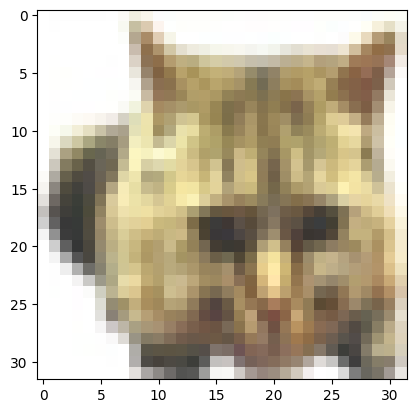

Prediction:  3    Class:  cat


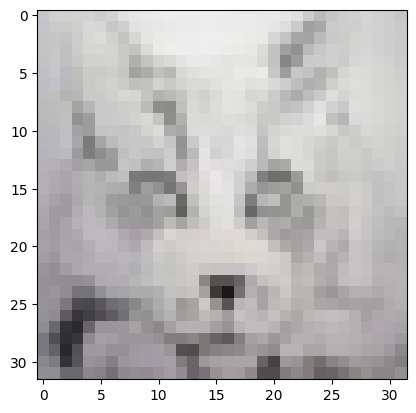

Prediction:  3    Class:  cat


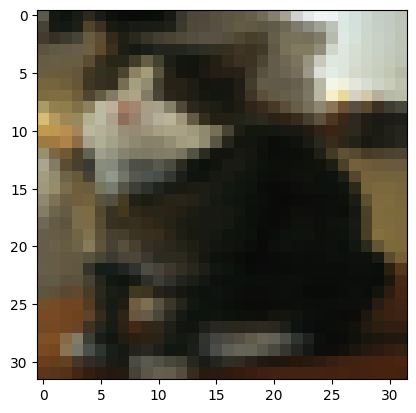

Prediction:  5    Class:  dog


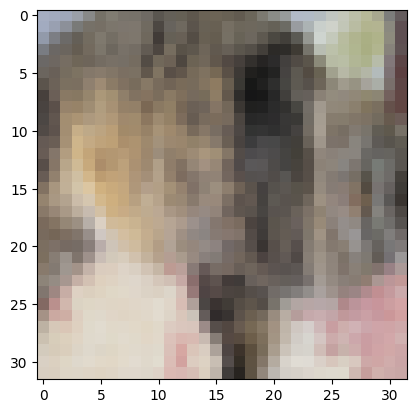

Prediction:  3    Class:  cat


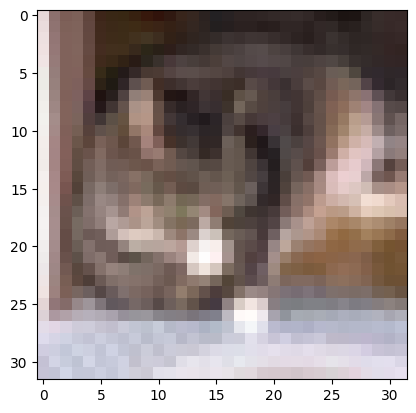

Prediction:  6    Class:  frog


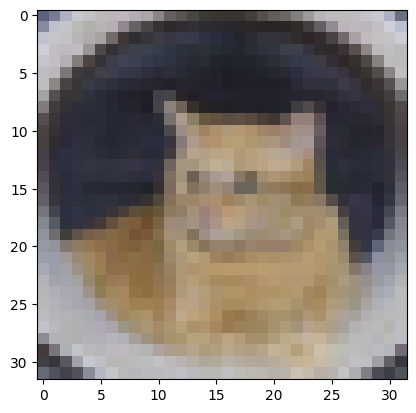

Prediction:  5    Class:  dog


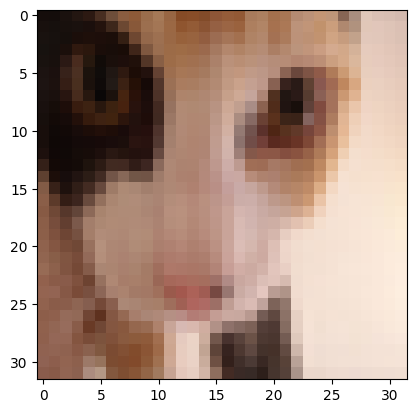

Prediction:  1    Class:  automobile


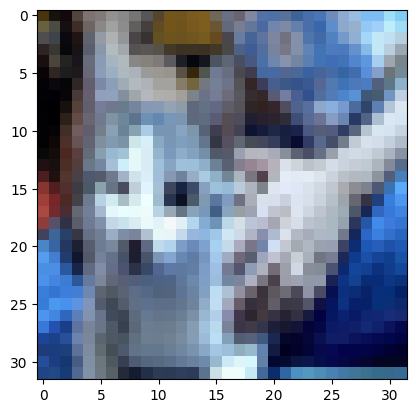

Prediction:  3    Class:  cat


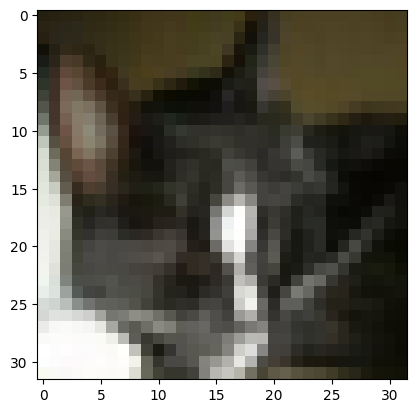

Prediction:  4    Class:  deer


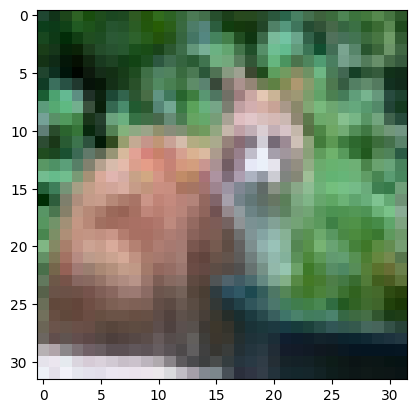

Prediction:  7    Class:  horse


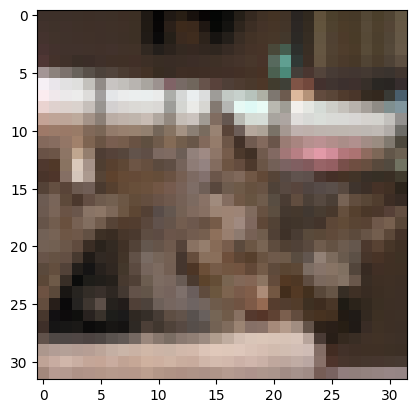

Prediction:  3    Class:  cat


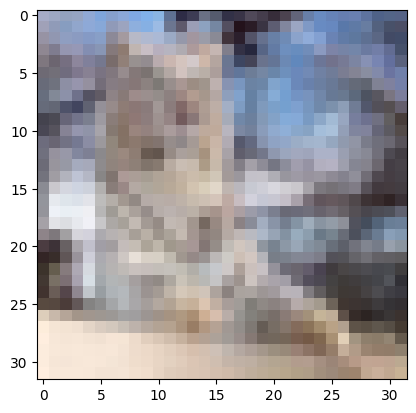

Prediction:  3    Class:  cat


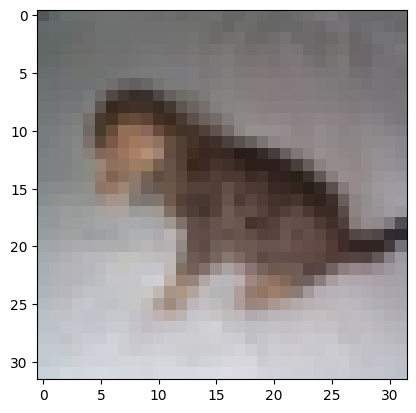

Prediction:  3    Class:  cat


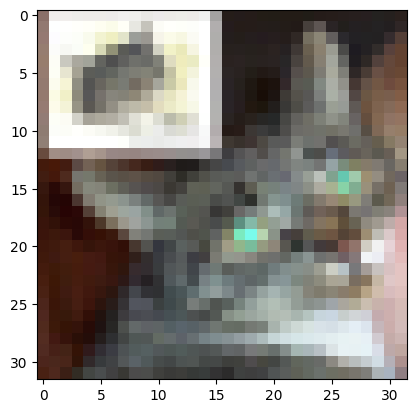

Prediction:  3    Class:  cat


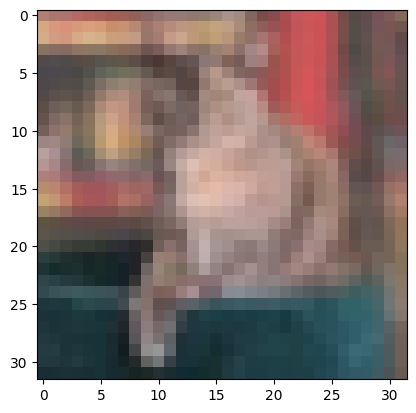

Prediction:  3    Class:  cat


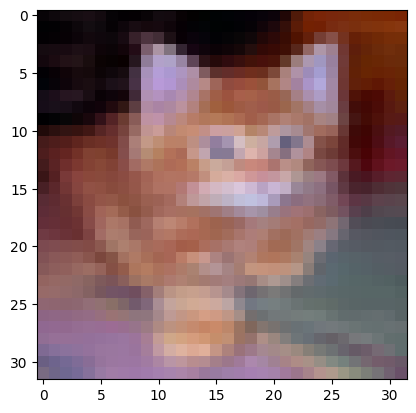

Prediction:  4    Class:  deer


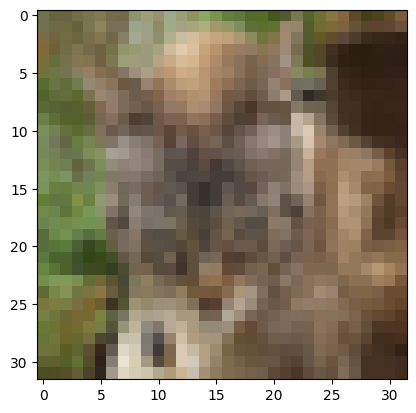

Prediction:  3    Class:  cat


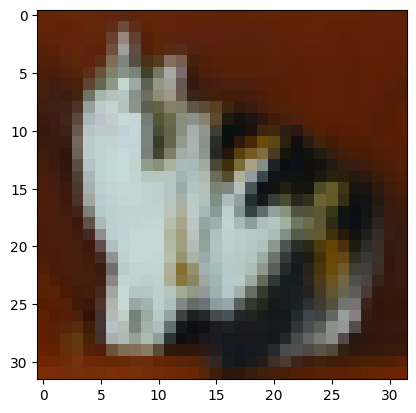

Prediction:  3    Class:  cat


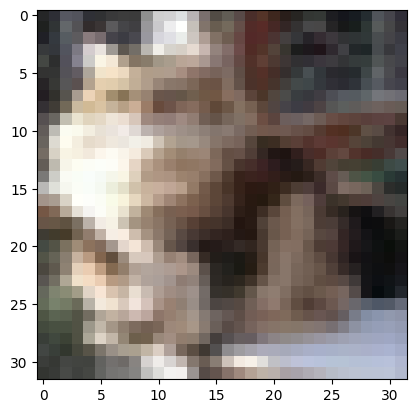

Prediction:  3    Class:  cat


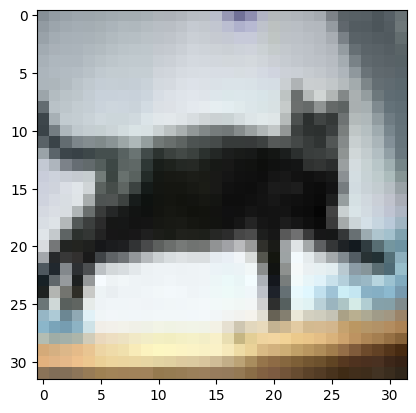

Prediction:  3    Class:  cat


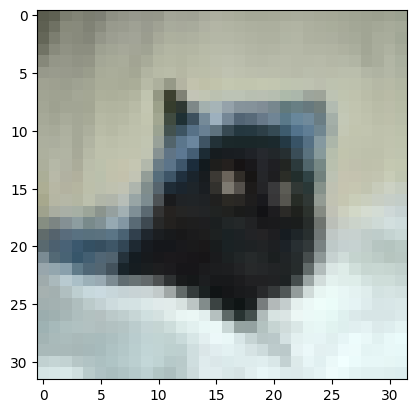

Prediction:  5    Class:  dog


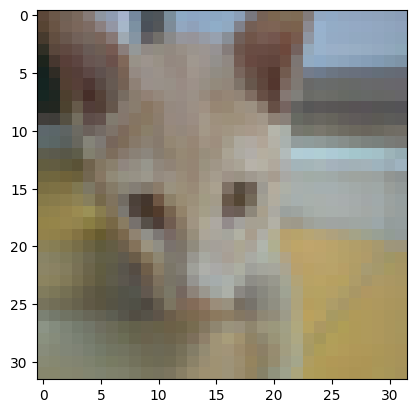

Prediction:  5    Class:  dog


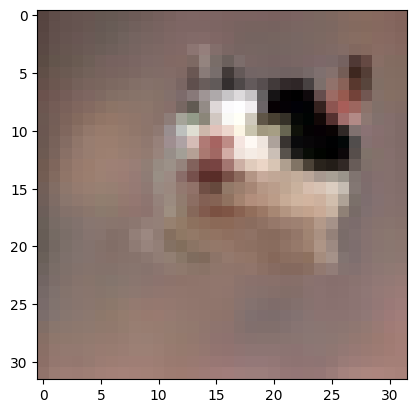

Prediction:  3    Class:  cat


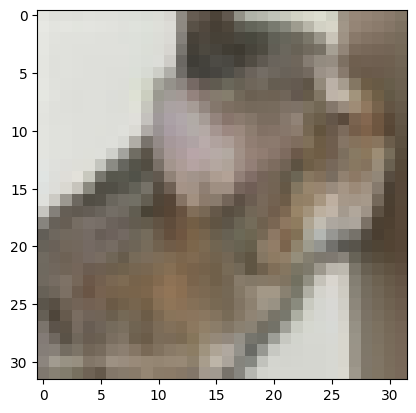

Prediction:  5    Class:  dog


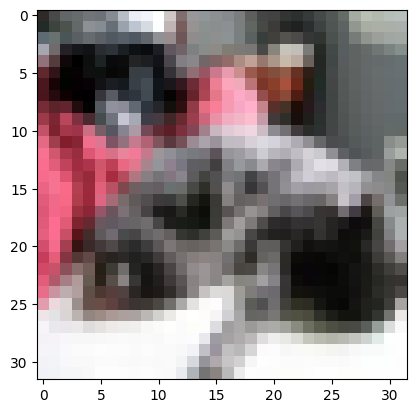

Prediction:  2    Class:  bird


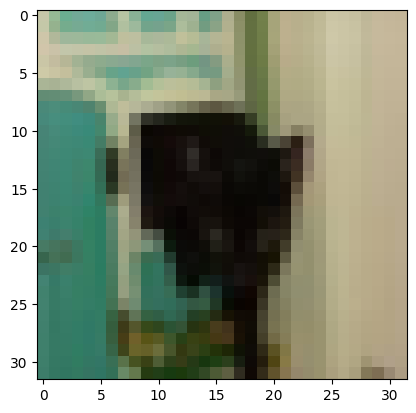

Prediction:  3    Class:  cat


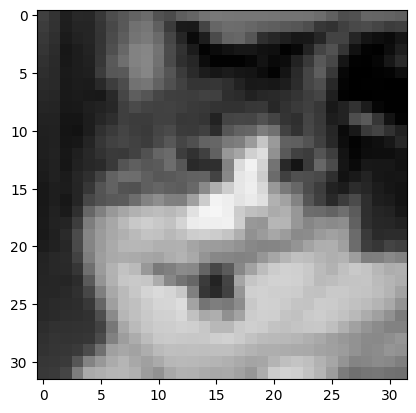

Prediction:  2    Class:  bird


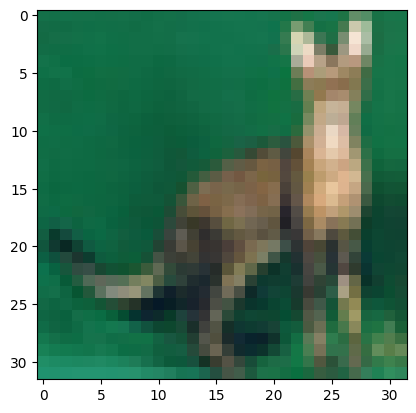

Prediction:  4    Class:  deer


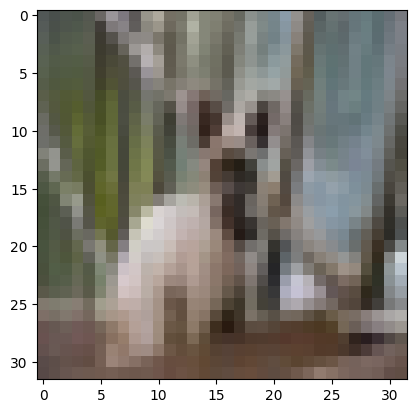

Prediction:  5    Class:  dog


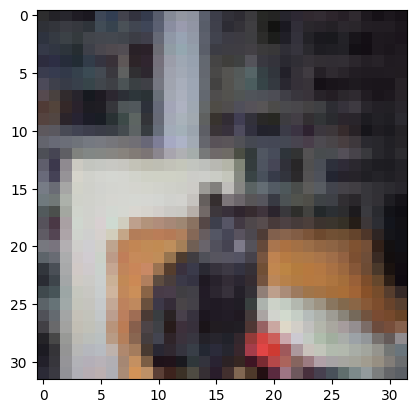

Prediction:  3    Class:  cat


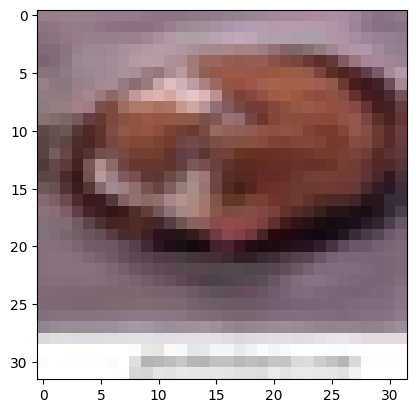

Prediction:  6    Class:  frog


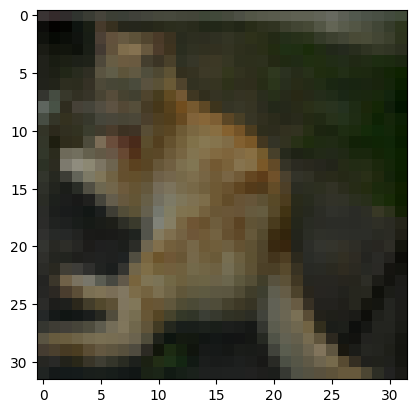

Prediction:  5    Class:  dog


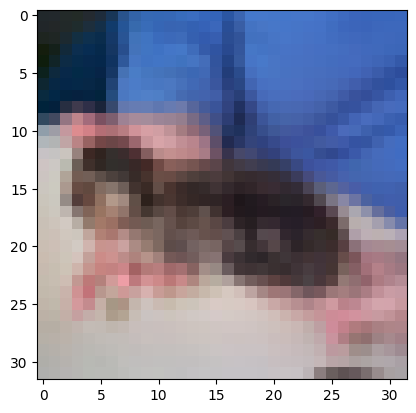

Prediction:  3    Class:  cat


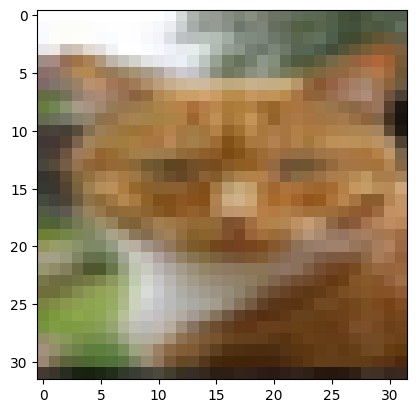

Prediction:  3    Class:  cat


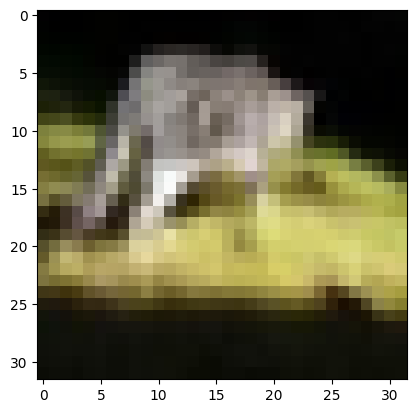

Prediction:  3    Class:  cat


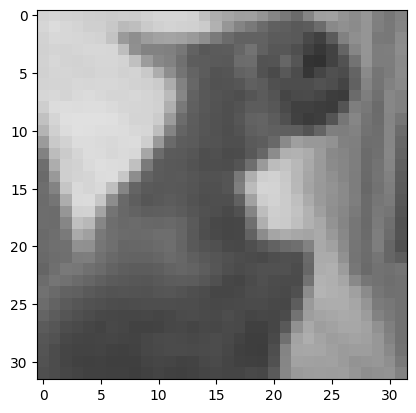

Prediction:  3    Class:  cat


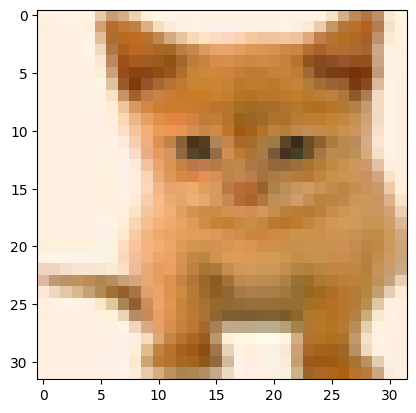

Prediction:  3    Class:  cat


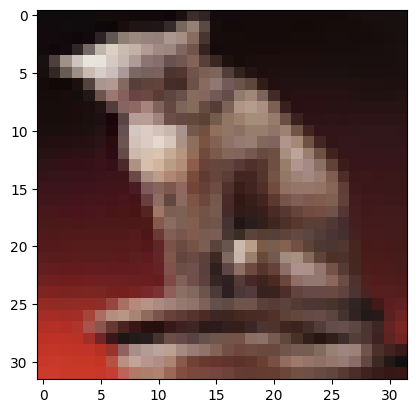

Prediction:  2    Class:  bird


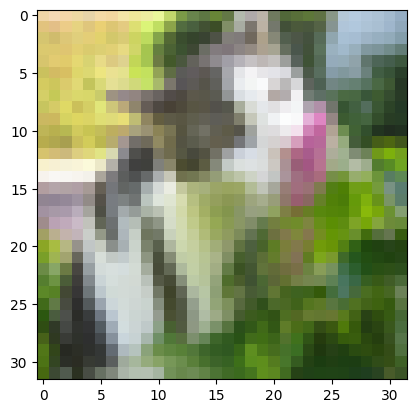

Prediction:  9    Class:  truck


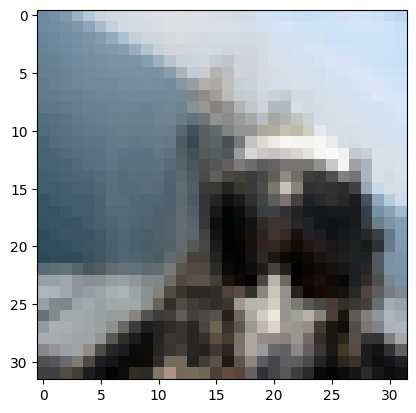

Prediction:  5    Class:  dog


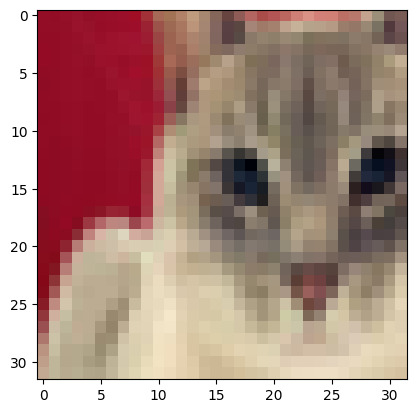

Prediction:  3    Class:  cat


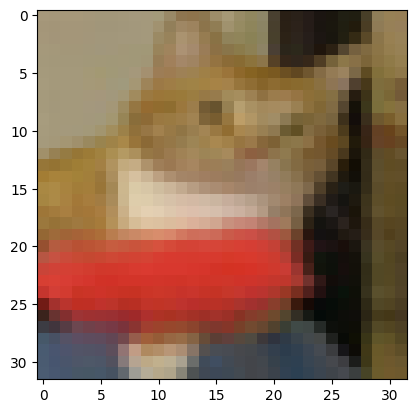

Prediction:  8    Class:  ship


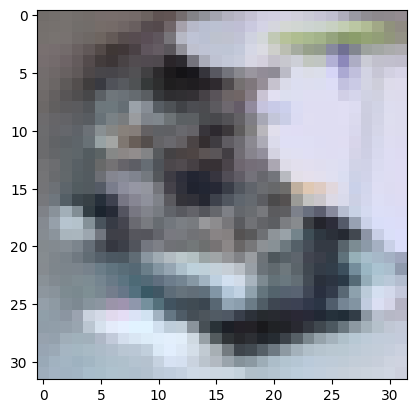

Prediction:  3    Class:  cat


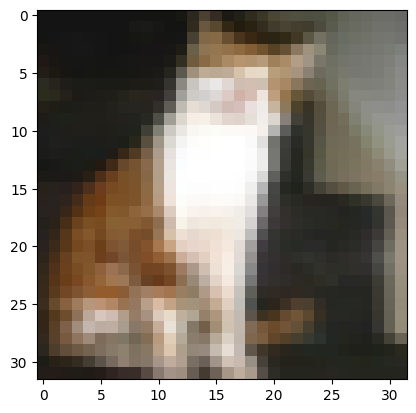

Prediction:  3    Class:  cat


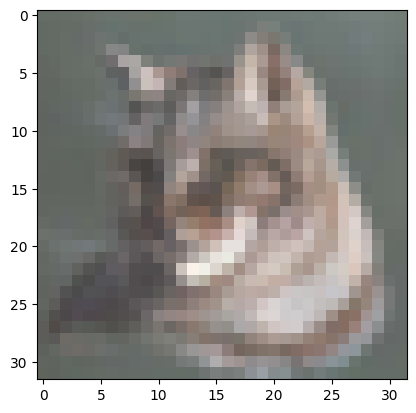

Prediction:  3    Class:  cat


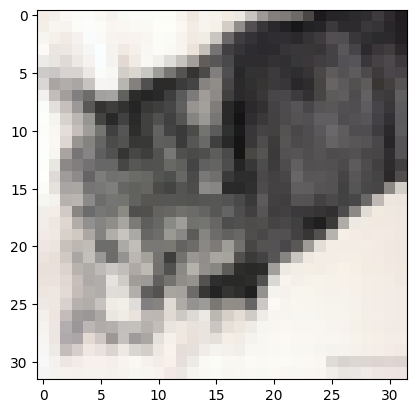

Prediction:  3    Class:  cat


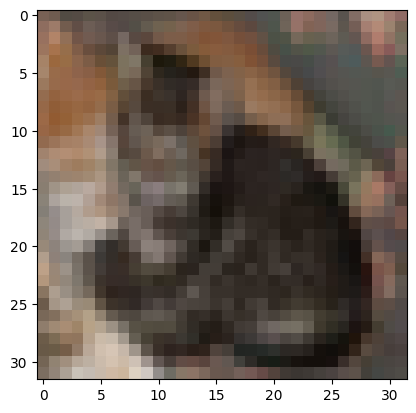

Prediction:  2    Class:  bird


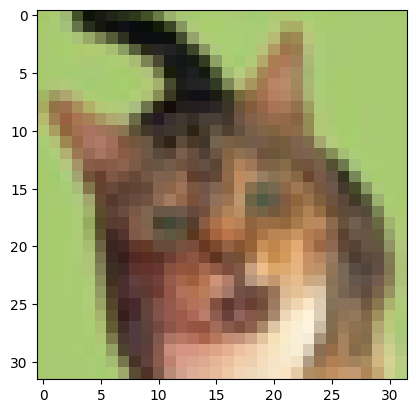

Prediction:  3    Class:  cat


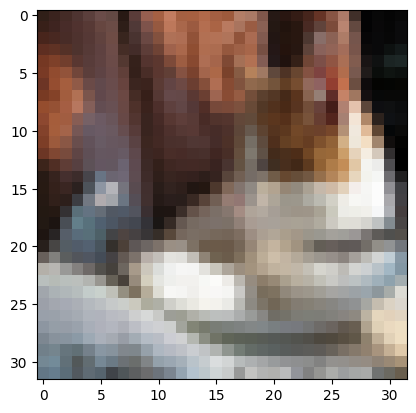

Prediction:  3    Class:  cat


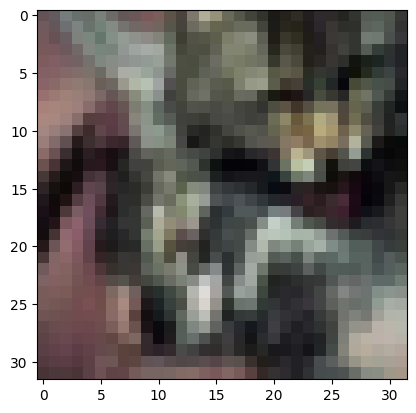

Prediction:  2    Class:  bird


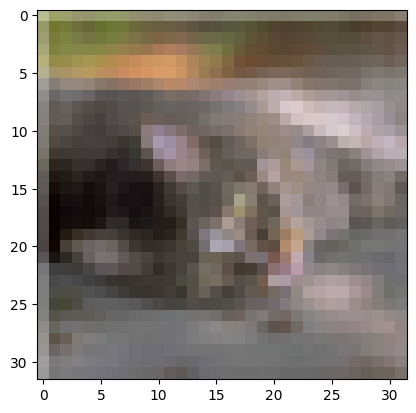

Prediction:  3    Class:  cat


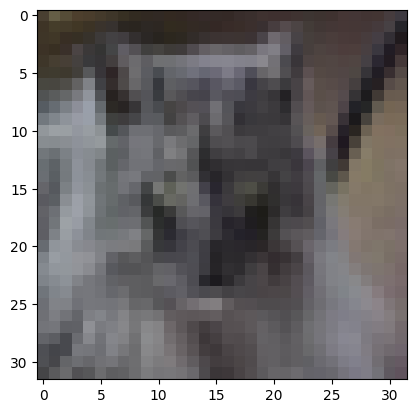

Prediction:  3    Class:  cat


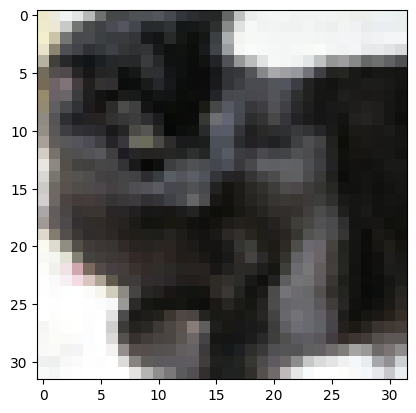

Prediction:  9    Class:  truck


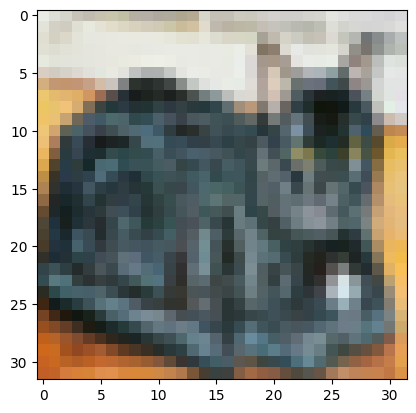

Prediction:  3    Class:  cat


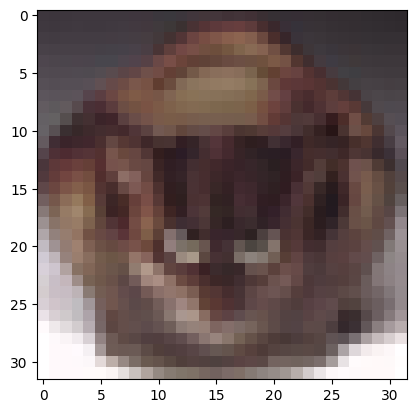

Prediction:  3    Class:  cat


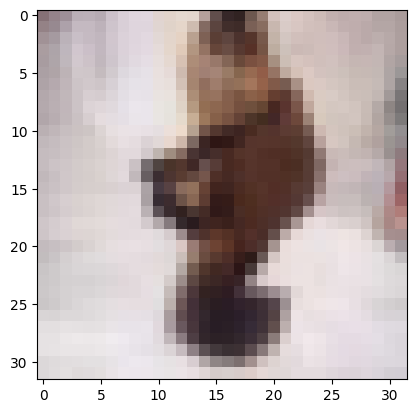

Prediction:  5    Class:  dog


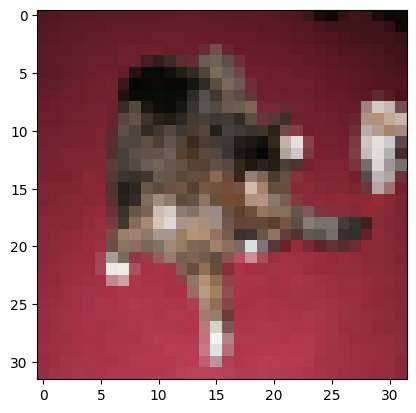

Prediction:  3    Class:  cat


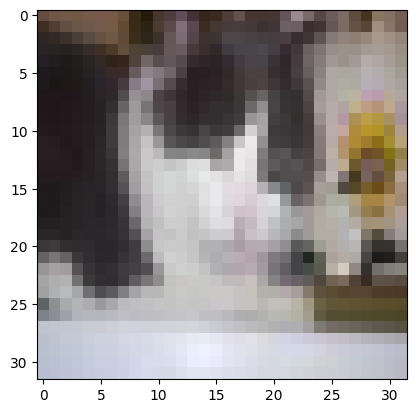

Prediction:  1    Class:  automobile


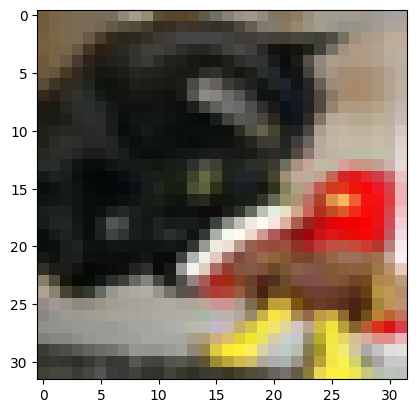

Prediction:  3    Class:  cat


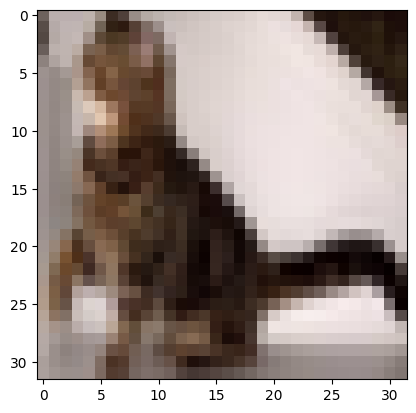

Prediction:  3    Class:  cat


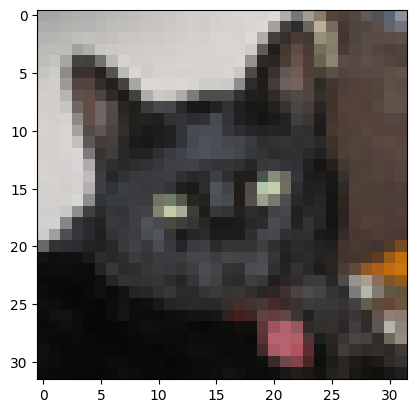

Prediction:  3    Class:  cat


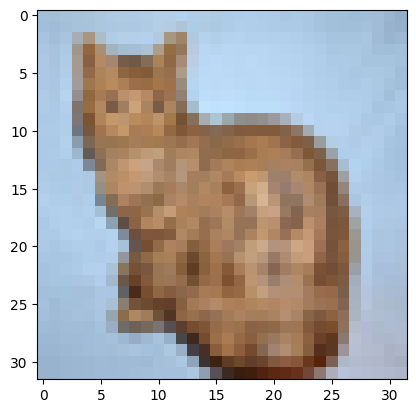

Prediction:  8    Class:  ship


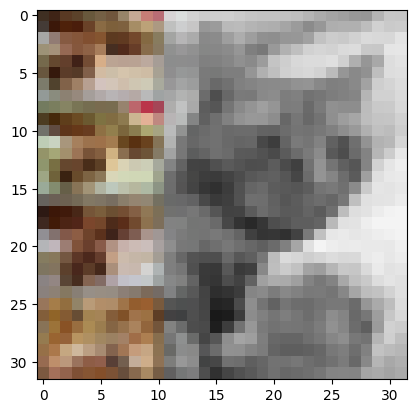

Prediction:  3    Class:  cat


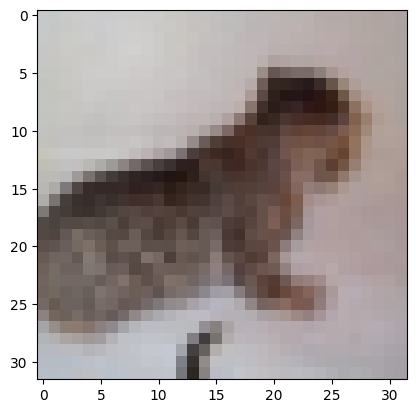

Prediction:  9    Class:  truck


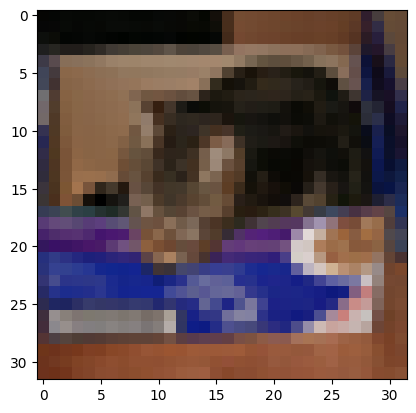

Prediction:  8    Class:  ship


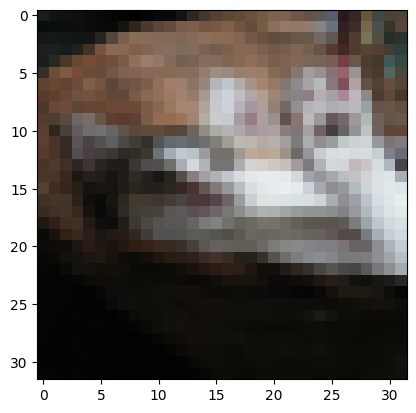

Prediction:  3    Class:  cat


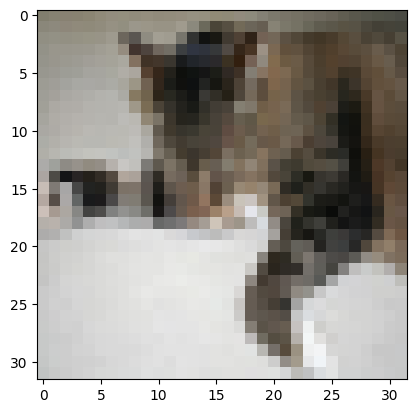

Prediction:  7    Class:  horse


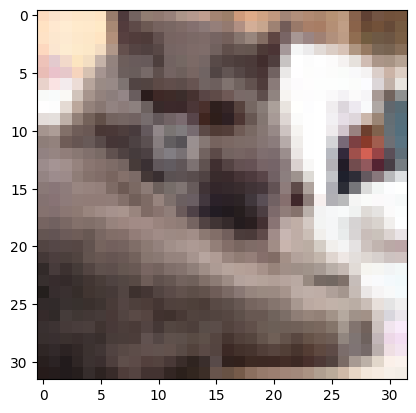

Prediction:  0    Class:  airplane


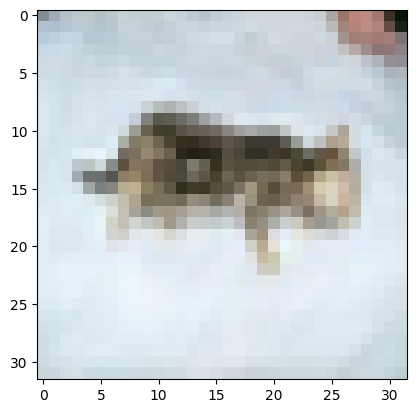

Prediction:  3    Class:  cat


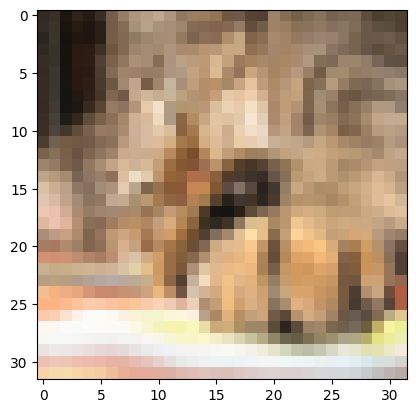

Prediction:  3    Class:  cat


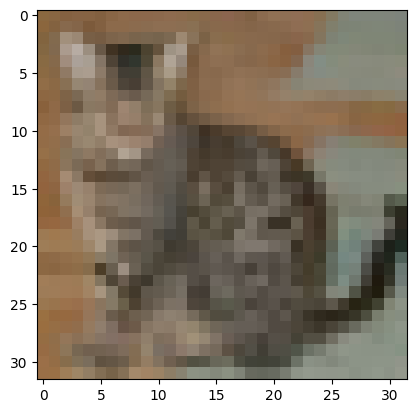

Prediction:  2    Class:  bird


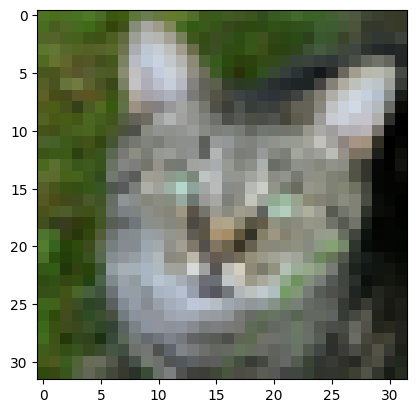

Prediction:  3    Class:  cat


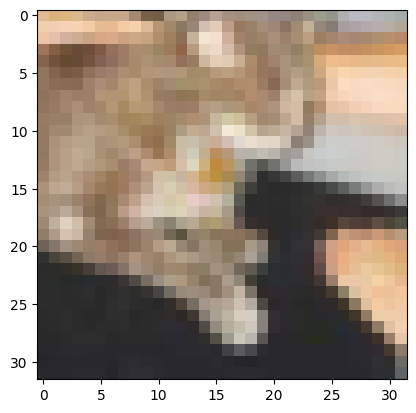

Prediction:  5    Class:  dog


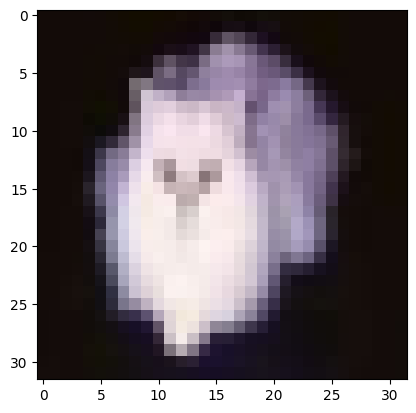

Prediction:  3    Class:  cat


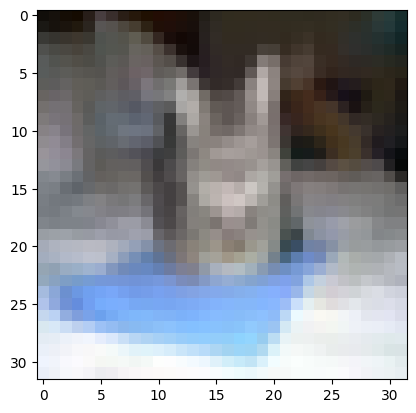

Prediction:  9    Class:  truck


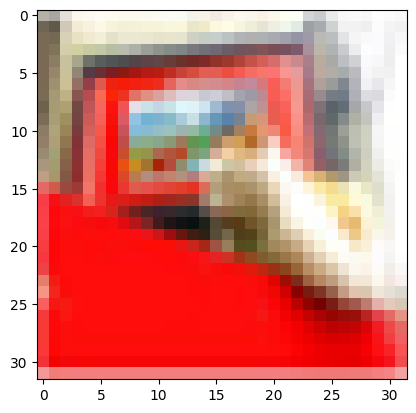

Prediction:  3    Class:  cat


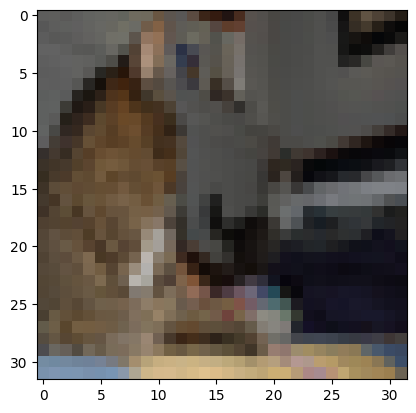

Prediction:  3    Class:  cat


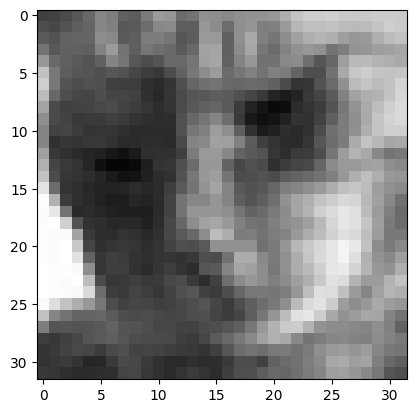

Prediction:  6    Class:  frog


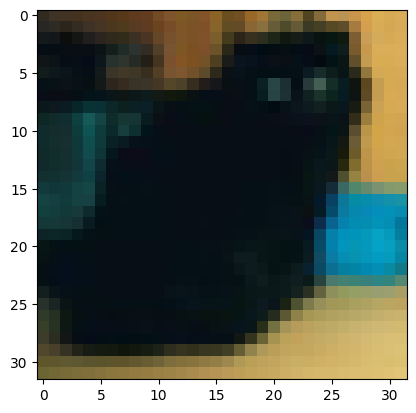

Prediction:  5    Class:  dog


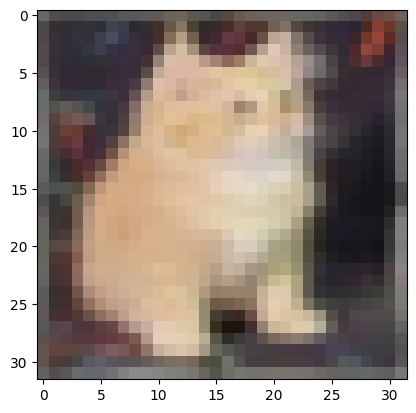

Prediction:  3    Class:  cat


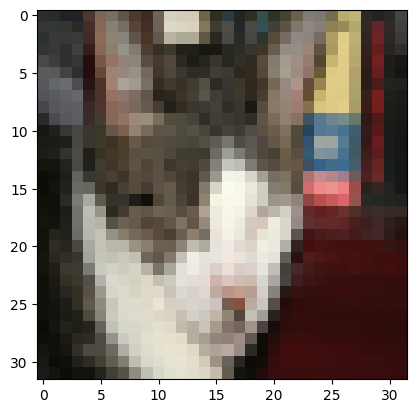

Prediction:  6    Class:  frog


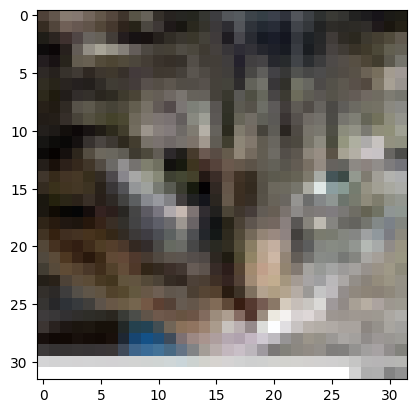

Prediction:  2    Class:  bird


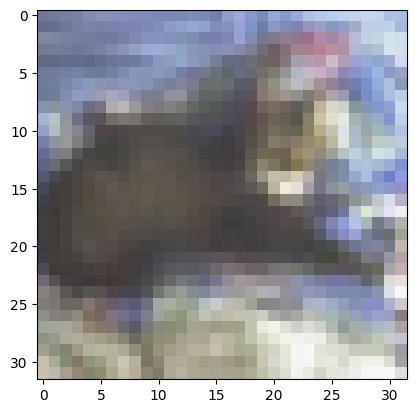

Prediction:  3    Class:  cat


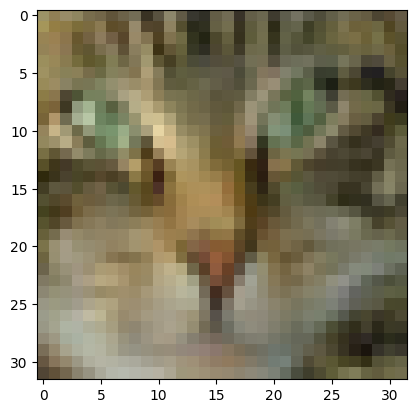

Prediction:  6    Class:  frog


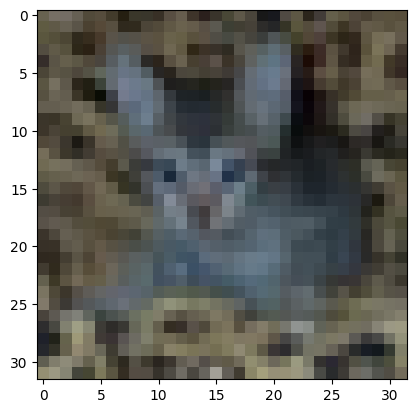

Prediction:  3    Class:  cat


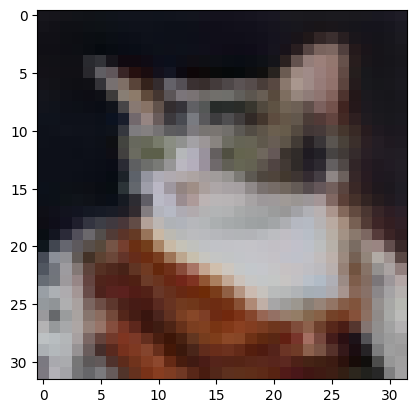

Prediction:  3    Class:  cat


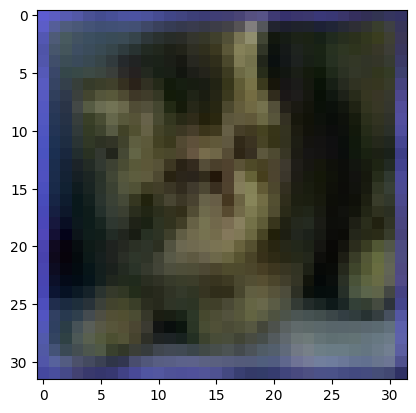

Prediction:  3    Class:  cat


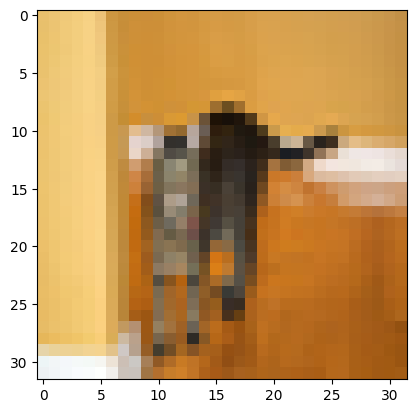

Prediction:  3    Class:  cat


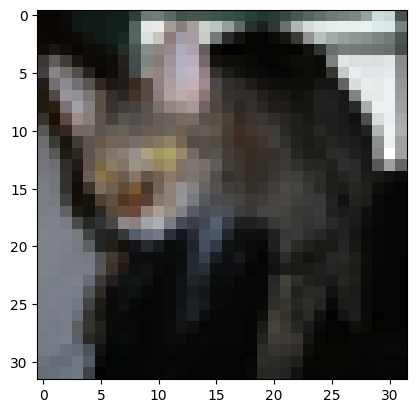

Prediction:  2    Class:  bird


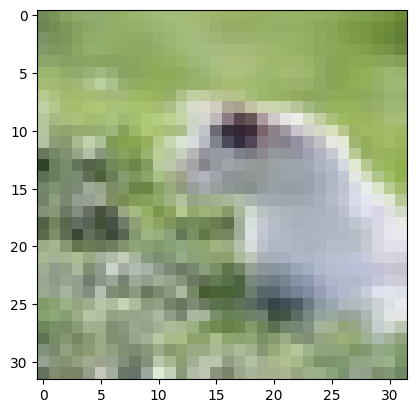

Prediction:  5    Class:  dog


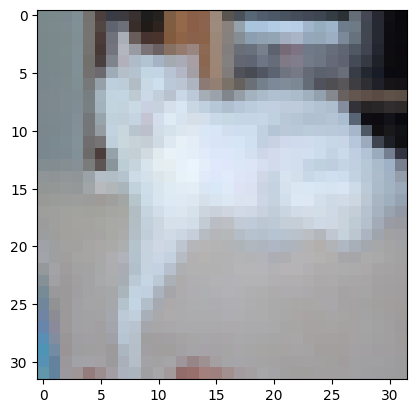

Prediction:  3    Class:  cat


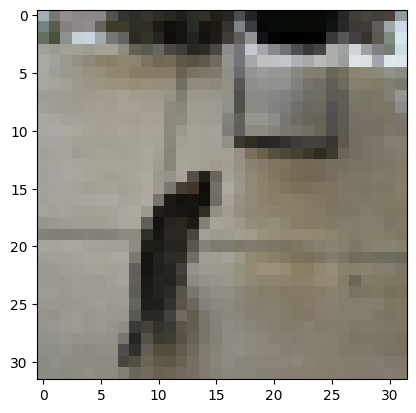

Prediction:  3    Class:  cat


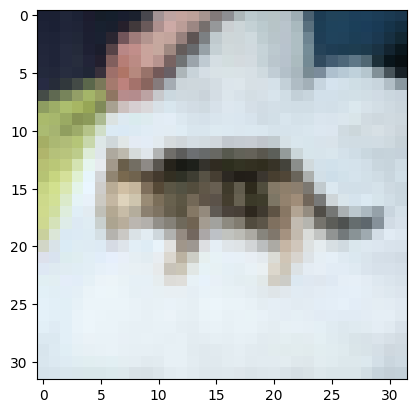

Prediction:  3    Class:  cat


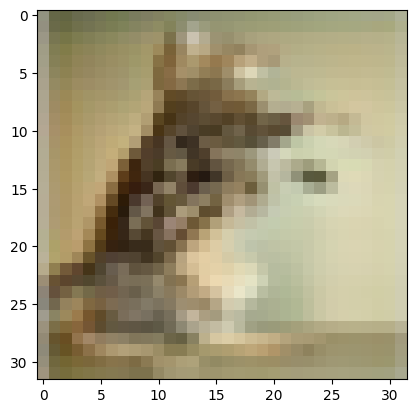

Prediction:  3    Class:  cat


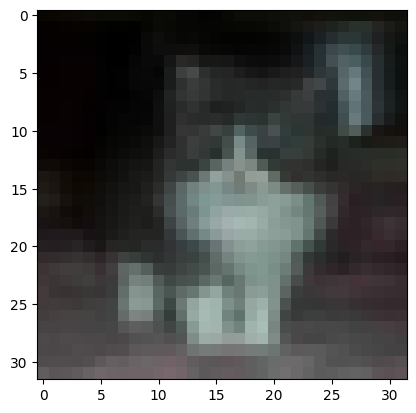

Prediction:  4    Class:  deer


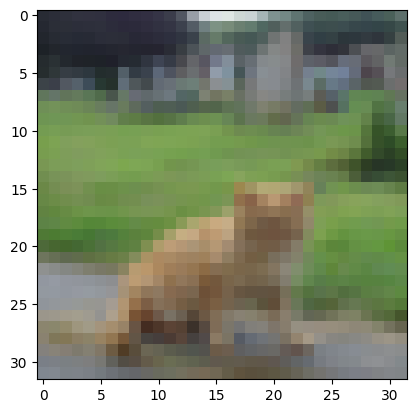

Prediction:  6    Class:  frog


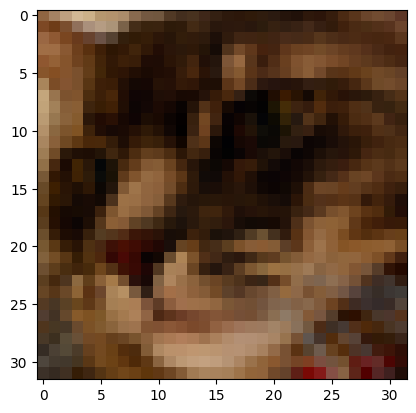

Prediction:  3    Class:  cat


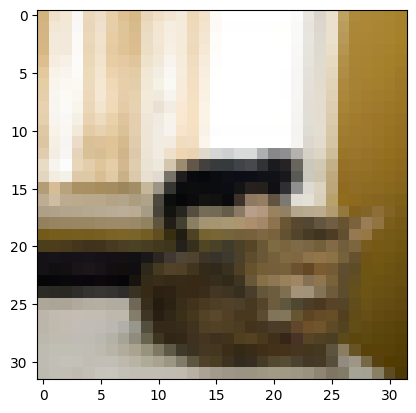

Prediction:  9    Class:  truck


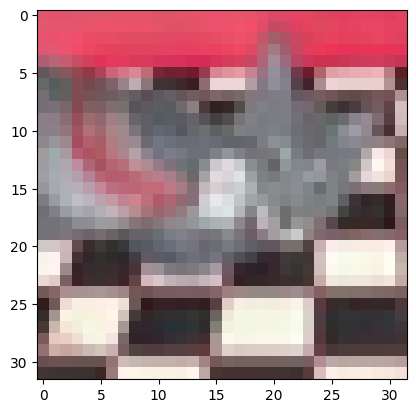

Prediction:  3    Class:  cat


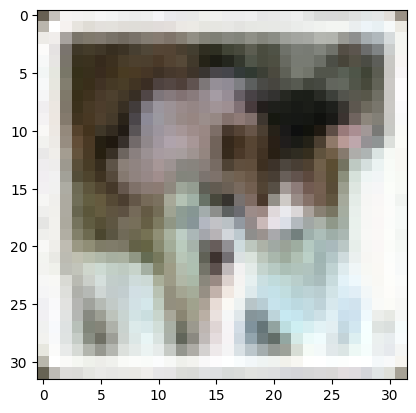

Prediction:  5    Class:  dog


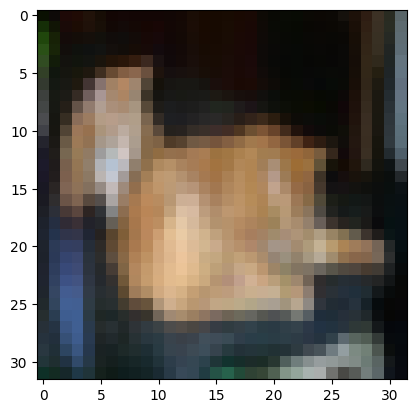

Prediction:  6    Class:  frog


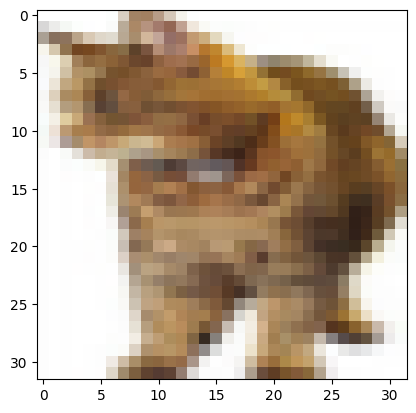

Prediction:  4    Class:  deer


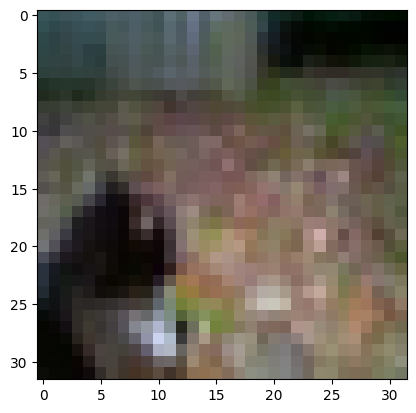

Prediction:  3    Class:  cat


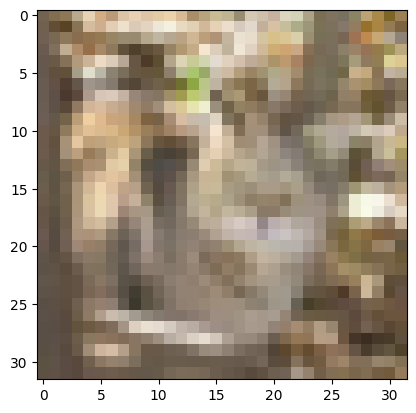

Prediction:  2    Class:  bird


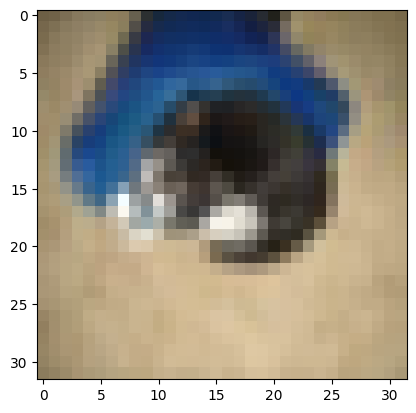

Prediction:  7    Class:  horse


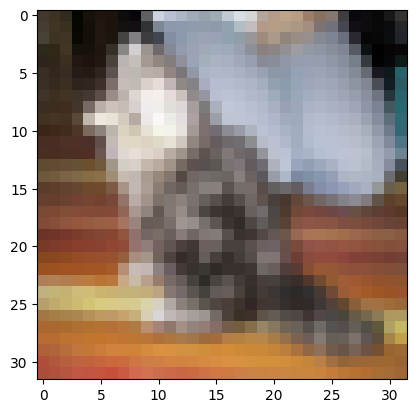

Prediction:  9    Class:  truck


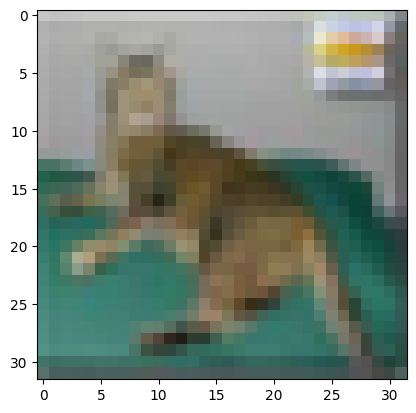

Prediction:  1    Class:  automobile


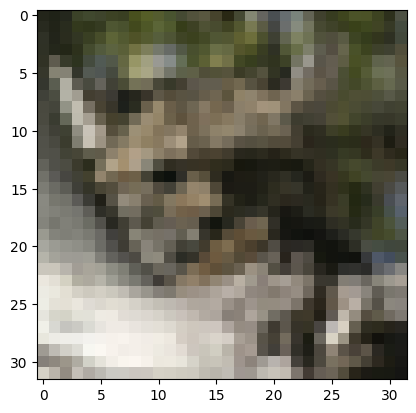

Prediction:  3    Class:  cat


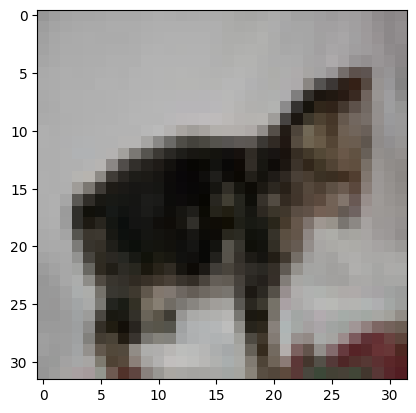

Prediction:  3    Class:  cat


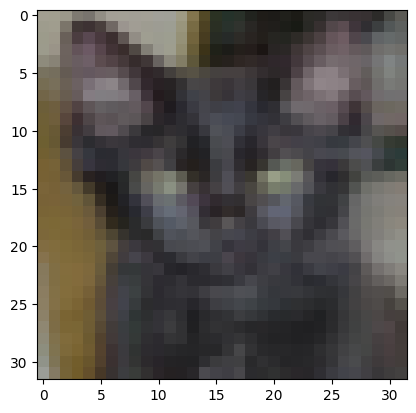

Prediction:  3    Class:  cat


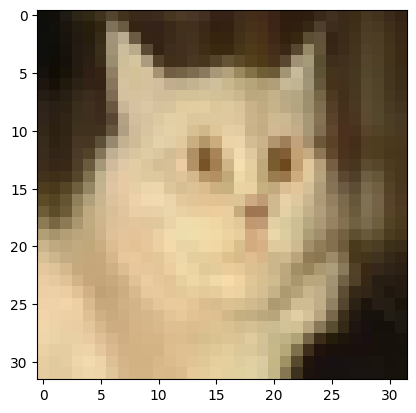

Prediction:  6    Class:  frog


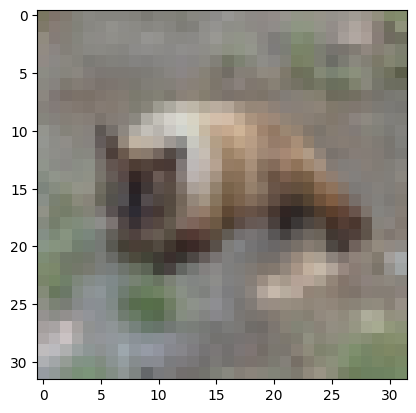

Prediction:  5    Class:  dog


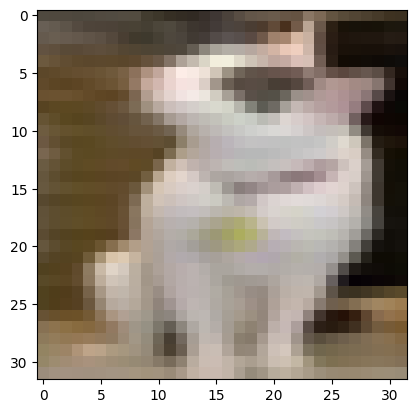

Prediction:  7    Class:  horse


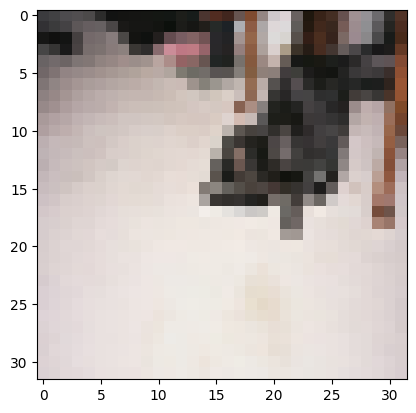

Prediction:  7    Class:  horse


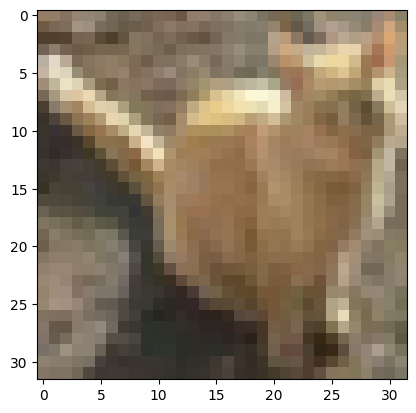

Prediction:  3    Class:  cat


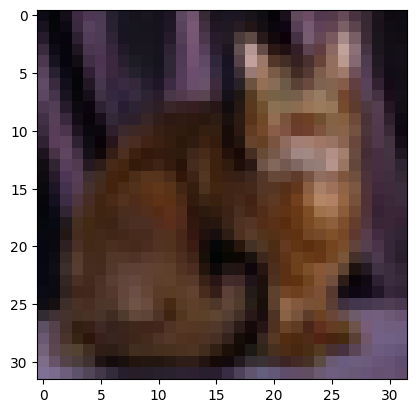

Prediction:  4    Class:  deer


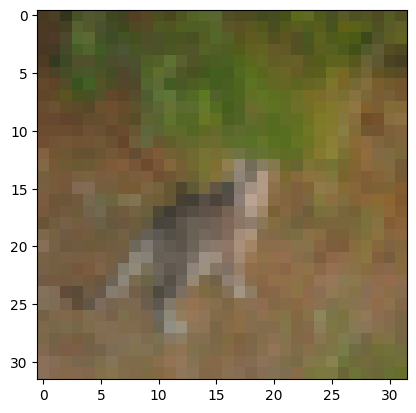

Prediction:  3    Class:  cat


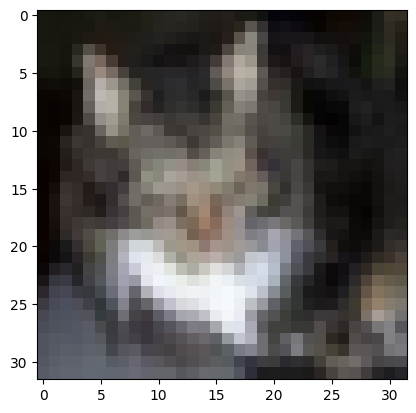

Prediction:  2    Class:  bird


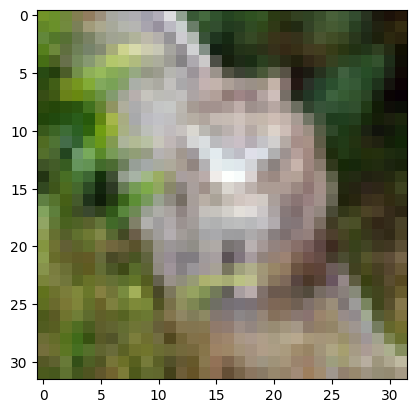

Prediction:  1    Class:  automobile


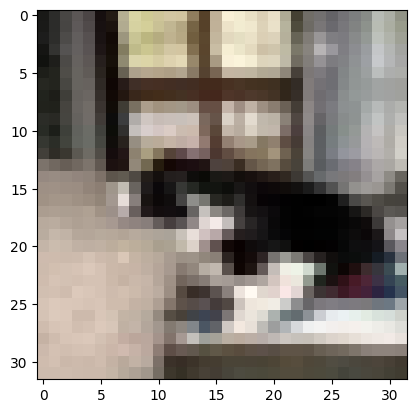

Prediction:  8    Class:  ship


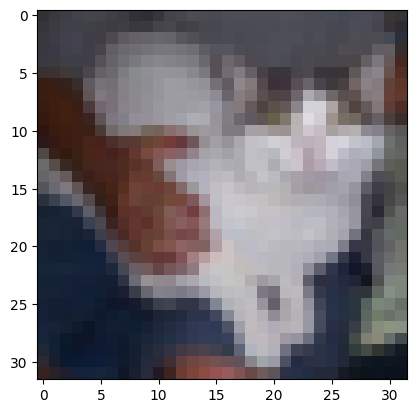

Prediction:  5    Class:  dog


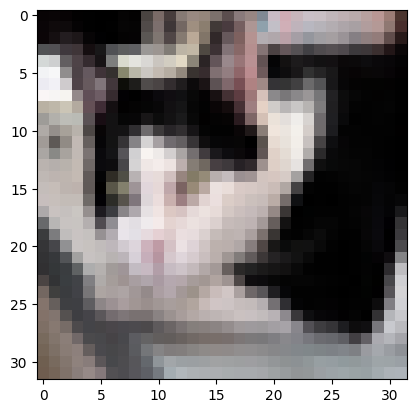

Prediction:  3    Class:  cat


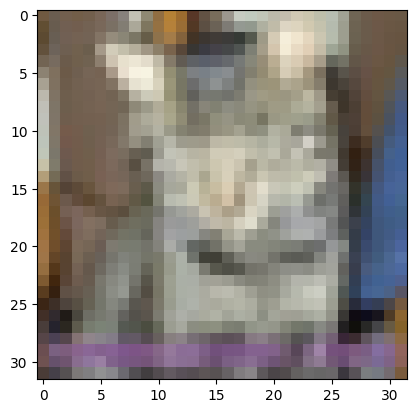

Prediction:  3    Class:  cat


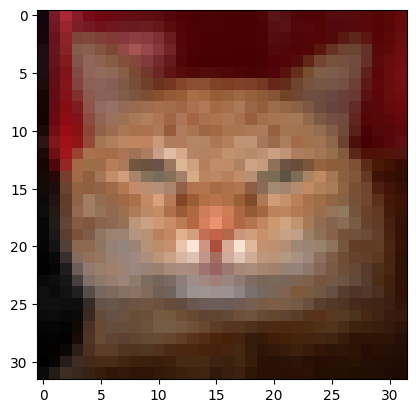

Prediction:  5    Class:  dog


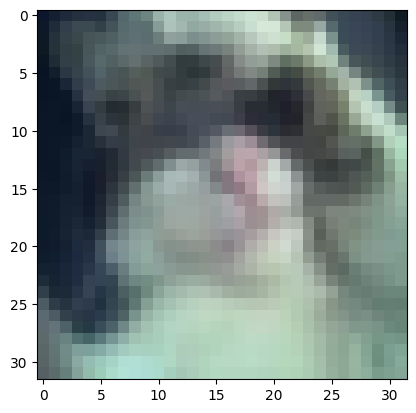

Prediction:  3    Class:  cat


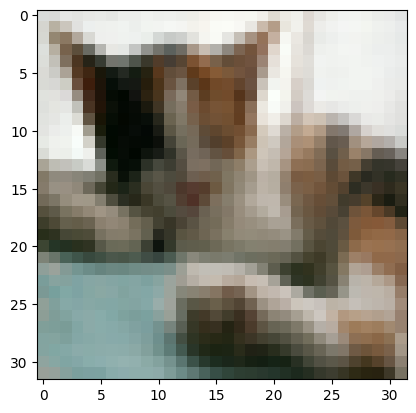

Prediction:  2    Class:  bird


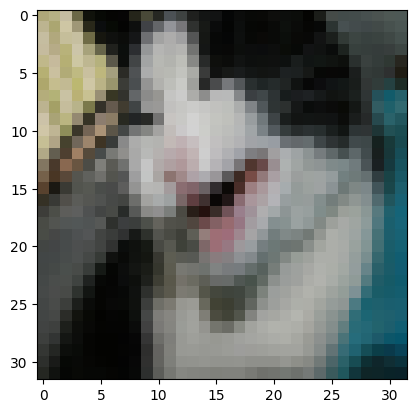

Prediction:  3    Class:  cat


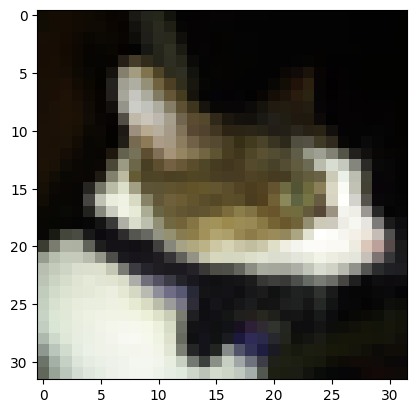

Prediction:  3    Class:  cat


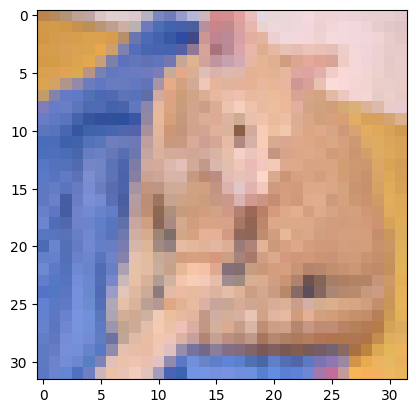

Prediction:  3    Class:  cat


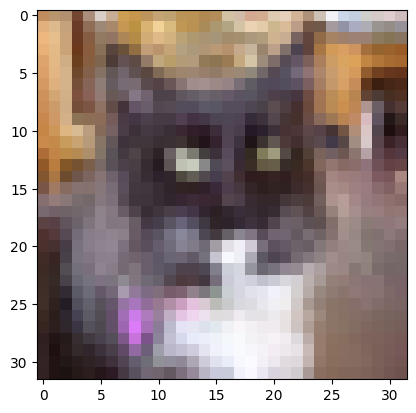

Prediction:  5    Class:  dog


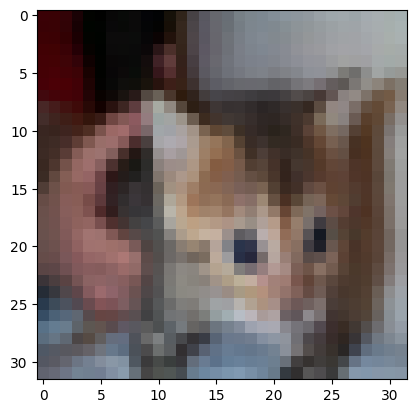

Prediction:  5    Class:  dog


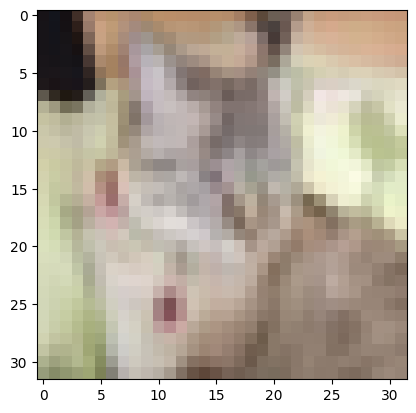

Prediction:  3    Class:  cat


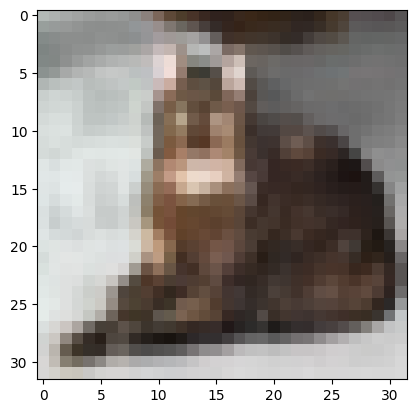

Prediction:  3    Class:  cat


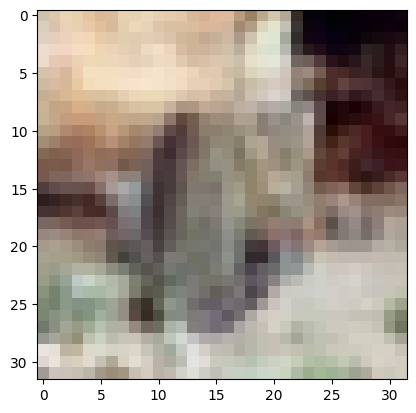

Prediction:  6    Class:  frog


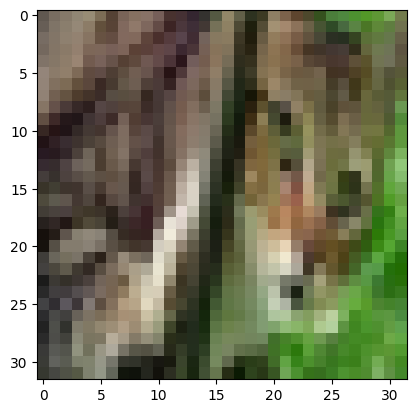

Prediction:  6    Class:  frog


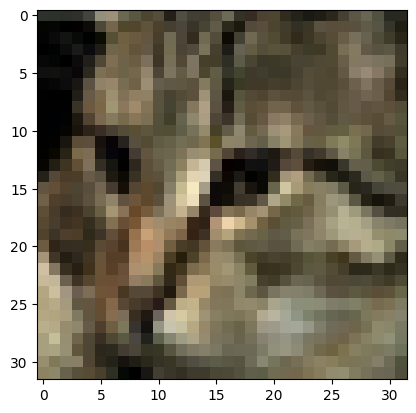

Prediction:  3    Class:  cat


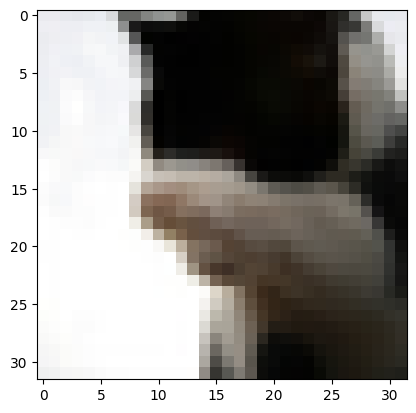

Prediction:  1    Class:  automobile


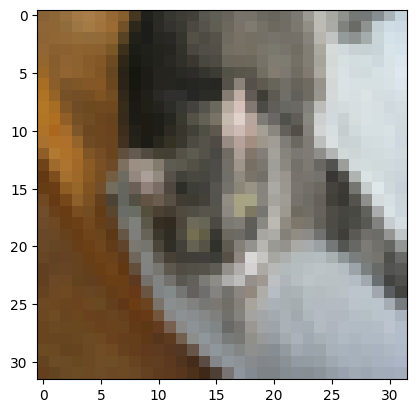

Prediction:  7    Class:  horse


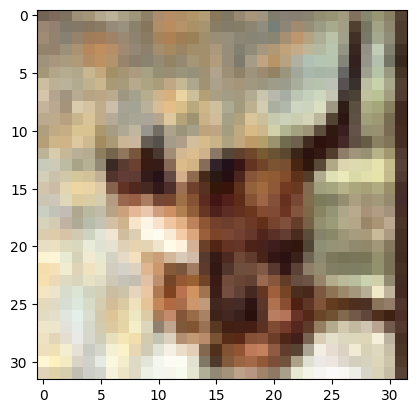

Prediction:  3    Class:  cat


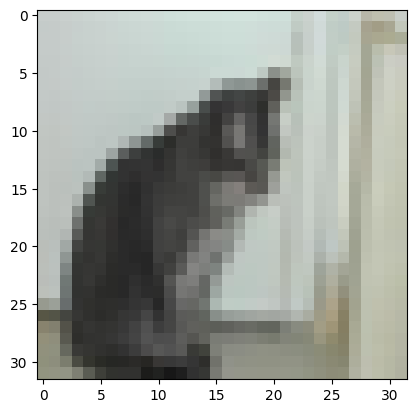

Prediction:  3    Class:  cat


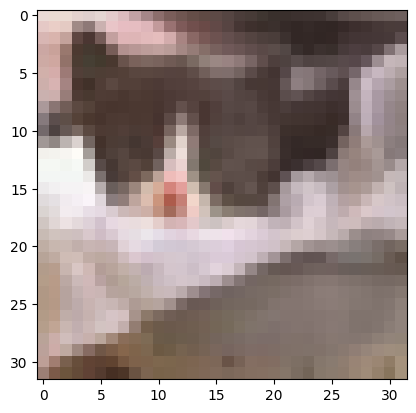

Prediction:  3    Class:  cat


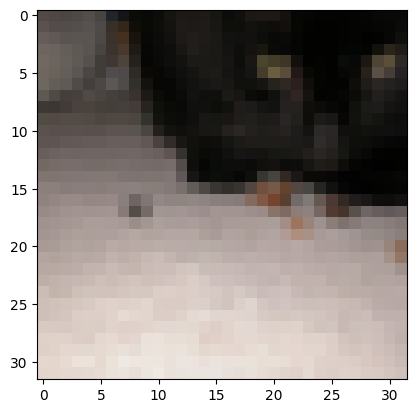

Prediction:  3    Class:  cat


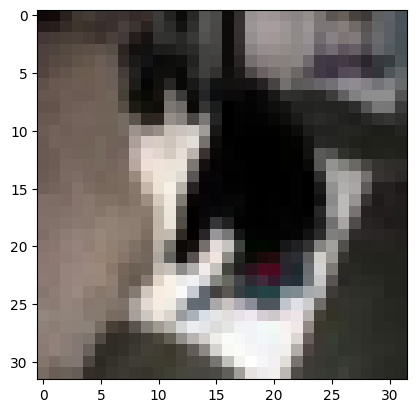

Prediction:  2    Class:  bird


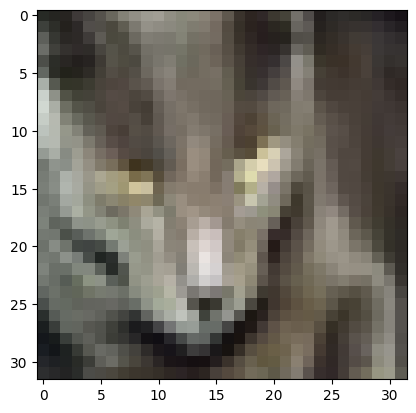

Prediction:  6    Class:  frog


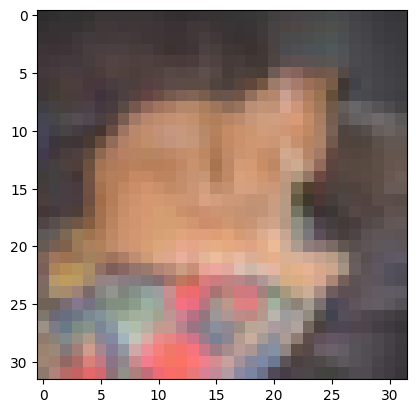

Prediction:  2    Class:  bird


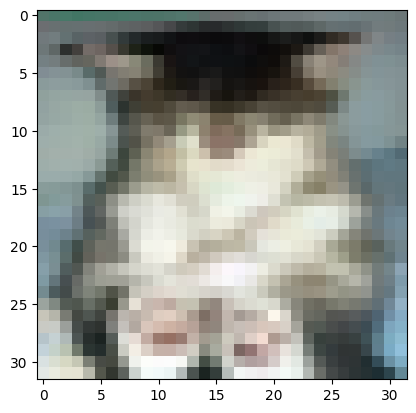

Prediction:  3    Class:  cat


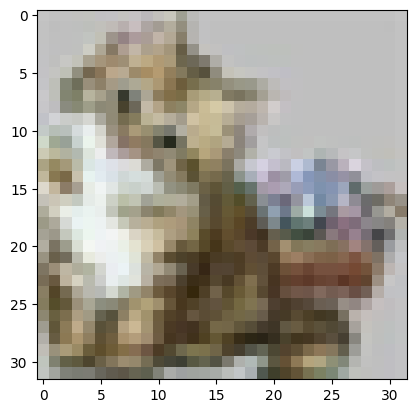

Prediction:  3    Class:  cat


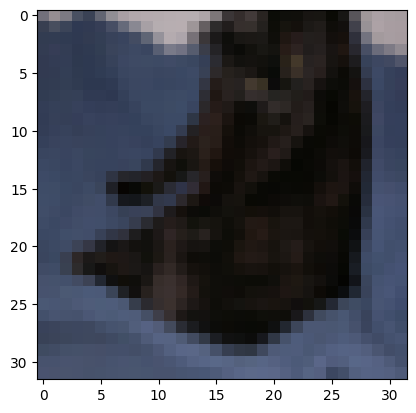

Prediction:  5    Class:  dog


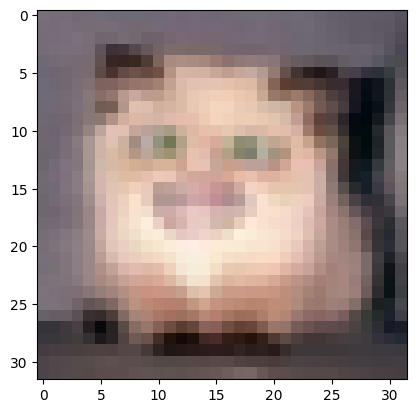

Prediction:  3    Class:  cat


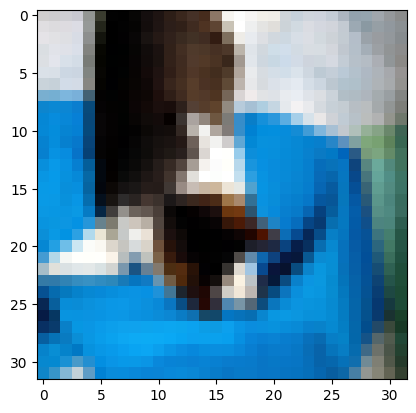

Prediction:  5    Class:  dog


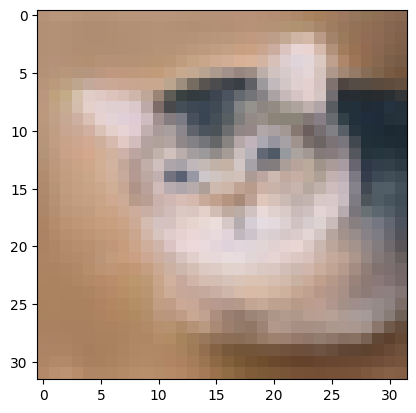

Prediction:  6    Class:  frog


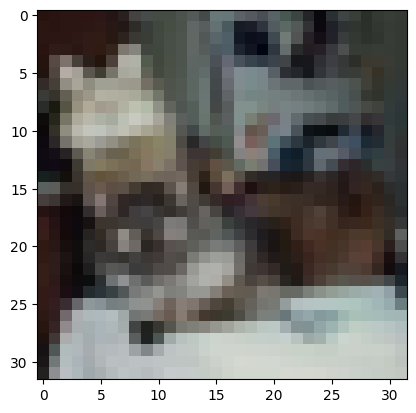

Prediction:  3    Class:  cat


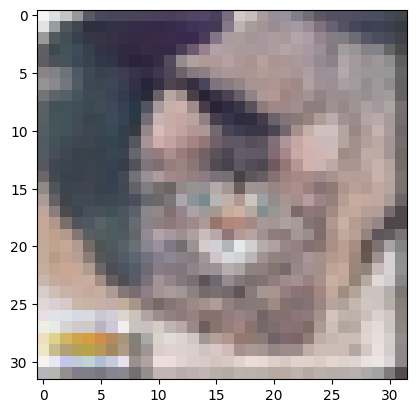

Prediction:  5    Class:  dog


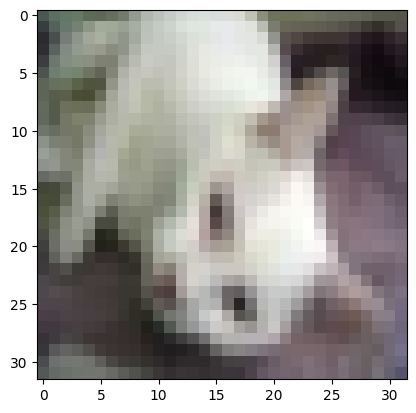

Prediction:  6    Class:  frog


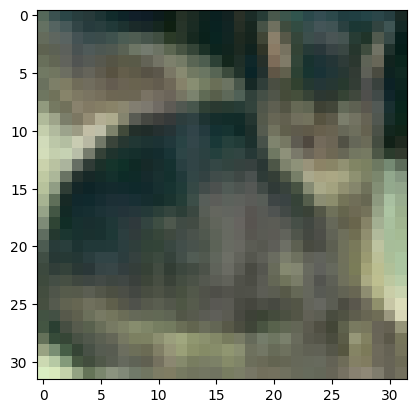

Prediction:  3    Class:  cat


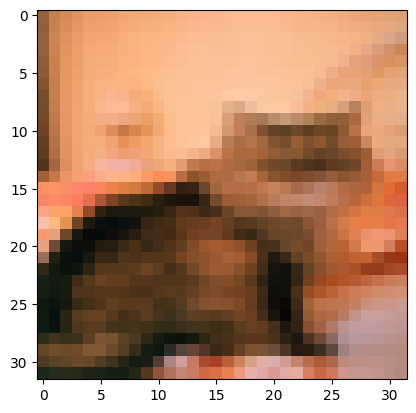

Prediction:  3    Class:  cat


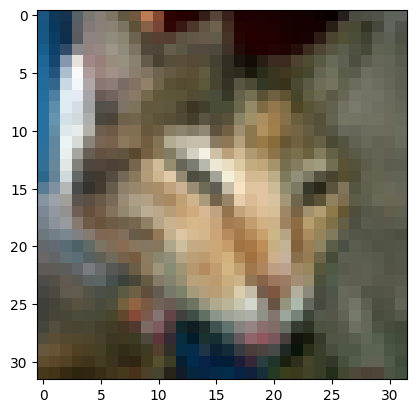

Prediction:  4    Class:  deer


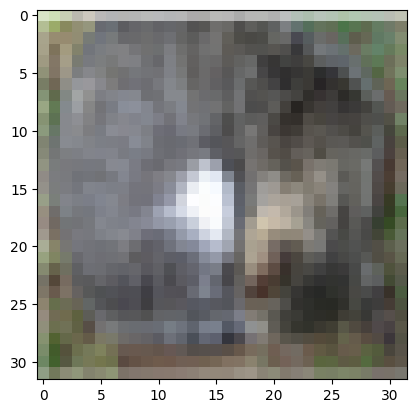

Prediction:  4    Class:  deer


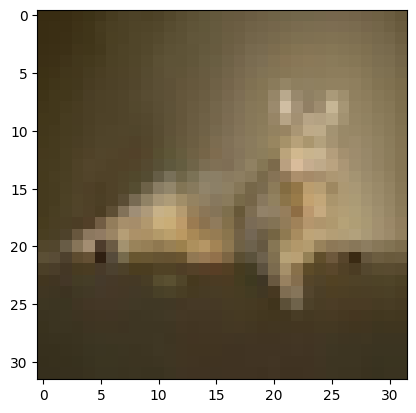

Prediction:  3    Class:  cat


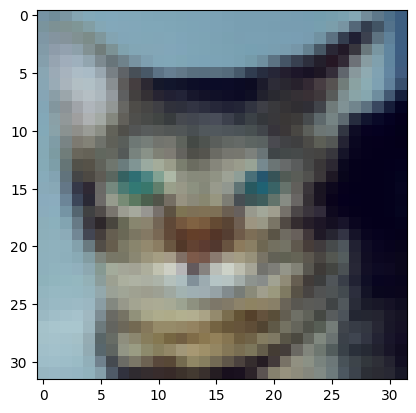

Prediction:  3    Class:  cat


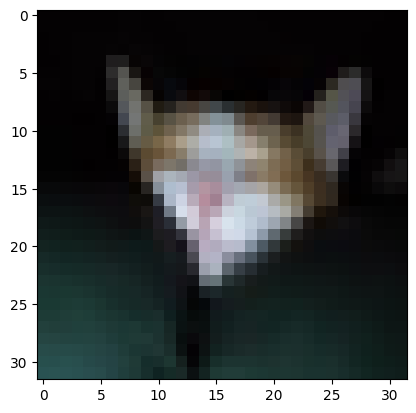

Prediction:  3    Class:  cat


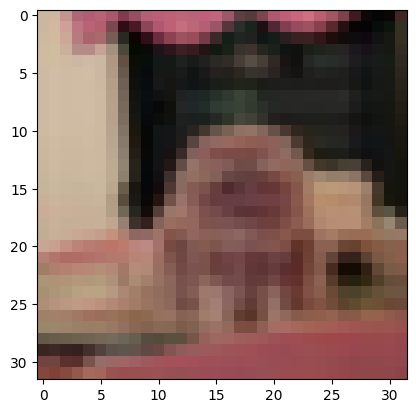

Prediction:  3    Class:  cat


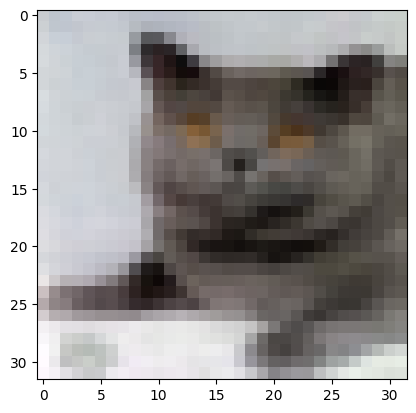

Prediction:  3    Class:  cat


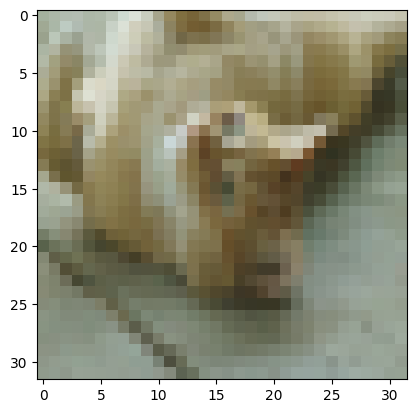

Prediction:  2    Class:  bird


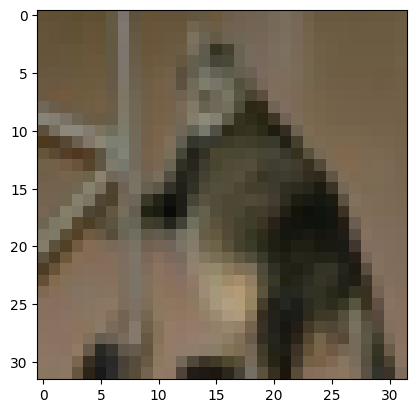

Prediction:  8    Class:  ship


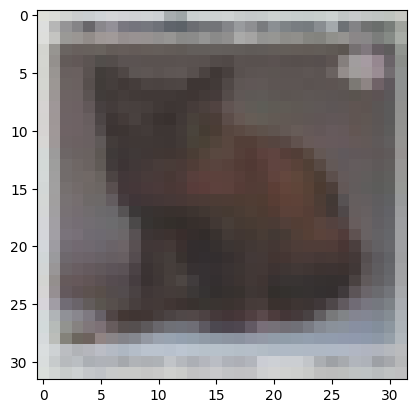

Prediction:  3    Class:  cat


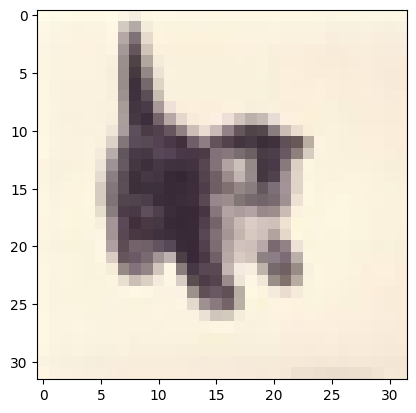

Prediction:  3    Class:  cat


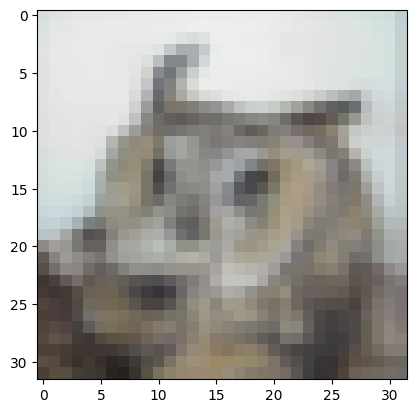

Prediction:  5    Class:  dog


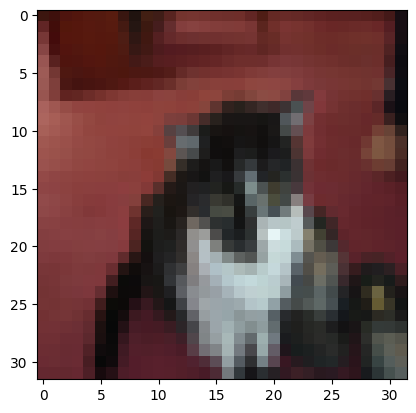

Prediction:  2    Class:  bird


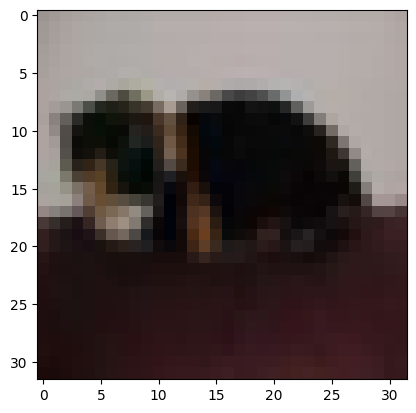

Prediction:  3    Class:  cat


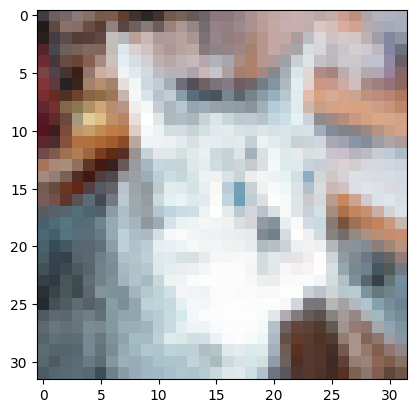

Prediction:  3    Class:  cat


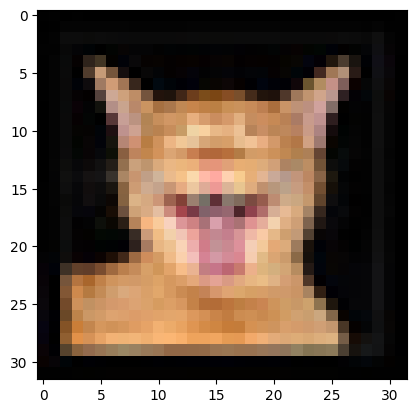

Prediction:  3    Class:  cat


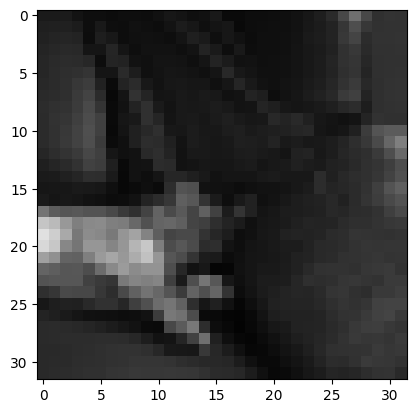

Prediction:  3    Class:  cat


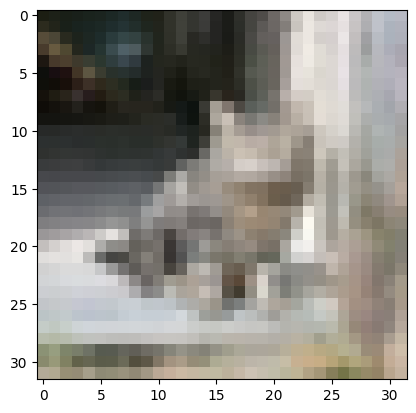

Prediction:  0    Class:  airplane


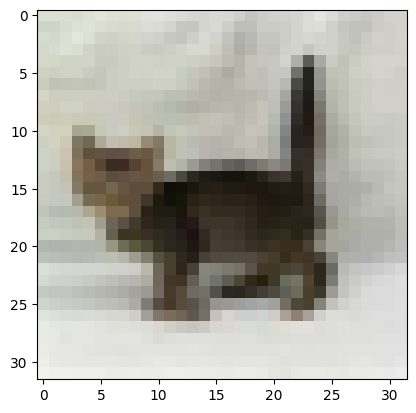

Prediction:  3    Class:  cat


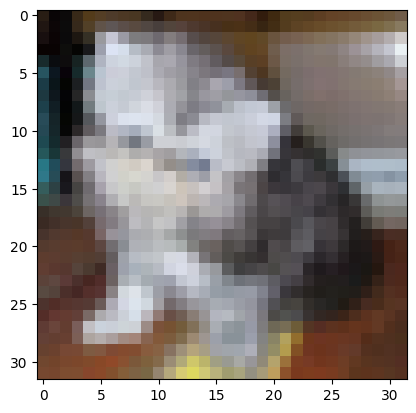

Prediction:  3    Class:  cat


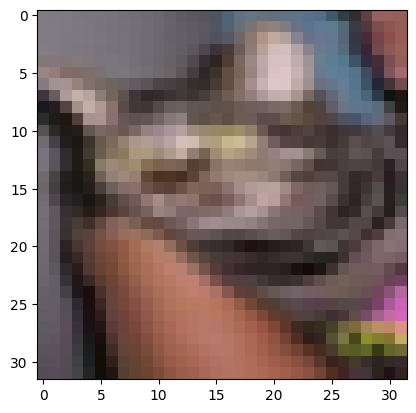

Prediction:  2    Class:  bird


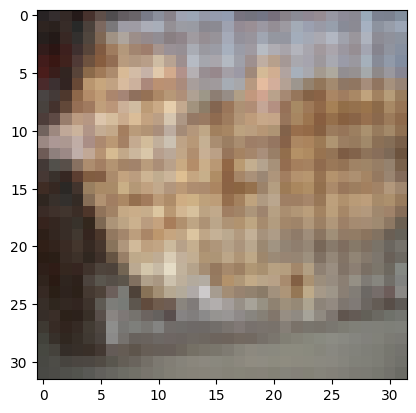

Prediction:  3    Class:  cat


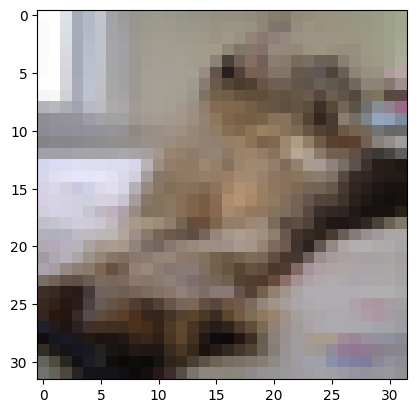

Prediction:  3    Class:  cat


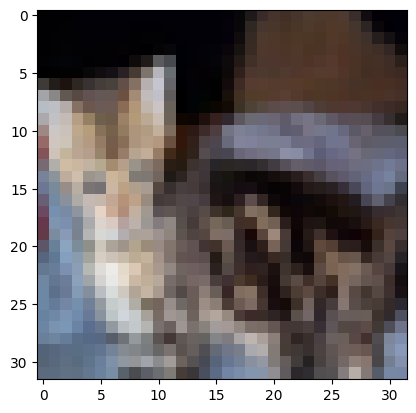

Prediction:  3    Class:  cat


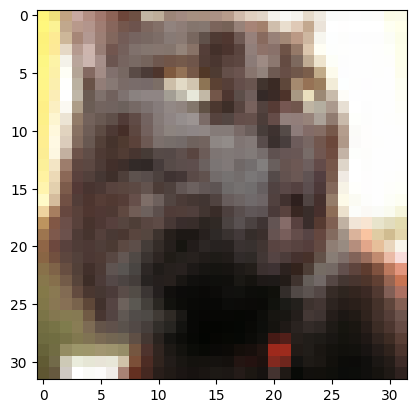

Prediction:  8    Class:  ship


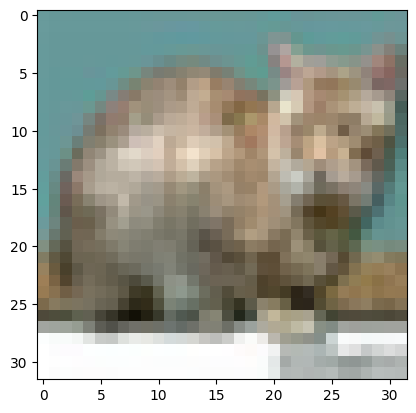

Prediction:  0    Class:  airplane


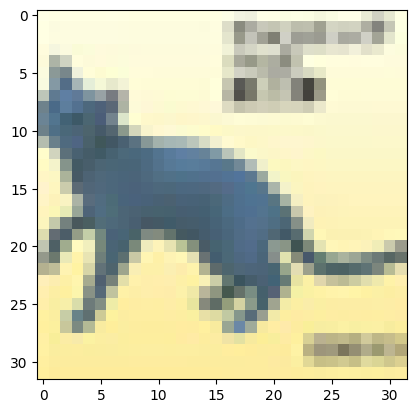

Prediction:  2    Class:  bird


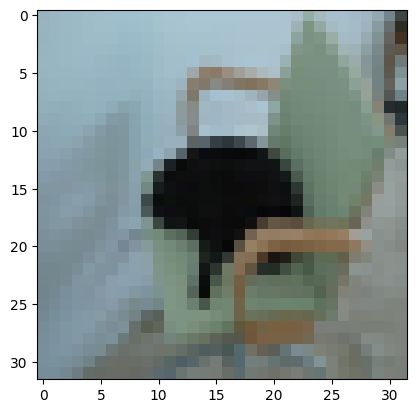

Prediction:  3    Class:  cat


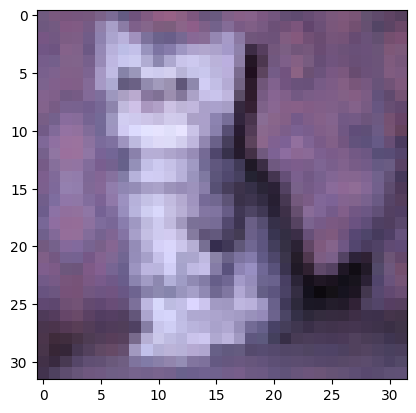

Prediction:  2    Class:  bird


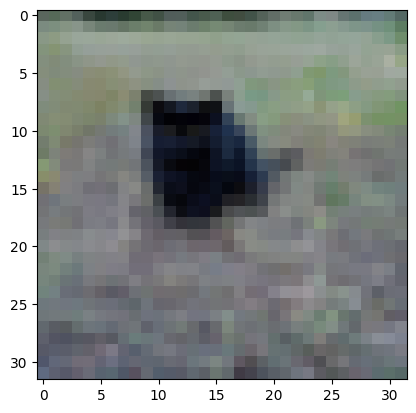

Prediction:  5    Class:  dog


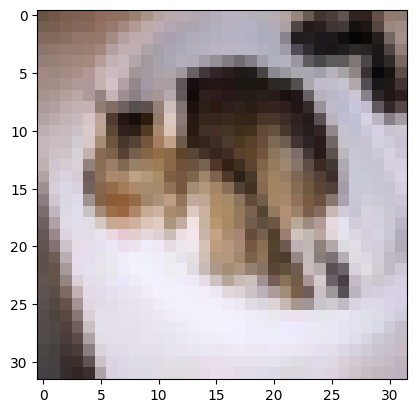

Prediction:  8    Class:  ship


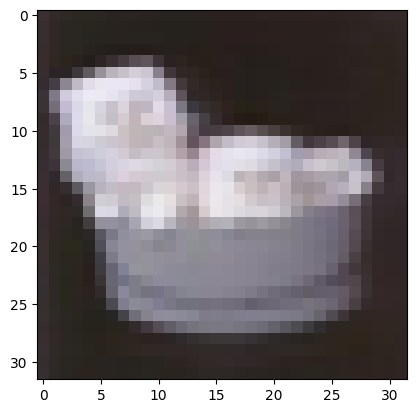

Prediction:  3    Class:  cat


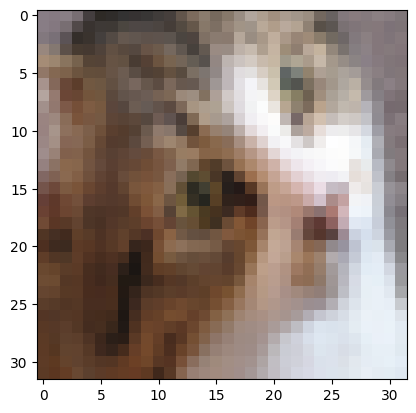

Prediction:  3    Class:  cat


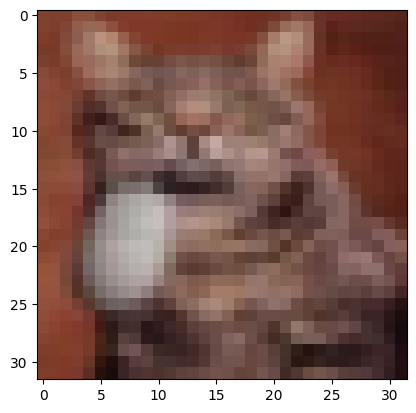

Prediction:  5    Class:  dog


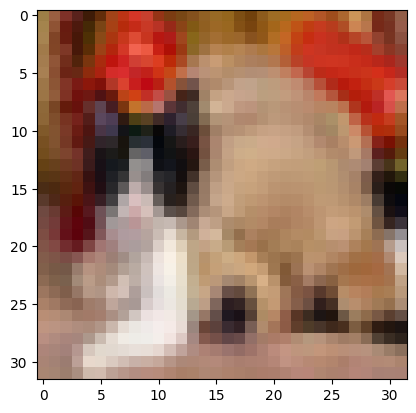

Prediction:  3    Class:  cat


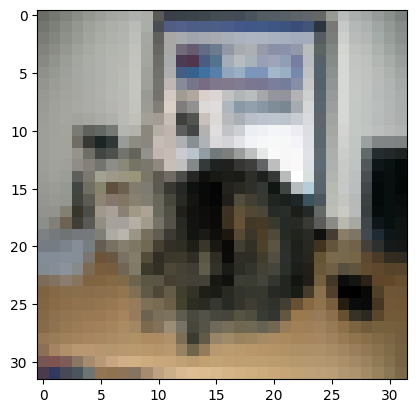

Prediction:  5    Class:  dog


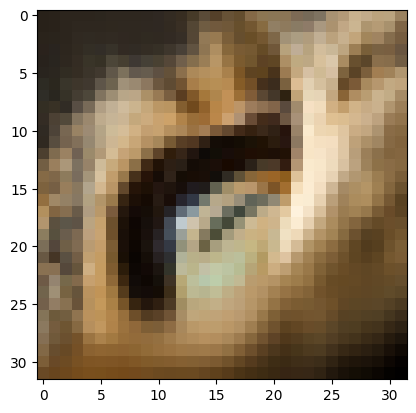

Prediction:  3    Class:  cat


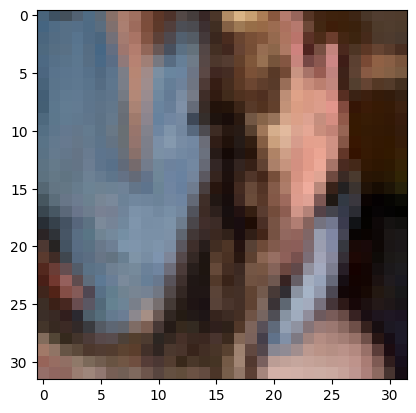

Prediction:  5    Class:  dog


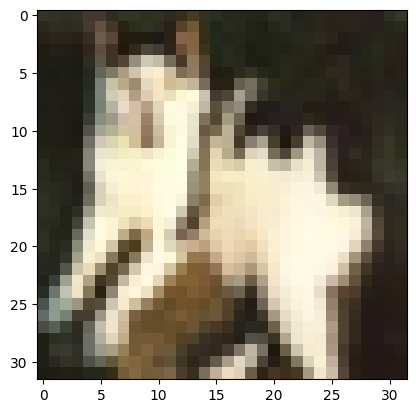

Prediction:  4    Class:  deer


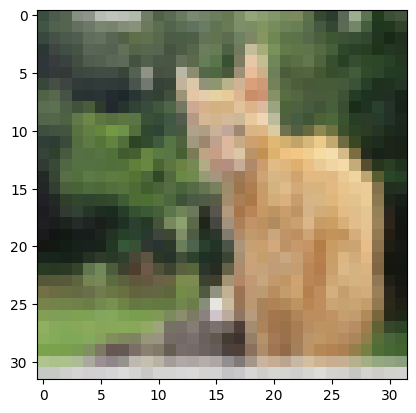

Prediction:  3    Class:  cat


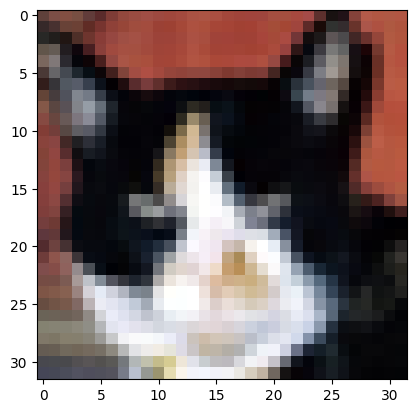

Prediction:  3    Class:  cat


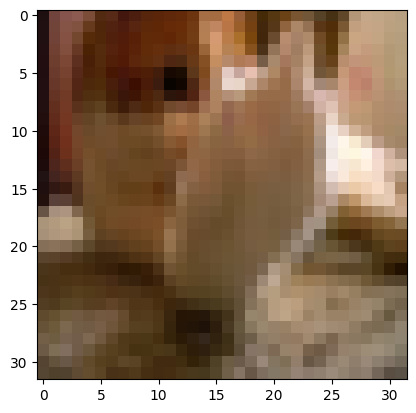

Prediction:  3    Class:  cat


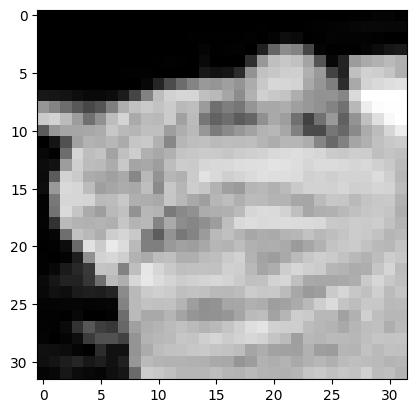

Prediction:  2    Class:  bird


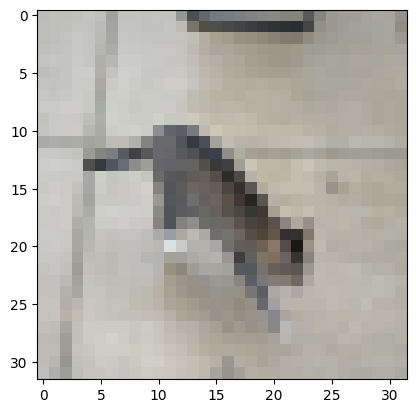

Prediction:  9    Class:  truck


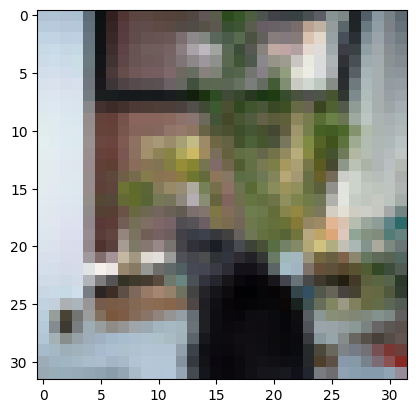

Prediction:  5    Class:  dog


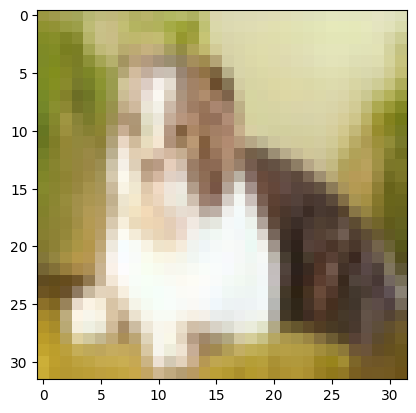

Prediction:  2    Class:  bird


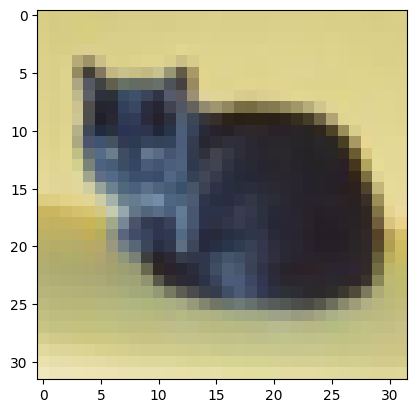

Prediction:  3    Class:  cat


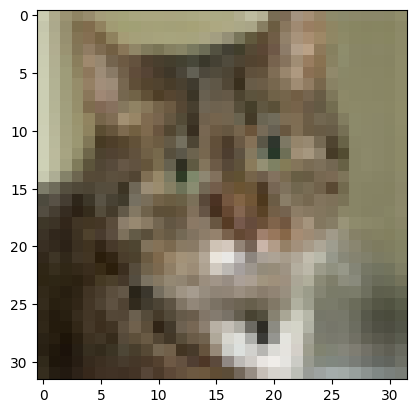

Prediction:  7    Class:  horse


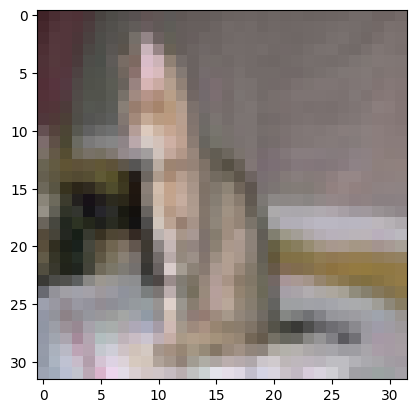

Prediction:  3    Class:  cat


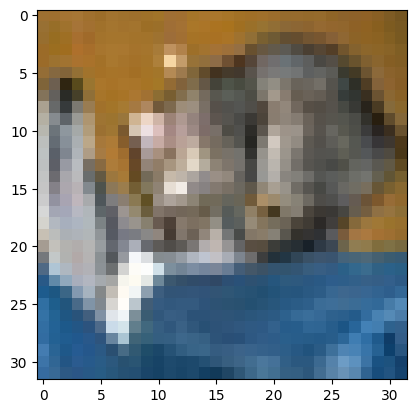

Prediction:  3    Class:  cat


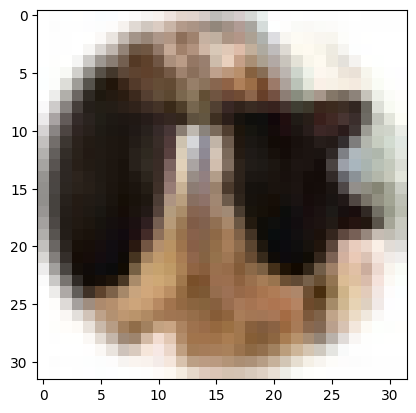

Prediction:  3    Class:  cat


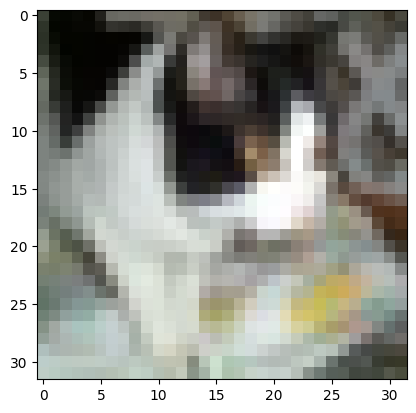

Prediction:  3    Class:  cat


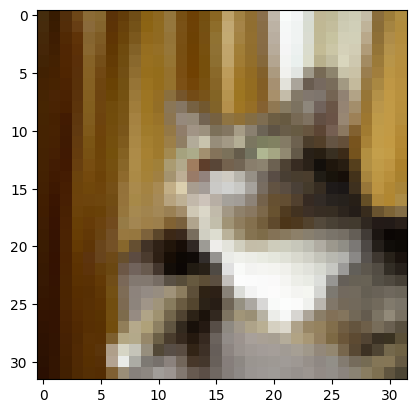

Prediction:  8    Class:  ship


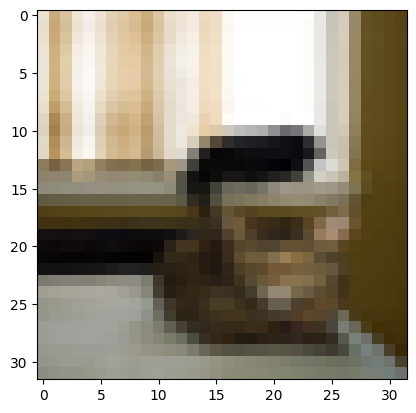

Prediction:  3    Class:  cat


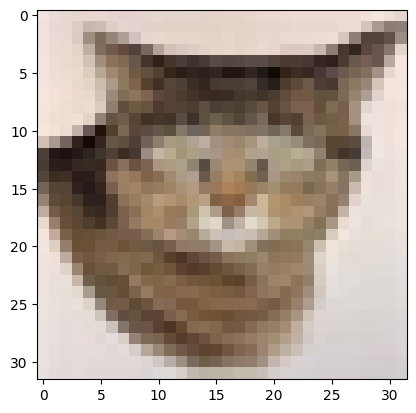

Prediction:  3    Class:  cat


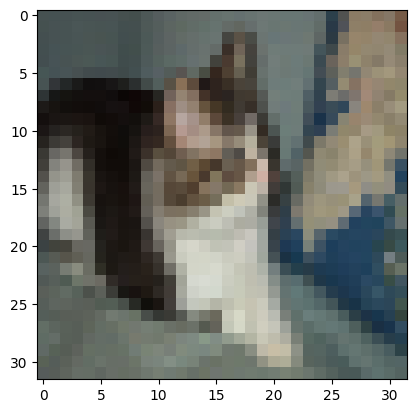

Prediction:  3    Class:  cat


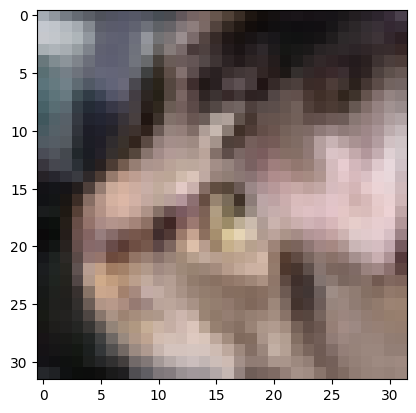

Prediction:  5    Class:  dog


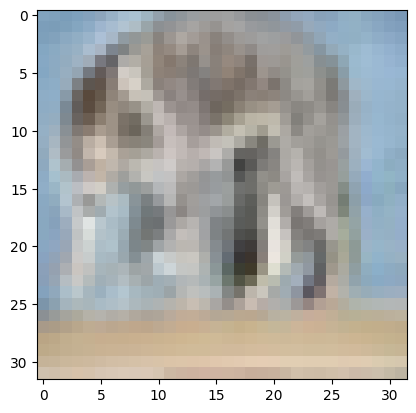

Prediction:  3    Class:  cat


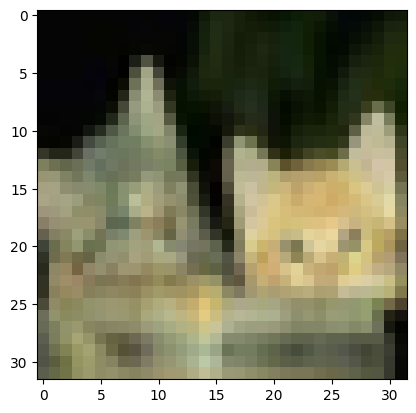

Prediction:  3    Class:  cat


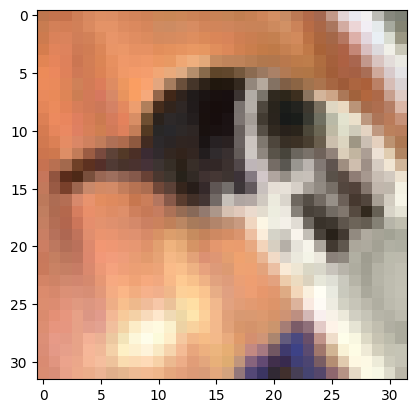

Prediction:  3    Class:  cat


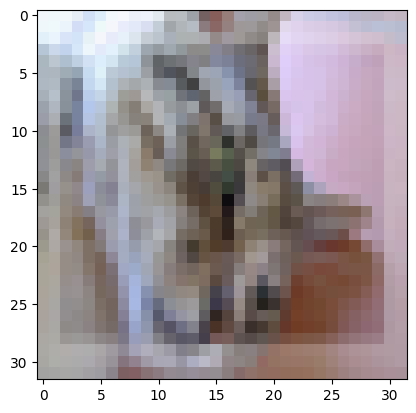

Prediction:  3    Class:  cat


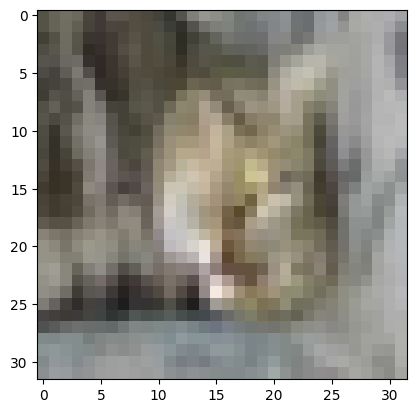

Prediction:  3    Class:  cat


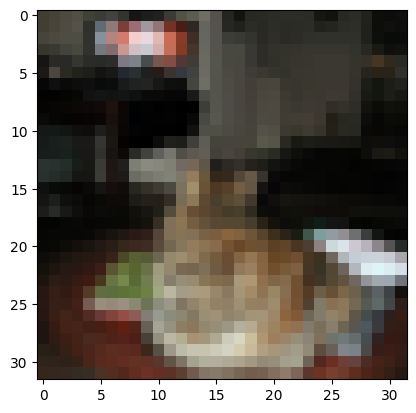

Prediction:  6    Class:  frog


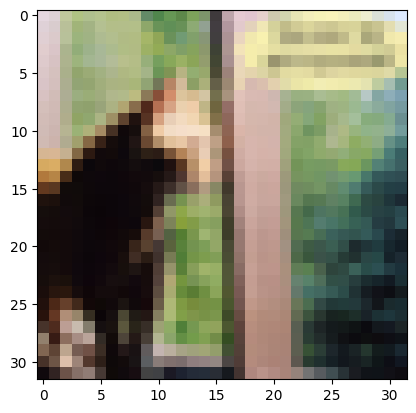

Prediction:  5    Class:  dog


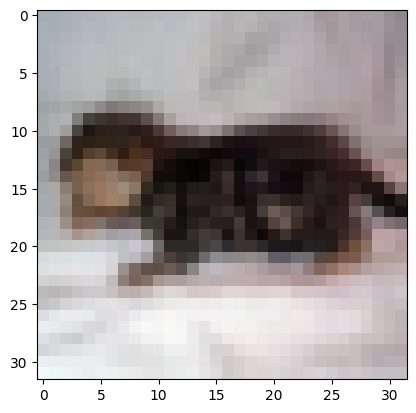

Prediction:  3    Class:  cat


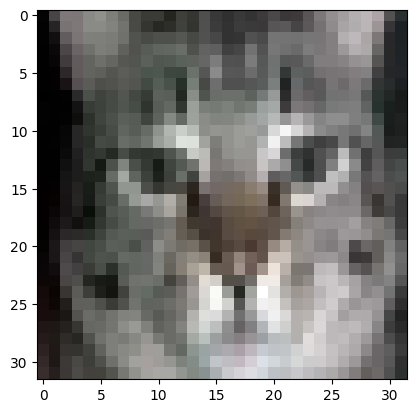

Prediction:  5    Class:  dog


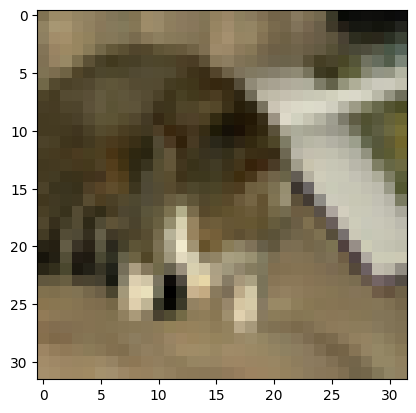

Prediction:  3    Class:  cat


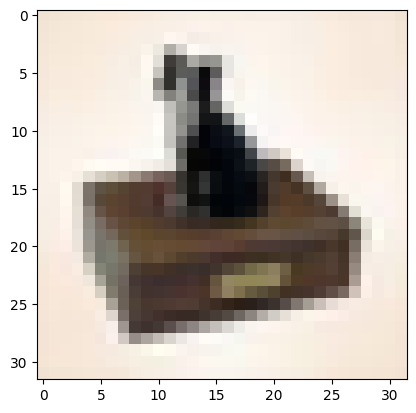

Prediction:  7    Class:  horse


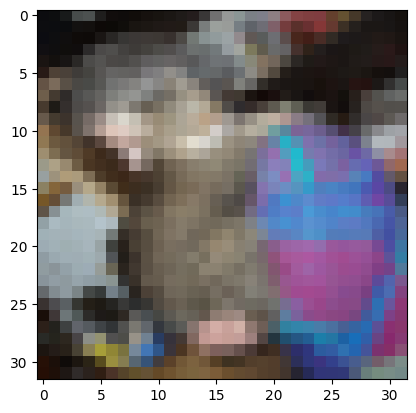

Prediction:  3    Class:  cat


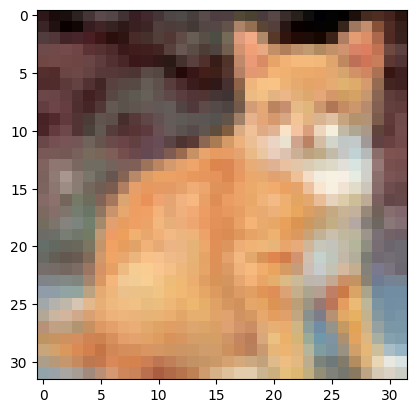

Prediction:  1    Class:  automobile


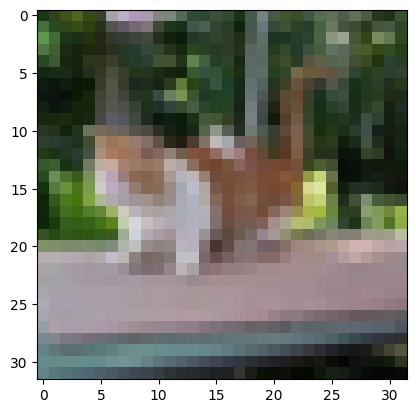

Prediction:  3    Class:  cat


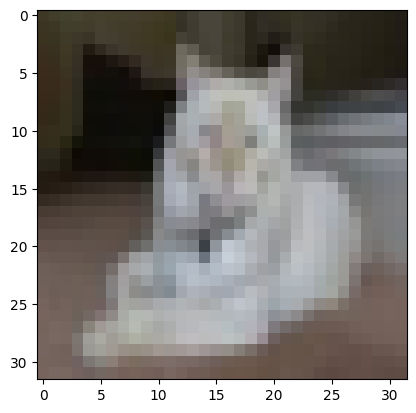

Prediction:  1    Class:  automobile


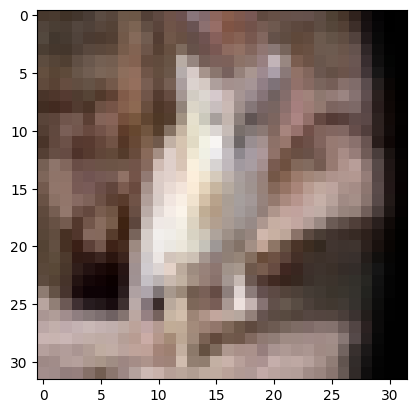

Prediction:  1    Class:  automobile


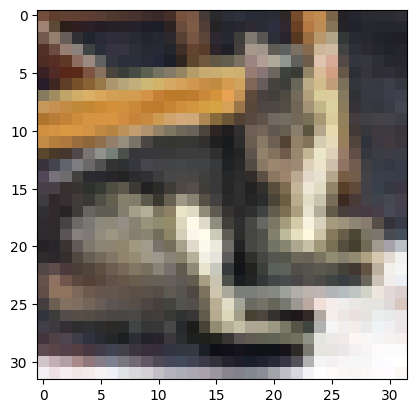

Prediction:  3    Class:  cat


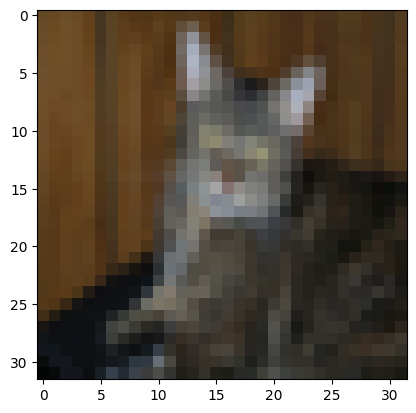

Prediction:  3    Class:  cat


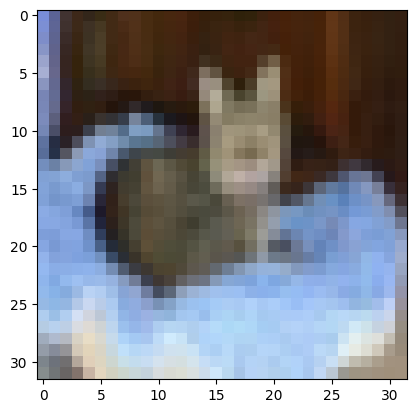

Prediction:  9    Class:  truck


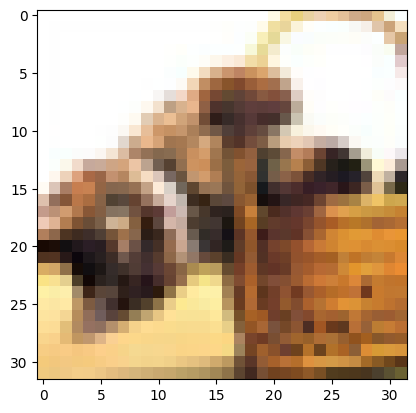

Prediction:  3    Class:  cat


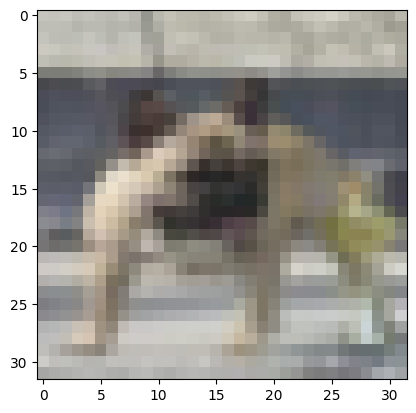

Prediction:  8    Class:  ship


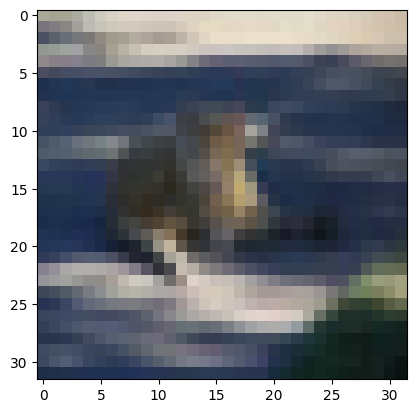

Prediction:  3    Class:  cat


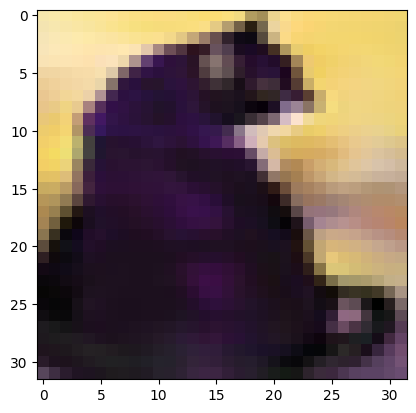

Prediction:  2    Class:  bird


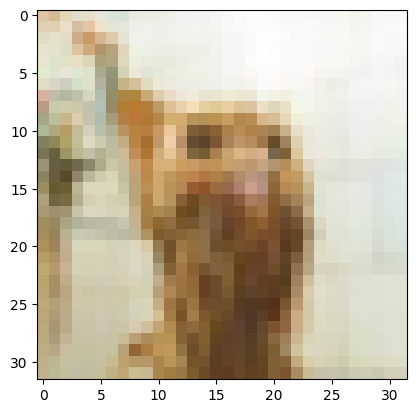

Prediction:  3    Class:  cat


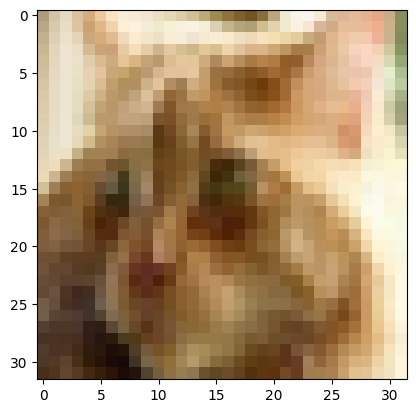

Prediction:  3    Class:  cat


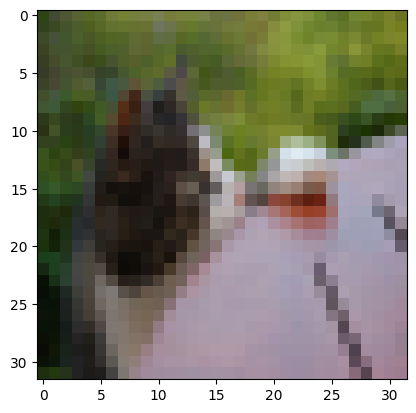

Prediction:  3    Class:  cat


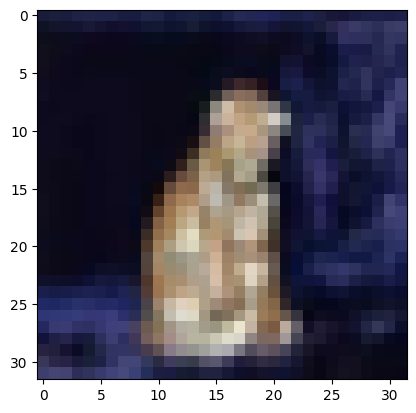

Prediction:  5    Class:  dog


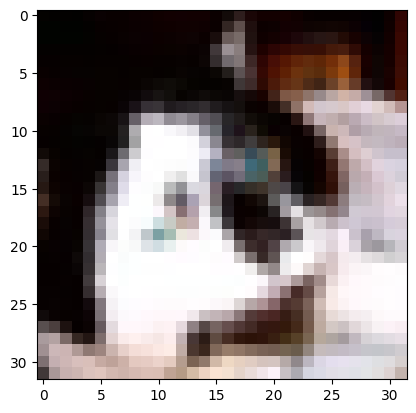

Prediction:  3    Class:  cat


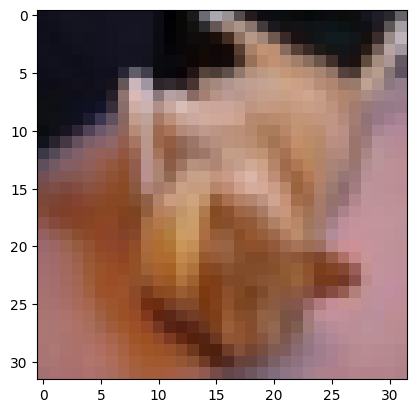

Prediction:  3    Class:  cat


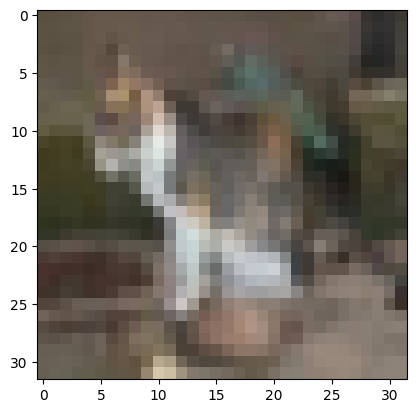

Prediction:  3    Class:  cat


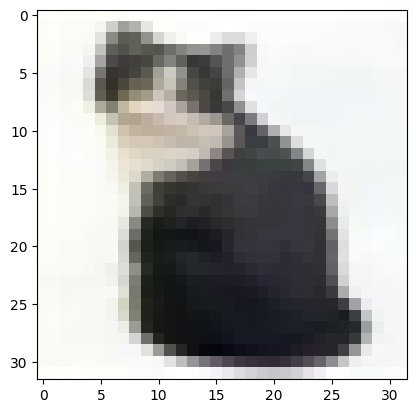

Prediction:  3    Class:  cat


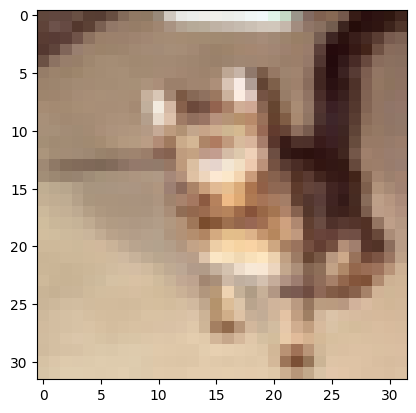

Prediction:  6    Class:  frog


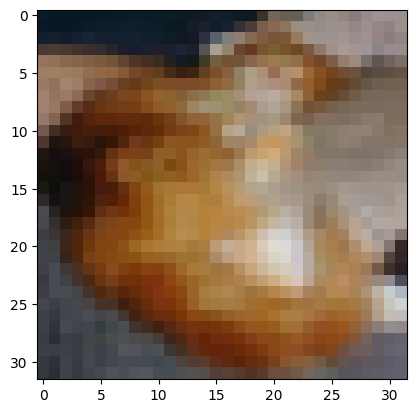

Prediction:  3    Class:  cat


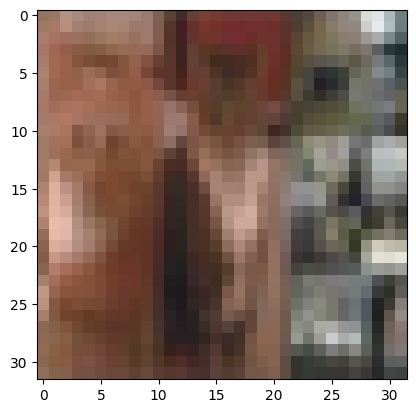

Prediction:  3    Class:  cat


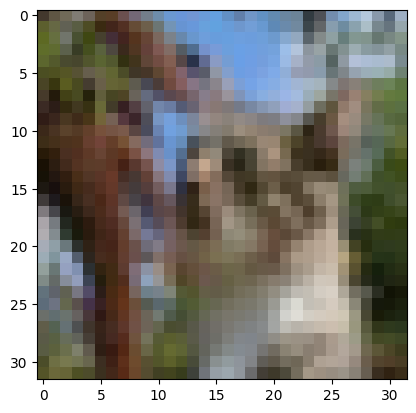

Prediction:  9    Class:  truck


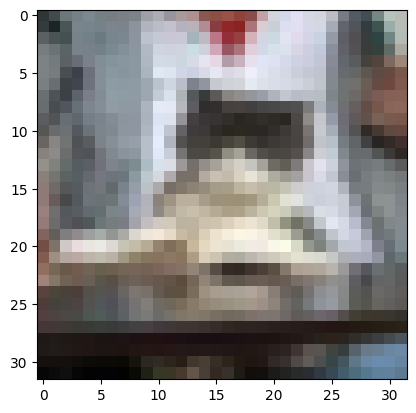

Prediction:  5    Class:  dog


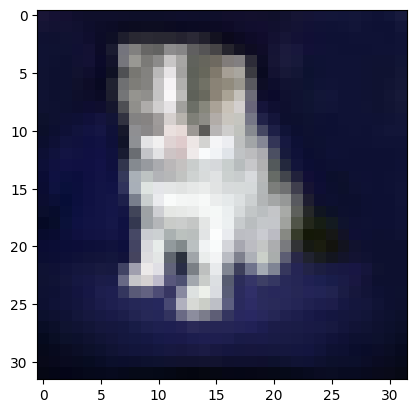

Prediction:  5    Class:  dog


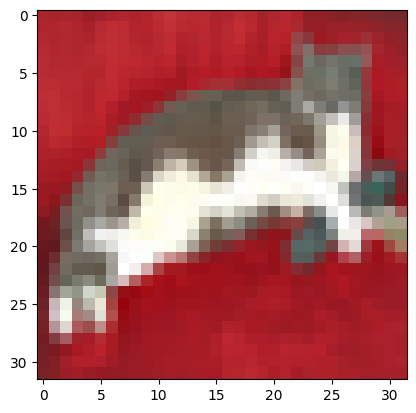

Prediction:  5    Class:  dog


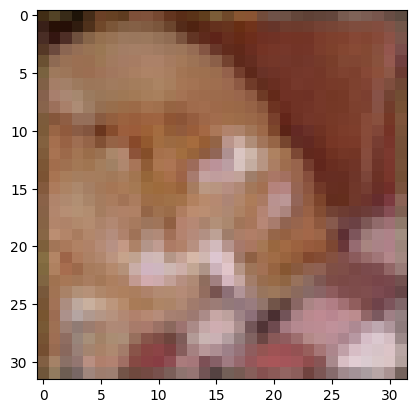

Prediction:  3    Class:  cat


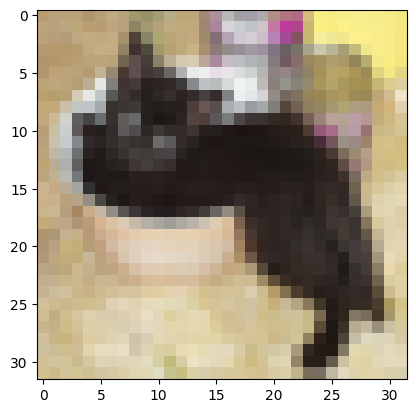

Prediction:  7    Class:  horse


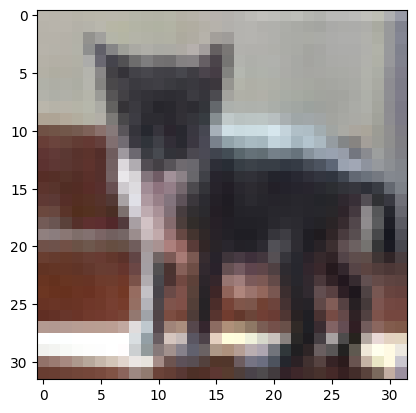

Prediction:  3    Class:  cat


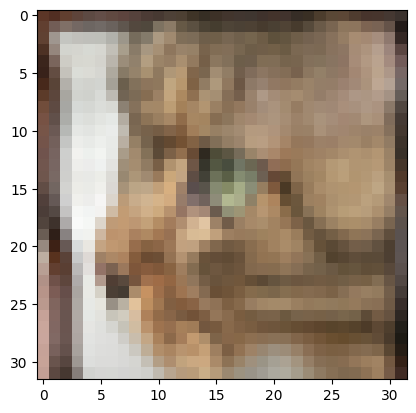

Prediction:  3    Class:  cat


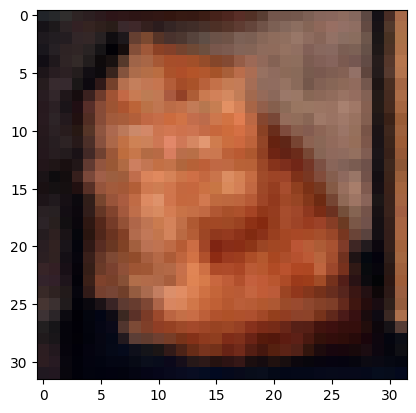

Prediction:  3    Class:  cat


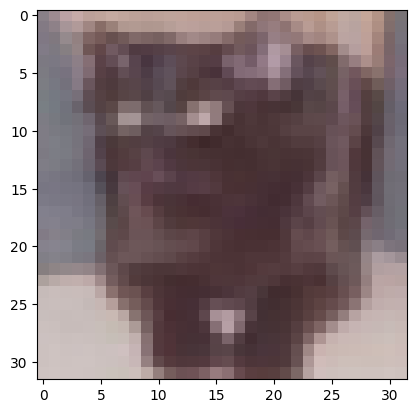

Prediction:  6    Class:  frog


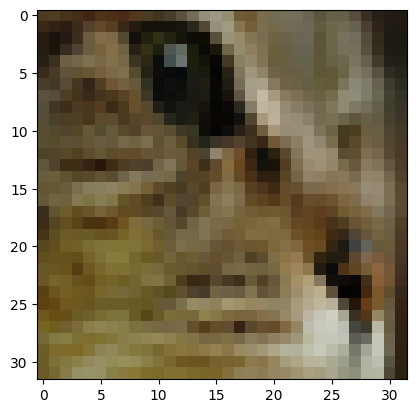

Prediction:  3    Class:  cat


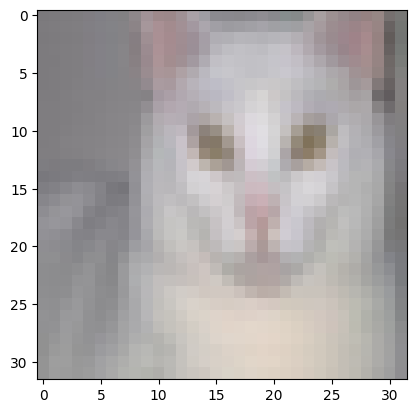

Prediction:  3    Class:  cat


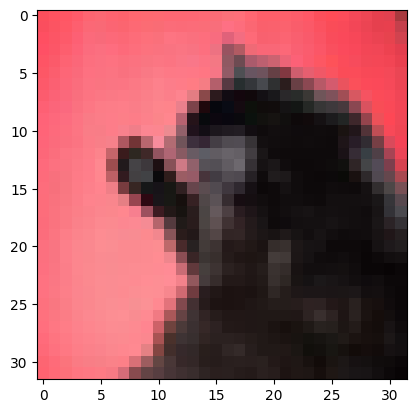

Prediction:  5    Class:  dog


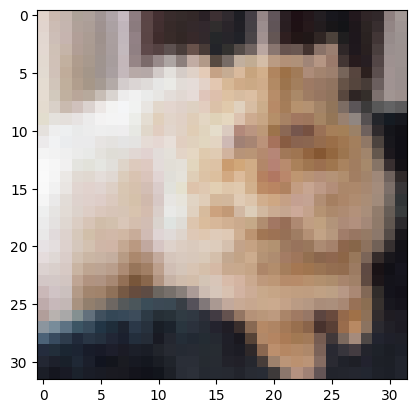

Prediction:  7    Class:  horse


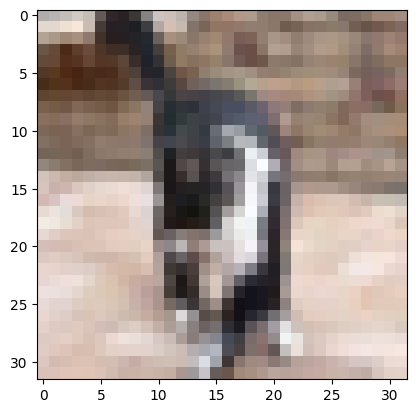

Prediction:  3    Class:  cat


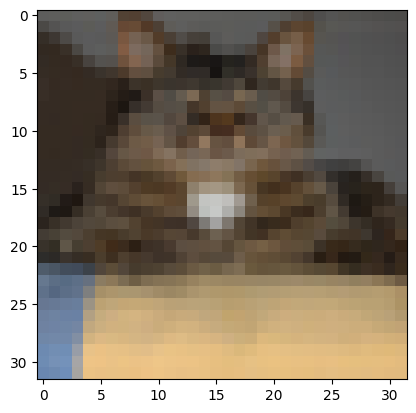

Prediction:  7    Class:  horse


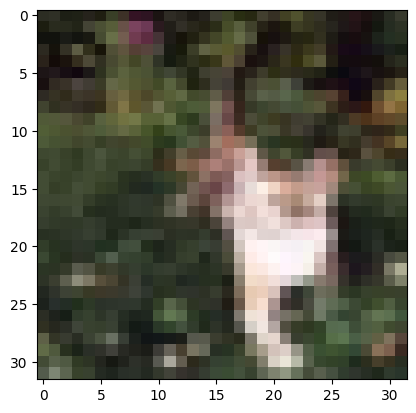

Prediction:  3    Class:  cat


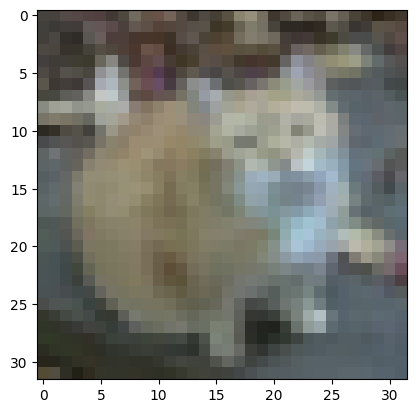

Prediction:  3    Class:  cat


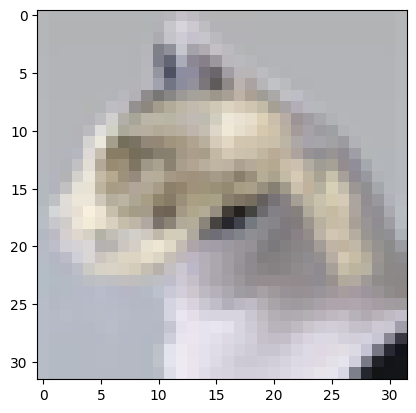

Prediction:  3    Class:  cat


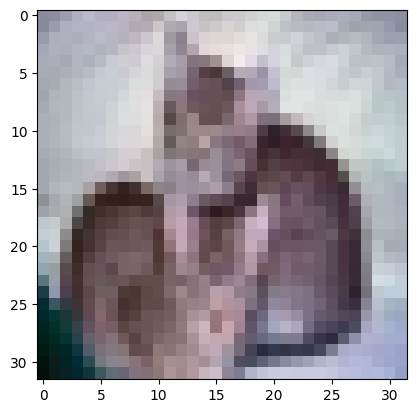

Prediction:  3    Class:  cat


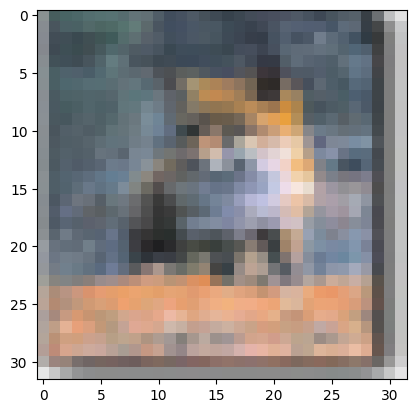

Prediction:  4    Class:  deer


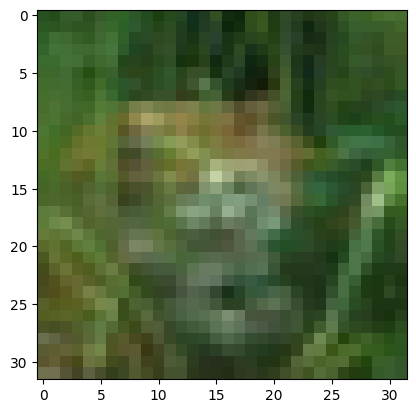

Prediction:  2    Class:  bird


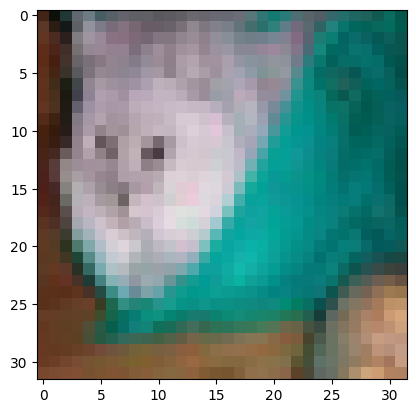

Prediction:  7    Class:  horse


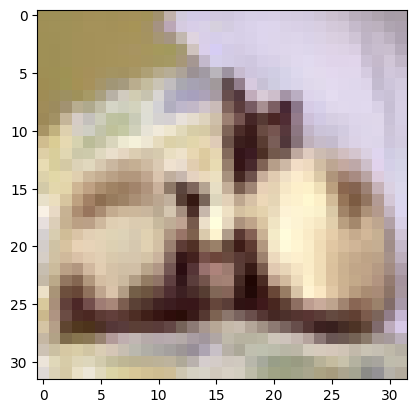

Prediction:  7    Class:  horse


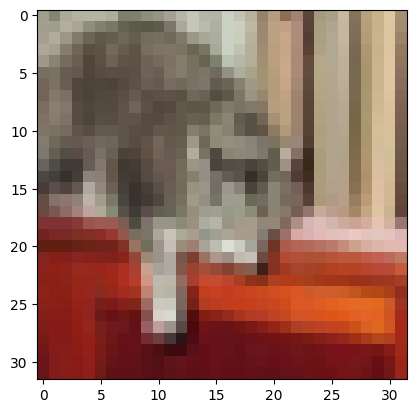

Prediction:  1    Class:  automobile


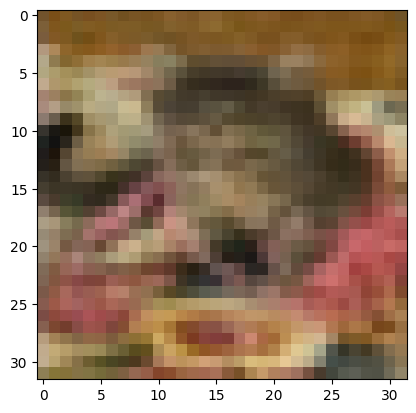

Prediction:  3    Class:  cat


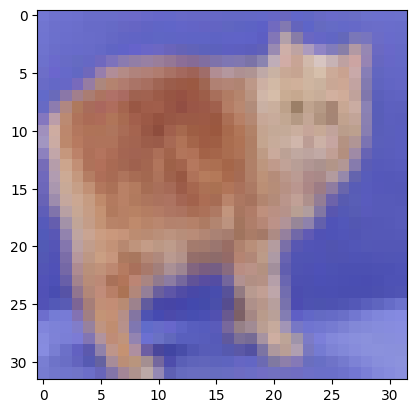

Prediction:  6    Class:  frog


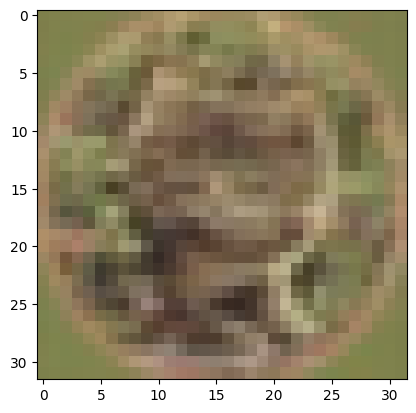

Prediction:  5    Class:  dog


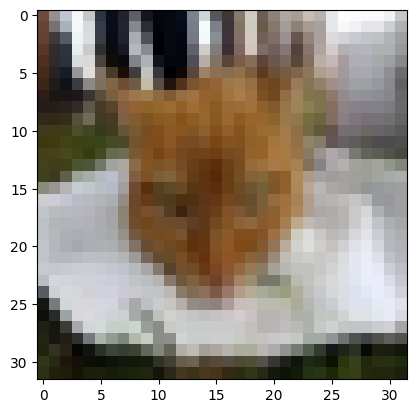

Prediction:  3    Class:  cat


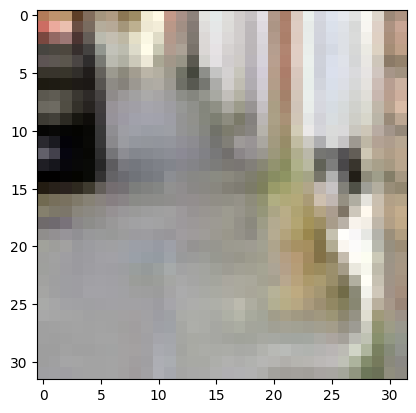

Prediction:  5    Class:  dog


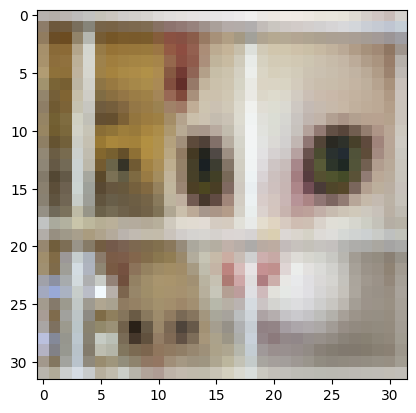

Prediction:  3    Class:  cat


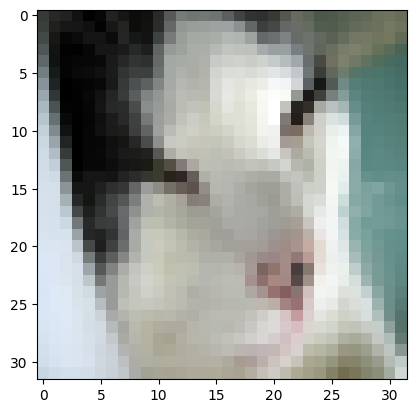

Prediction:  2    Class:  bird


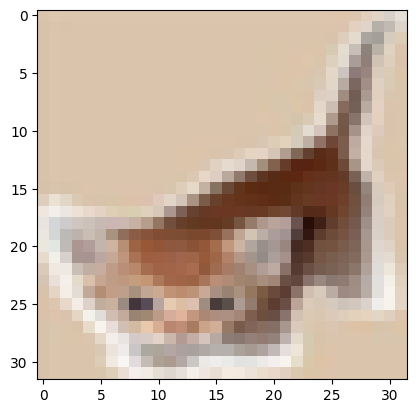

Prediction:  3    Class:  cat


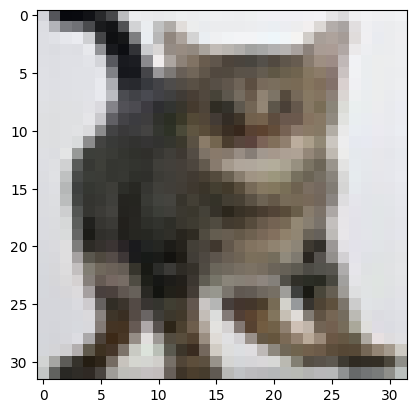

Prediction:  3    Class:  cat


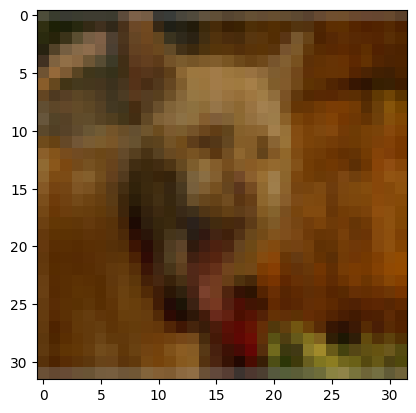

Prediction:  3    Class:  cat


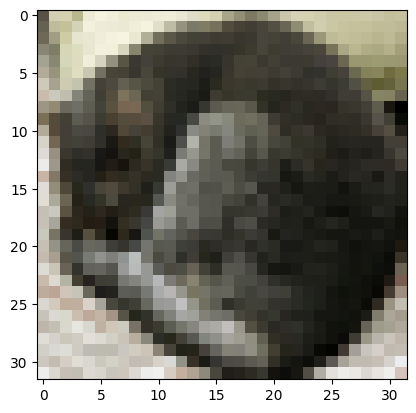

Prediction:  1    Class:  automobile


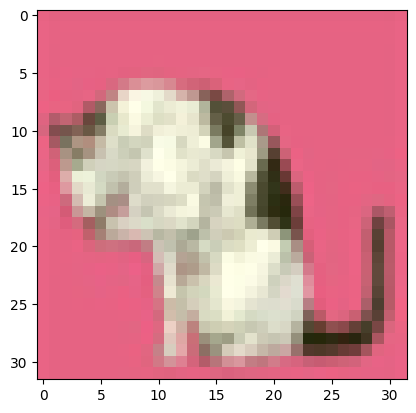

Prediction:  9    Class:  truck


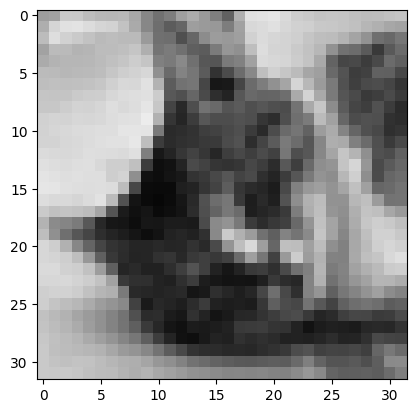

Prediction:  8    Class:  ship


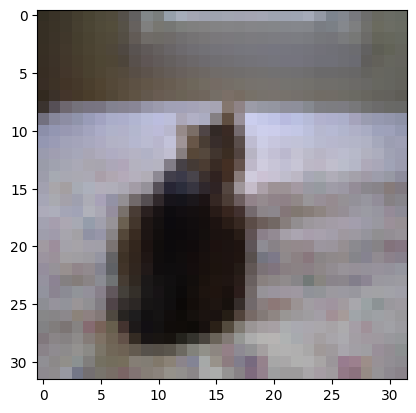

Prediction:  2    Class:  bird


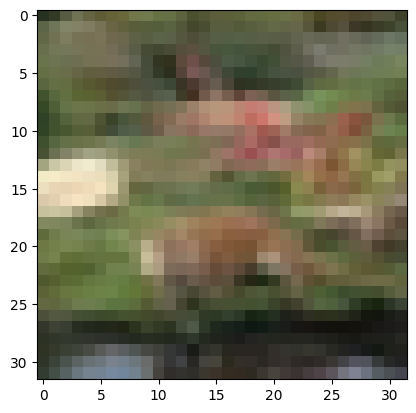

Prediction:  5    Class:  dog


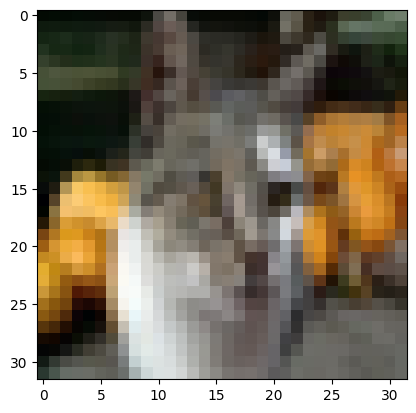

Prediction:  3    Class:  cat


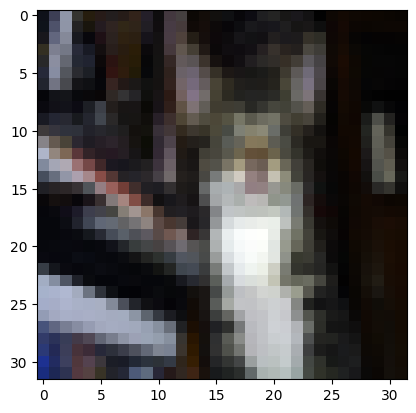

Prediction:  7    Class:  horse


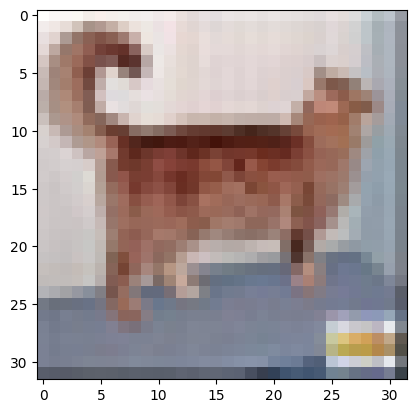

Prediction:  6    Class:  frog


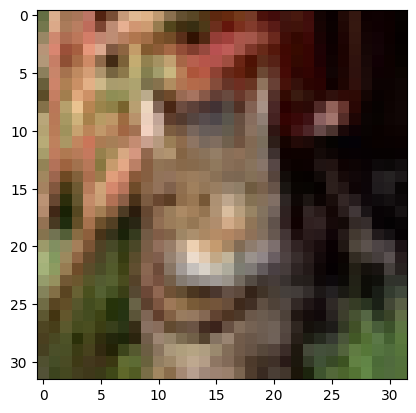

Prediction:  6    Class:  frog


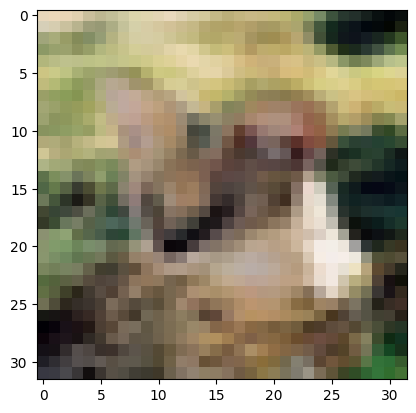

Prediction:  9    Class:  truck


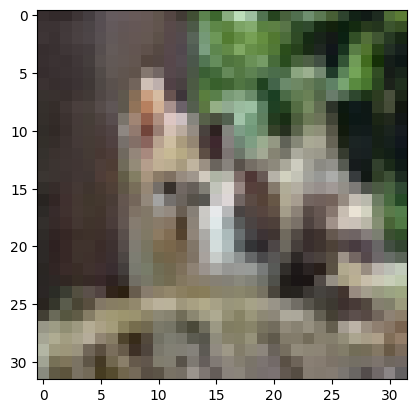

Prediction:  4    Class:  deer


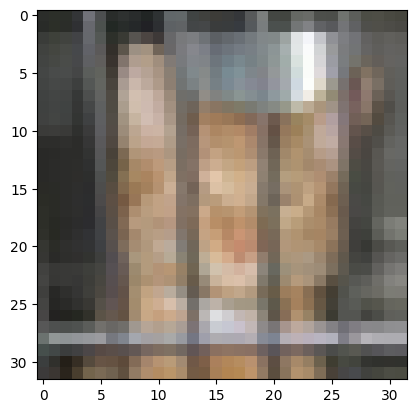

Prediction:  3    Class:  cat


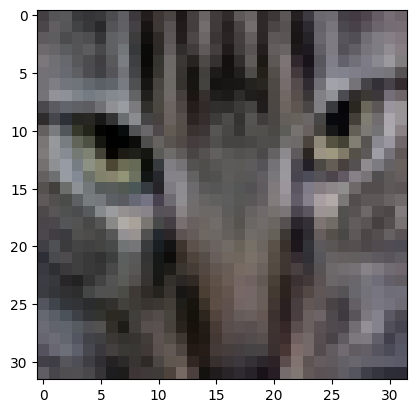

Prediction:  3    Class:  cat


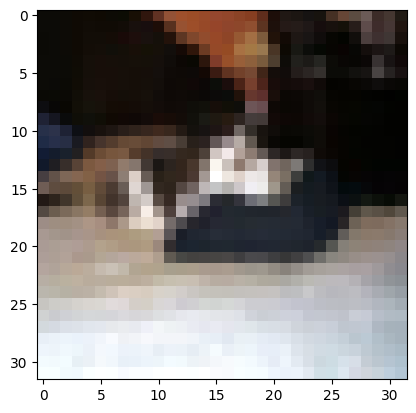

Prediction:  3    Class:  cat


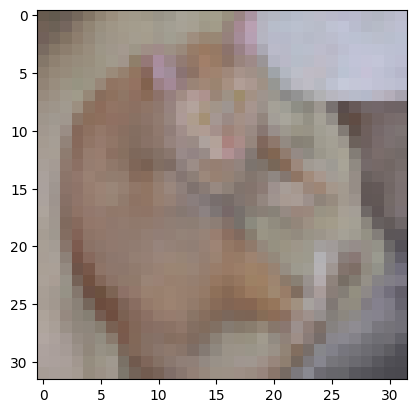

Prediction:  5    Class:  dog


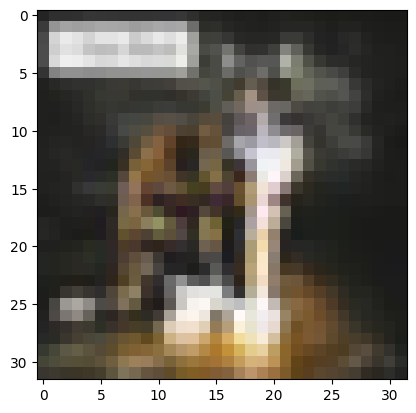

Prediction:  6    Class:  frog


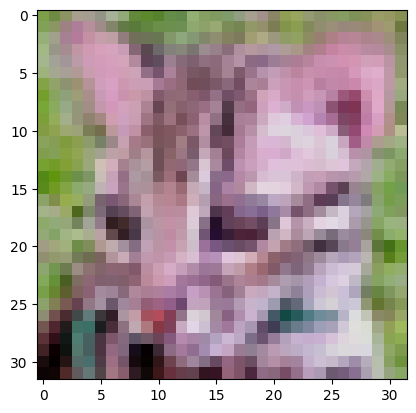

Prediction:  7    Class:  horse


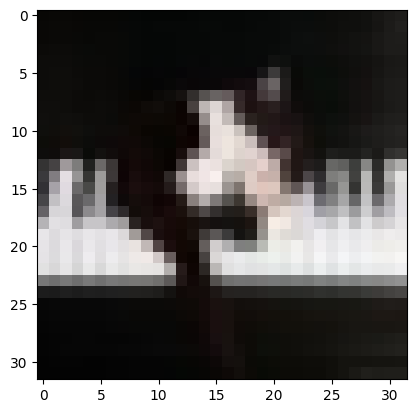

Prediction:  3    Class:  cat


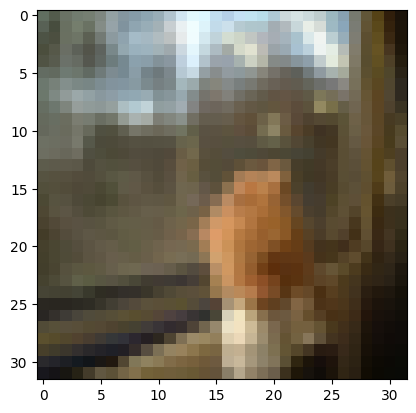

Prediction:  3    Class:  cat


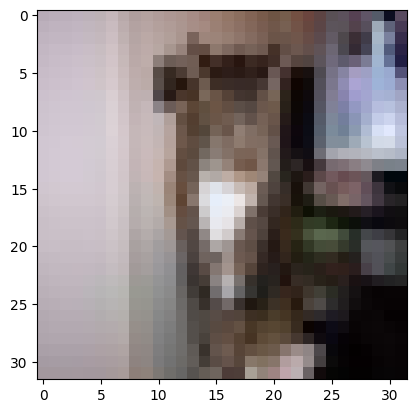

Prediction:  7    Class:  horse


In [ ]:
preds = []
for image in images:
    
  img = image_loader(image)
  pred = (model(img)).data.cpu().numpy().argmax()
  preds.append(pred)    
  print('Prediction: ', pred, '  ','Class: ', classes[pred])
    
  imshow(image)  
  plt.show()